<a href="https://colab.research.google.com/github/RachelRamirez/misclassification_matrix/blob/main/Exp_5Bins_11Runs_40D_with_SGD_LR_0point1_DiffInitSeedsperRep.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [38]:
#@title
# How to change the local time in Google Colab
!rm /etc/localtime
!ln -s /usr/share/zoneinfo/US/Eastern /etc/localtime
!date

#If this doesn't show the local time correctly, then you need to restart.
import time
time.localtime(time.time())

import datetime

# get current date and time
now = datetime.datetime.now()

Thu 04 May 2023 12:21:22 PM EDT


time.struct_time(tm_year=2023, tm_mon=5, tm_mday=4, tm_hour=16, tm_min=21, tm_sec=22, tm_wday=3, tm_yday=124, tm_isdst=0)

We'll start by writing a `.py` file which we'll import.

In [39]:
#@title
# import ImportLibraries_DefineFunctions
import requests
url = 'https://raw.githubusercontent.com/RachelRamirez/misclassification_matrix/main/ImportLibraries_DefineFunctions.py'
r = requests.get(url)


# make sure your filename is the same as how you want to import 
with open('ImportLibraries_DefineFunctions.py', 'w') as f:
    f.write(r.text)

# now we can import


In [41]:
#@title
# #@title
# # Bring the file into the local Python environment.
execfile('ImportLibraries_DefineFunctions.py')

# Call the function defined in the file.
# f()
time.localtime(time.time())

TF version:  2.12.0
Keras version:  2.12.0
Finished Loading Libraries
11490434/11490434 [==============================] - 0s 0us/step
60000 train samples
7500 validation samples
2500 test samples
Train [0.09871667 0.11236667 0.0993     0.10218333 0.09736667 0.09035
 0.09863333 0.10441667 0.09751666 0.09915   ]
Train # of 9s 5949.0
Train # of 4s 5842.0
Val [0.09586667 0.1132     0.10453334 0.10066666 0.09986667 0.09013333
 0.09413333 0.1016     0.09746667 0.10253333]
Val # of 9s 769.0
Val # of 4s 749.0
Test [0.1044 0.1144 0.0992 0.102  0.0932 0.0864 0.1008 0.1064 0.0972 0.096 ]
Test  # of 9s 240.0
Test  # of 4s 233.0


time.struct_time(tm_year=2023, tm_mon=5, tm_mday=4, tm_hour=12, tm_min=21, tm_sec=28, tm_wday=3, tm_yday=124, tm_isdst=1)

In [72]:
#@title
# #As of 4/18 I am changing this code to save weights initially after five epochs using lambdavalue=1 initially

# rms = RMSprop()  #https://keras.io/api/optimizers/rmsprop/ #default learning_rate=0.001
sgd = SGD(learning_rate=0.1)

patience = 0


# SET THE IITIAL LAMBDA VALUE! 
cost_matrix = np.ones((10,10))
lambda_val = 1

Truth=9
Predicted=4
cost_matrix[Truth, Predicted] = lambda_val


# # Define the per-epoch callback.
cm_callback = tf.keras.callbacks.LambdaCallback(on_epoch_end=log_confusion_matrix, )
# cr_callback = tf.keras.callbacks.LambdaCallback(on_epoch_end=log_classification_report, )
# es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=patience, verbose=1, restore_best_weights = True)





# ## Examples from TDS
# from tensorflow.keras.callbacks import LambdaCallback
# epoch_callback = LambdaCallback(
#     on_epoch_begin=lambda epoch,logs: print('Starting Epoch {}!'.format(epoch+1))
# )
# batch_loss_callback = LambdaCallback(
#     on_batch_end=lambda batch,logs: print('\n After batch {}, the loss is {:7.2f}.'.format(batch, logs['loss']))
# )
# train_finish_callback = LambdaCallback(
#     on_train_end=lambda logs: print('Training finished!')
# )

# # Lambda function using if else & else if
# min = lambda a, b, c : f"{a} is smaller" if(a < b & b < c) \
#      else f"{b} is smaller"  if (b < c) else f"{c} is smaller" 
# print(min(40, 30, 10))

epoch_callback = tf.keras.callbacks.LambdaCallback(on_epoch_end = lambda epoch,logs: 
                                                   print(' Epoch {} complete {}...'.format(epoch+1), end=" ")  if(epoch+1)%10==0 else print("", end=" ")  )


# cr_callback = tf.keras.callbacks.LambdaCallback(on_epoch_end= lambda epoch, logs:
# #                                                log_classification_report(epoch, logs) if(epoch+1)%5==0 else print(" ") )
#                                               #  return_cr if(epoch+1)%5==0 else print(" ") )


f1_callback = tf.keras.callbacks.LambdaCallback(on_epoch_end=log_f1_score)


# model = create_model()

# # save the model weights
# model.save_weights('initial_0epochs.h5')

# model.compile(loss=WeightedCategoricalCrossentropy(cost_matrix), optimizer=sgd,  metrics='categorical_accuracy',)

# model_history = model.fit(X_train, Y_train,  batch_size=batch_size, epochs=10, verbose=2,
# #         validation_data=(X_val, Y_val), shuffle=True, use_multiprocessing=True, callbacks = [ cm_callback, f1_callback])

# model.save_weights('initial_10epochs.h5')

 
# cr = return_cr(model)
!date


Thu 04 May 2023 12:49:56 PM EDT


In [ ]:
model.load_weights('initial_10epochs.h5') 


The code below to generate variations of the model training / validation results after training with a cost matrix 30 times did not produce any variability.   Therefore I want to shuffle the training/validation deck randomly between training sessions to see if that helps introduce some randomness.  

#### The Training Runs - Commented out to ensure not run again when the notebook is saved with output

This takes hours to run for about 40 replications so usually after running, I save the out put to GitHub for easy lookup later

In [ ]:
#@title
from google.colab import files

## -----------------------------------------------------------------------------------------------------
## Now we need to load the weights of the model, and continue training with a different cost matrix
## ------------------------------------------------------------------------------------------------------
# load the model weights
# model.load_weights('initial_5epochs.h5') 

df = pd.DataFrame()
cost_matrix = np.ones((10,10))

model_history_all = []
cm_all            = []

cost_list = [10, 100, 1000] # Each one takes about 2 minutes 5*4*2=40 minutes for 5 costs/4 reps -- actually all took 40 reps took almost  1.5 hours
reps = 1

for k in cost_list:
  for r in range(reps):
    print("starting rep ", i, " for ", k , "-cost.")

    cost_matrix[9,4] = k
    model = create_model(r)

    model.load_weights('initial_0epochs.h5')

    #I may need to re-initiate the optimizer to have a smaller learning rate
    model.compile(loss=WeightedCategoricalCrossentropy(cost_matrix), optimizer=sgd,  metrics='categorical_accuracy',)
    
    nb_epoch = 110
    # patience = 20

    # es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=patience, verbose=1, restore_best_weights = True)

    X_train_shuffled = shuffle(X_train, random_state=42 + r )
    Y_train_shuffled = shuffle(Y_train, random_state=42 + r)
 

    history = model.fit(X_train_shuffled, Y_train_shuffled,          batch_size=batch_size, epochs=nb_epoch, verbose=0,
            validation_data=(X_val, Y_val), shuffle=True, use_multiprocessing=True, callbacks = [ cm_callback, f1_callback, epoch_callback])

    cm3 = return_cm(model)

    del(history.model)
    model_history_all.append(history)
    cm_all.append(cm3)
    ## Now I need to plot all of the "model_history_all"
 
  
    df = pd.concat([df, pd.DataFrame({"cost": k, "rep": r ,
                                      "model_history": [history],
                                      "cm": [cm3]
                                      })] , 
                   ignore_index=True )

    import pickle

    # save the variable to a pickle file
    with open('diffcosts_models_lr0point1.pkl', 'wb') as f:
        pickle.dump(model_history_all, f)

    files.download('diffcosts_models_lr0point1.pkl')

    with open('diffcosts_cms_lr0point1.pkl', 'wb') as f:
        pickle.dump(cm_all, f)

    files.download('diffcosts_cms_lr0point1.pkl')
    !date
    df_string = "df_lr0point1_K" + str(k) + "_R" + str( r ) + ".pkl" 

    #Trying to Work Smarter and Save as Dataframe with Rep Cost History and CM
    with open(df_string, 'wb') as f:
        pickle.dump(df, f)

    files.download(df_string)




  # print(model_history_all) #18 items into _ is taking 1 hours and 3 minutes!  perhaps im not usng the right settings - i have no-accelerator on google colab
print(df_string, " is final dataframe file")

starting rep  10  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 03:55:54 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  11  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 03:58:38 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  12  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:01:24 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  13  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:04:10 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  14  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:06:54 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  15  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:10:18 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  16  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:13:03 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  17  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:15:51 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  18  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:18:42 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  19  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:21:34 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  20  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:24:22 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  21  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:27:13 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  22  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:30:05 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  23  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:33:00 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  24  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:36:23 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  25  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:39:14 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  26  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:42:37 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  27  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:45:28 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  28  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:48:52 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  29  for  10 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:51:43 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  10  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:54:36 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  11  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 04:57:28 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  12  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:00:17 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  13  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:03:40 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  14  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:06:29 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  15  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:09:20 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  16  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:12:07 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  17  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:14:58 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  18  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:17:46 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  19  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:21:09 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  20  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:23:59 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  21  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:26:49 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  22  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:29:40 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  23  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:32:31 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  24  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:35:23 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  25  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:38:12 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  26  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:41:02 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  27  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:43:49 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  28  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:46:40 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  29  for  100 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:49:26 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  10  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:52:14 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  11  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:55:02 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  12  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 05:57:49 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  13  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:00:34 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  14  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:03:20 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  15  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:06:05 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  16  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:08:49 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  17  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:11:36 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  18  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:14:25 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  19  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:17:49 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  20  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:20:39 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  21  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:23:33 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  22  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:26:22 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  23  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:29:14 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  24  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:32:06 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  25  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:34:59 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  26  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:37:50 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  27  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:41:15 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  28  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:44:08 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

starting rep  29  for  1000 -cost.
          Epoch 10 modulus 10 is 0!
          Epoch 20 modulus 10 is 0!
          Epoch 30 modulus 10 is 0!
          Epoch 40 modulus 10 is 0!
          Epoch 50 modulus 10 is 0!
          Epoch 60 modulus 10 is 0!
          Epoch 70 modulus 10 is 0!
          Epoch 80 modulus 10 is 0!
          Epoch 90 modulus 10 is 0!
          Epoch 100 modulus 10 is 0!
          Epoch 110 modulus 10 is 0!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tue 02 May 2023 06:47:01 AM EDT


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

df_lr0point1_K1000_R29.pkl  is final dataframe file


##### What actually downloaded 

df_lr0point1_K1000_R29.pkl  is final dataframe file but didn't save to Downloads.  I need to add code to have it download to my Google Drive so this doesn't happen again.  These appear to be the  last files downloaded (its hard to tell because they all download at the same time, instead of the time they are requested to be downloaded.  For example i have 30 diff files that downloaded exactly at 0330:

* df_lr0point1_K1000_R9.pkl (20 reps missing? or did this turn out to be 19 reps?)
* diffcosts_models_lr0point1 (32).pkl  (because i don't add an extension like the data frame the pickle files just keep downloading with new suffixes.
* diffcosts_cms_lr0point1 (23).pkl   



In [ ]:
    # # save the variable to a pickle file
    # with open('baseline_models_lr0point1.pkl', 'wb') as f:
    #     pickle.dump(model_history_all, f)

    # files.download('baseline_models_lr0point1.pkl')

    # with open('baseline_cms_lr0point1.pkl', 'wb') as f:
    #     pickle.dump(cm_all, f)

    # files.download('baseline_cms_lr0point1.pkl')

#### Download the multiple runs and reps of Model History from training with different lambda values


Also commented out because once everything is ran and saved, I don't want to accidentally save additional files

#### Load Model History Variables from Pickle Files - must have weighted-categorical-accuracy defined

In [ ]:
#Upload and save the history to variable 
import pickle

# # #load the pickle file
# with open('baseline_models_lr0point1.pkl', 'rb') as handle:
#     model_history_all = pickle.load(handle)

# # import keras
# # keras.models.load_model('initial_10_secondphase_lambda_history.pkl')
# #use the loaded variable
# print(model_history_all)

# # #load the pickle file
# with open('baseline_cms_lr0point1.pkl', 'rb') as handle:
#     cm_all = pickle.load(handle)

# # use the loaded variable
# print(cm_all)

# df_string = 'df_lr0point1_K1000_R9.pkl'

# #load the pickle file
with open(df_string, 'rb') as handle:
    df = pickle.load(handle)



  
  # save the variable to a pickle file
  with open('diffcosts_models_lr0point1 (31).pkl', 'rb') as handle:
    model_history_all  = pickle.load(handle)

 
  with open('diffcosts_cms_lr0point1.pkl',  'rb') as handle:
   cm_all  = pickle.load(handle)

 

# use the loaded variable
print(df)
 

In [ ]:
# #I want to break out the model_history and cm_history into a dataframe to be referenced by Cost and Rep
# import pandas as pd
# df = pd.DataFrame()
# count=1


# #It'd be better if i could refer to the "cost"/lambda2 as a variable in the model_history, 
# # but i recreated it here
# # 
# # cost_list = [10, 100, 1000, 1] # Each one takes about 2 minutes 5*4*2=40 minutes for 5 costs/4 reps -- actually all took 40 reps took almost  1.5 hours

# cost_list = [ 1]

# for k in cost_list:

  
# #It'd be better if i could refer to the reps a variable in the model_history, 
# # but i recreated it here as the range(10) that was originally used

#   for i in range(30):
#     # print("k: ", k, "i: ", i)
#     df = pd.concat([df, pd.DataFrame({"cost": [k], "rep": [i],
#                                       "model_history": [model_history_all[count-1]],
#                                       # "cm": [cm_all[count-1]]
#                                       })] , 
#                    ignore_index=True )
#     count+=1    


# I create a dataframe with CSV but  don't save/download it 
df.to_csv('dataframe.csv',index=False)



Group of Lambda-Value: 10


ImportLibraries_DefineFunctions.py:346: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(20, 10))


<Figure size 2000x1000 with 0 Axes>

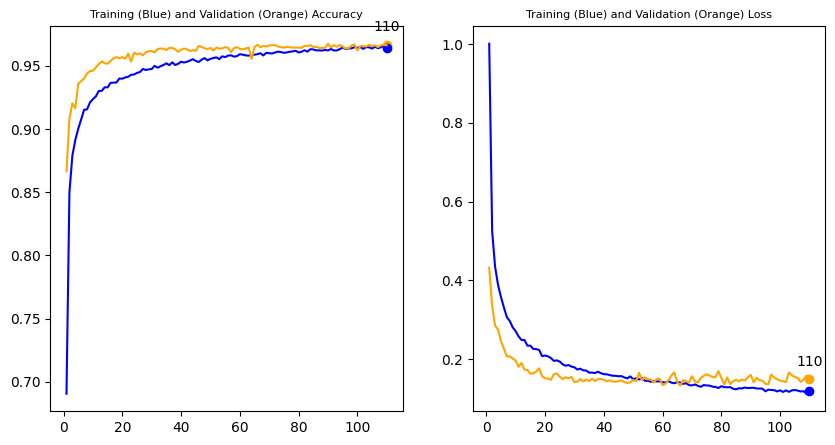

<Figure size 2000x1000 with 0 Axes>

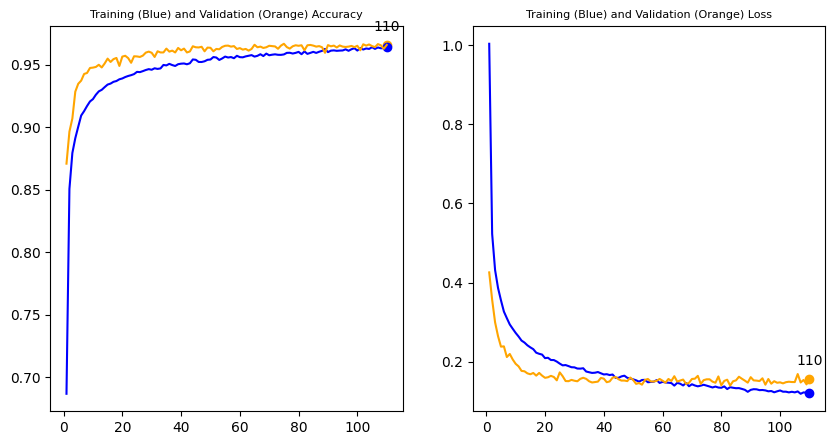

<Figure size 2000x1000 with 0 Axes>

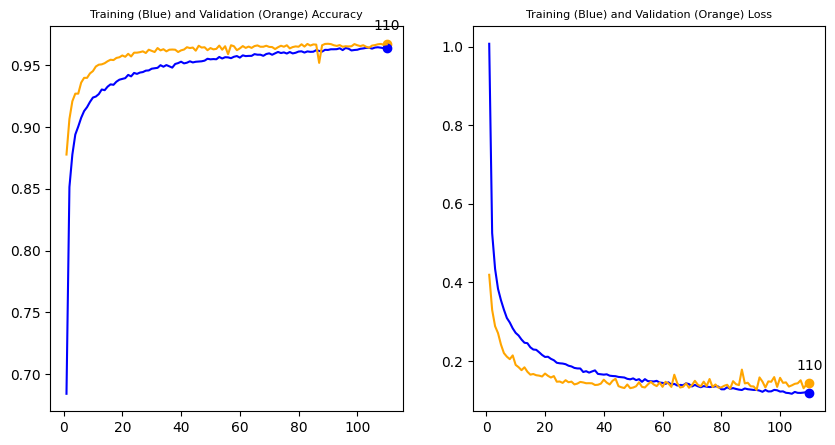

<Figure size 2000x1000 with 0 Axes>

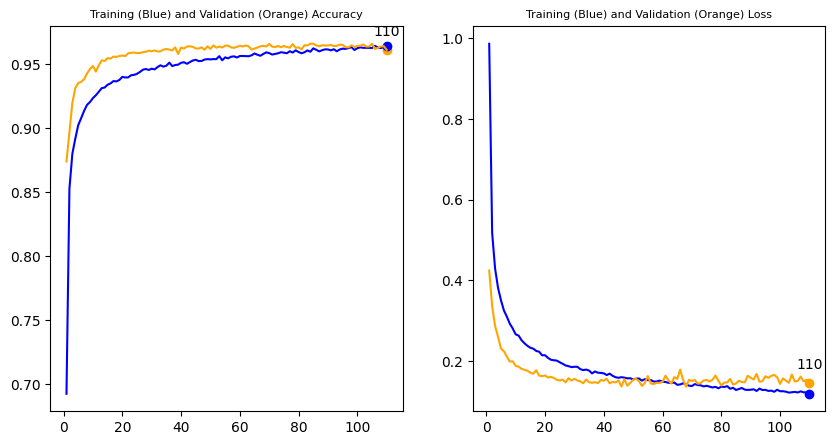

<Figure size 2000x1000 with 0 Axes>

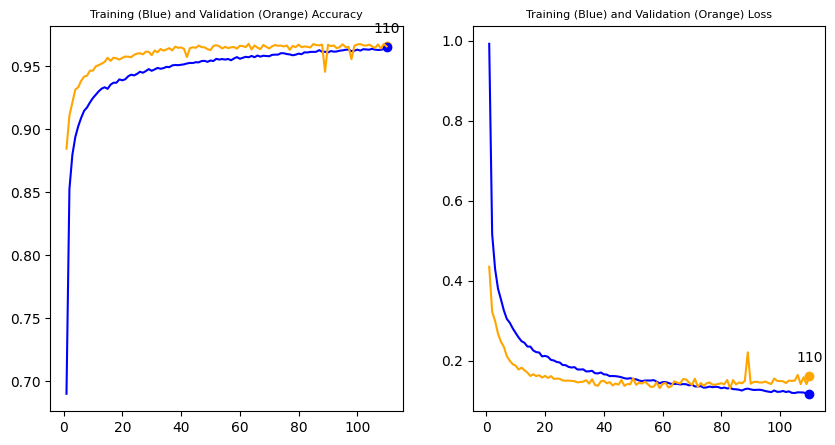

<Figure size 2000x1000 with 0 Axes>

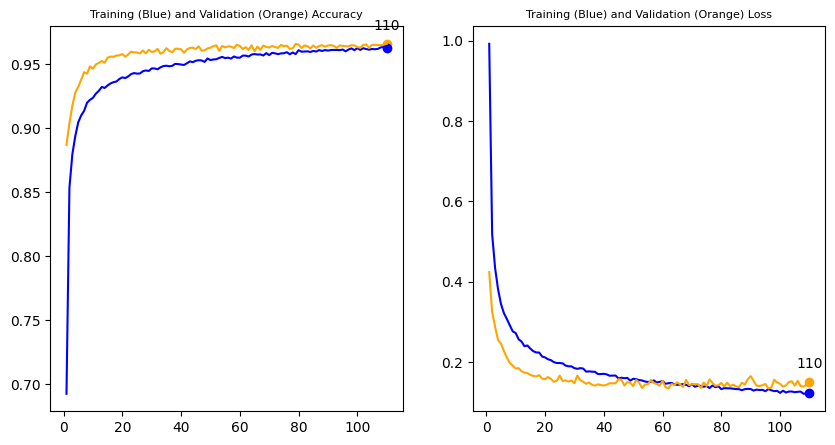

<Figure size 2000x1000 with 0 Axes>

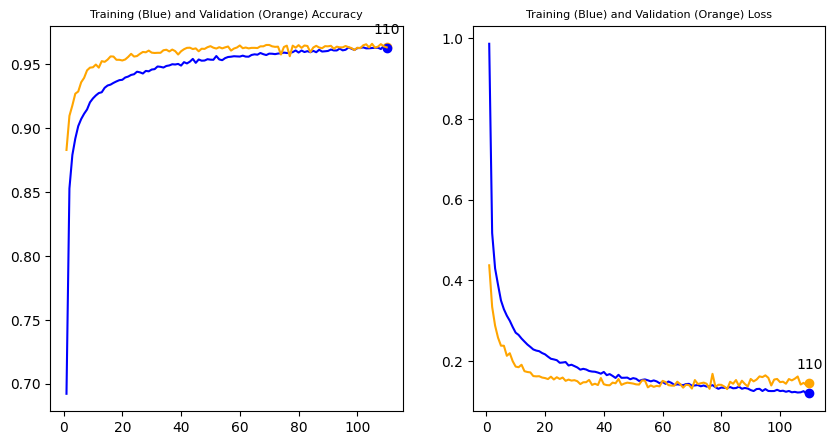

<Figure size 2000x1000 with 0 Axes>

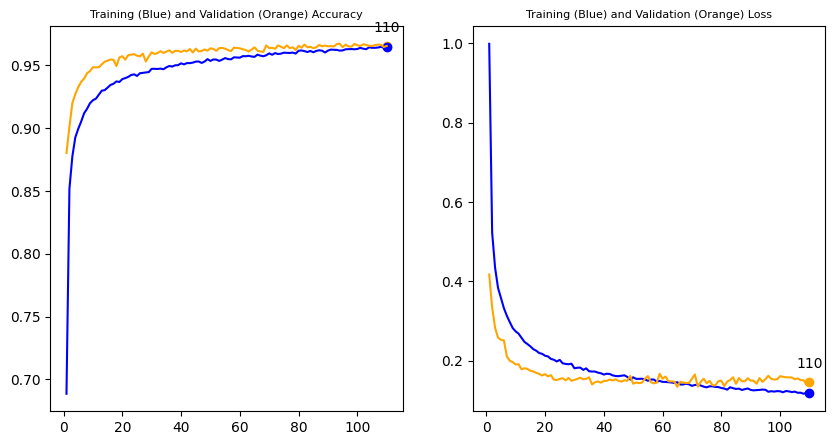

<Figure size 2000x1000 with 0 Axes>

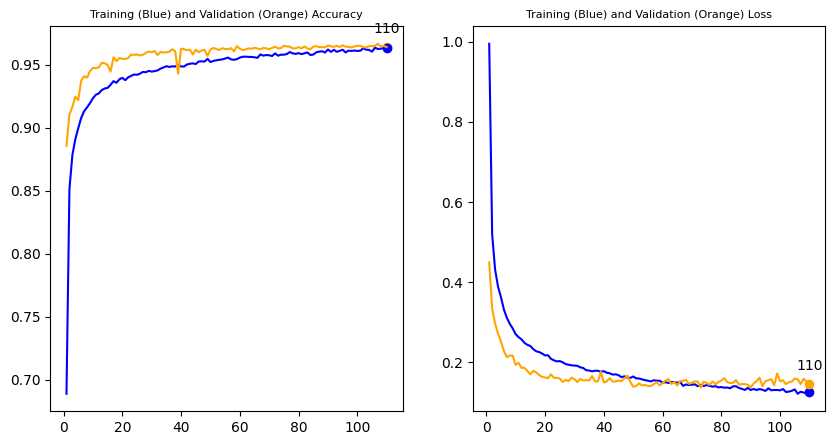

<Figure size 2000x1000 with 0 Axes>

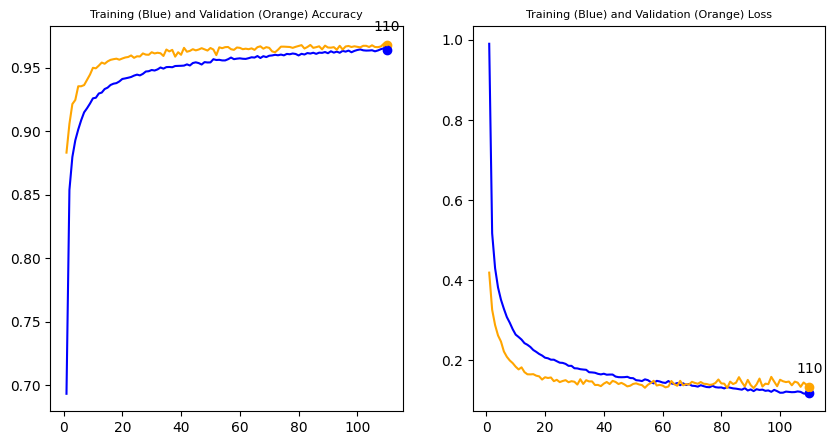

<Figure size 2000x1000 with 0 Axes>

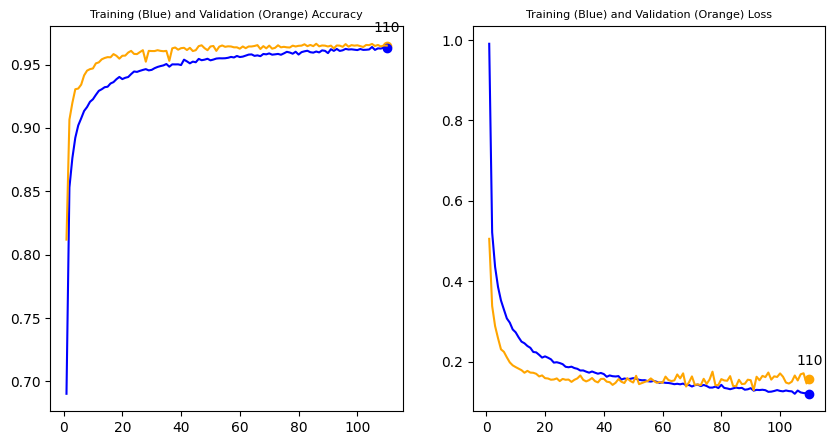

<Figure size 2000x1000 with 0 Axes>

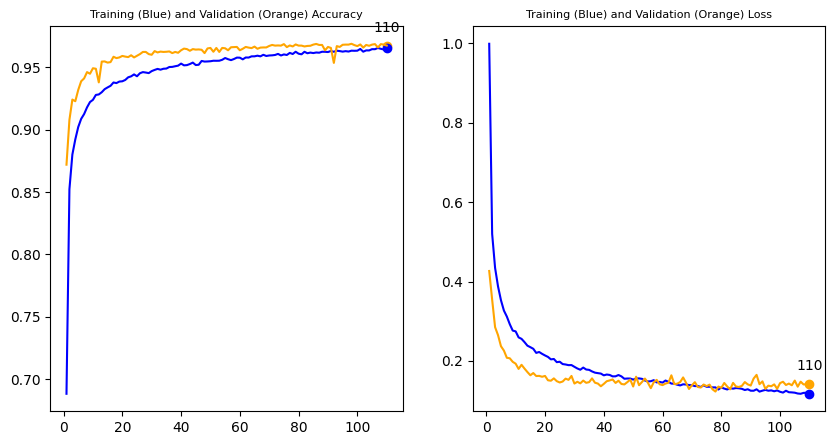

<Figure size 2000x1000 with 0 Axes>

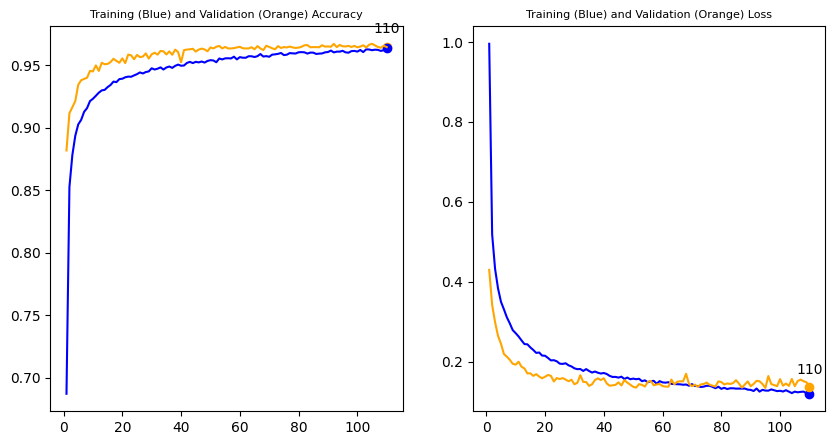

<Figure size 2000x1000 with 0 Axes>

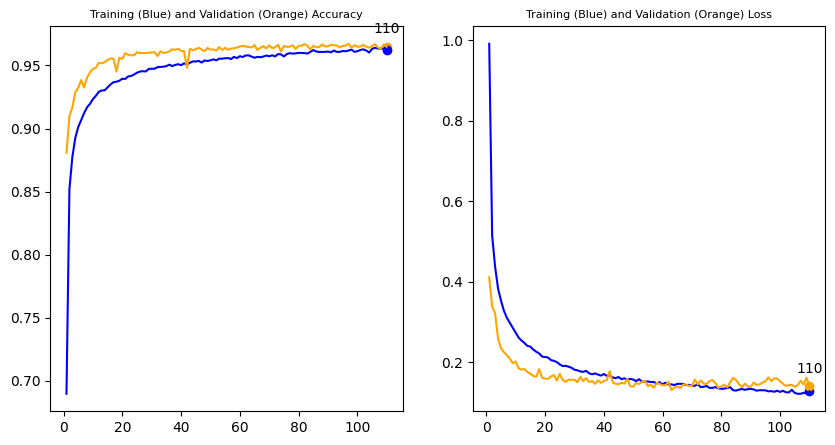

<Figure size 2000x1000 with 0 Axes>

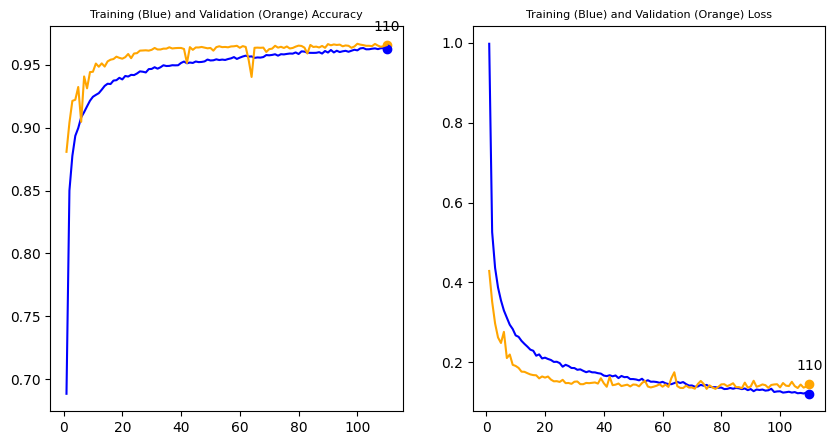

<Figure size 2000x1000 with 0 Axes>

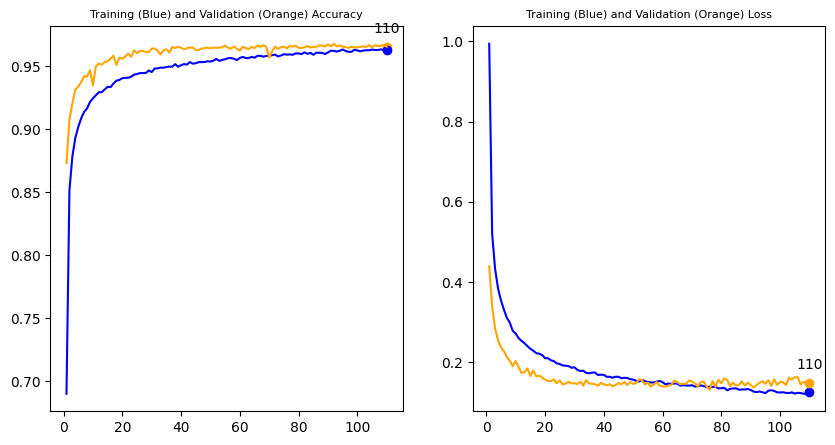

<Figure size 2000x1000 with 0 Axes>

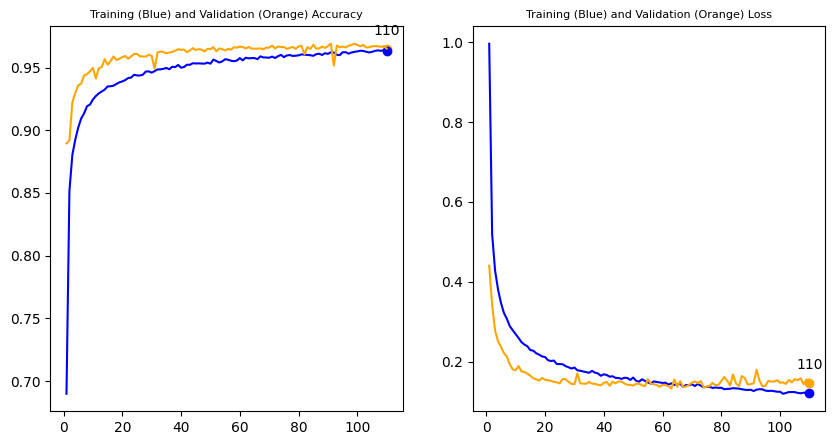

<Figure size 2000x1000 with 0 Axes>

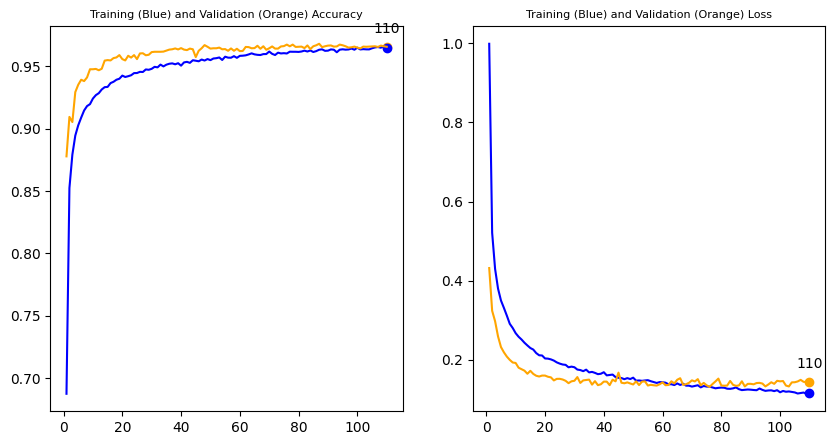

<Figure size 2000x1000 with 0 Axes>

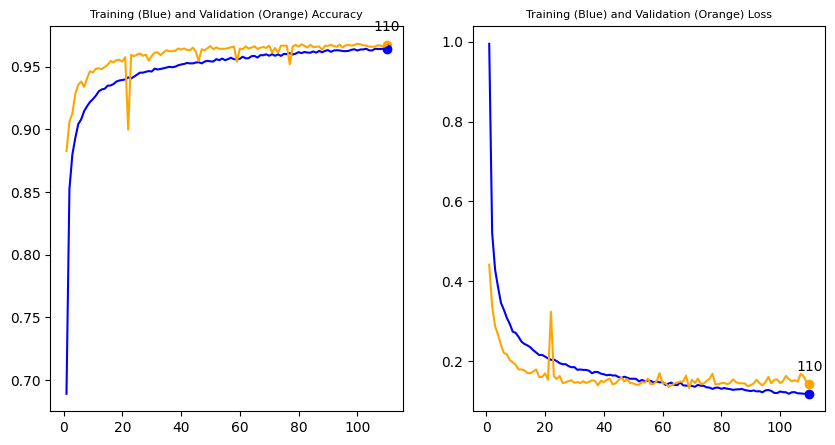

<Figure size 2000x1000 with 0 Axes>

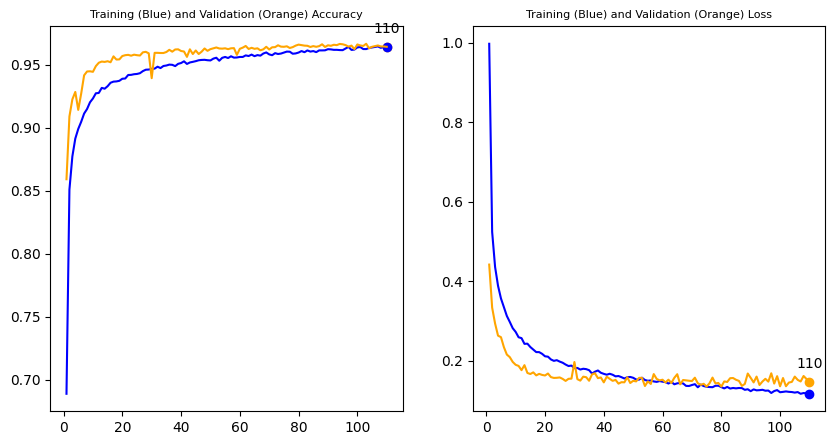

Group of Lambda-Value: 100


<Figure size 2000x1000 with 0 Axes>

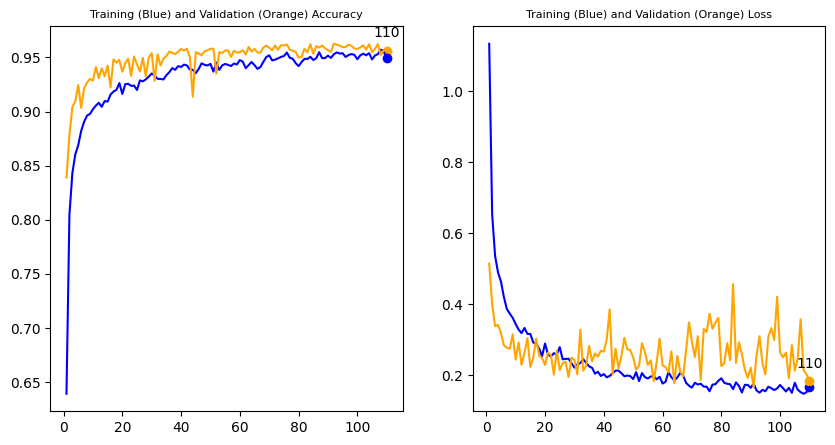

<Figure size 2000x1000 with 0 Axes>

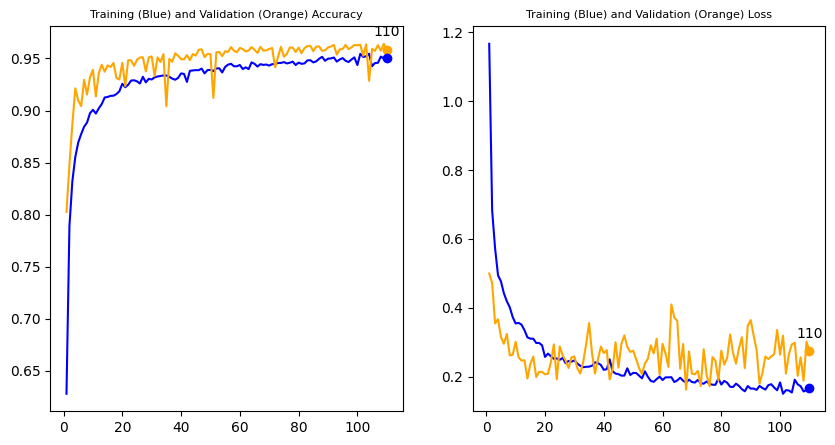

<Figure size 2000x1000 with 0 Axes>

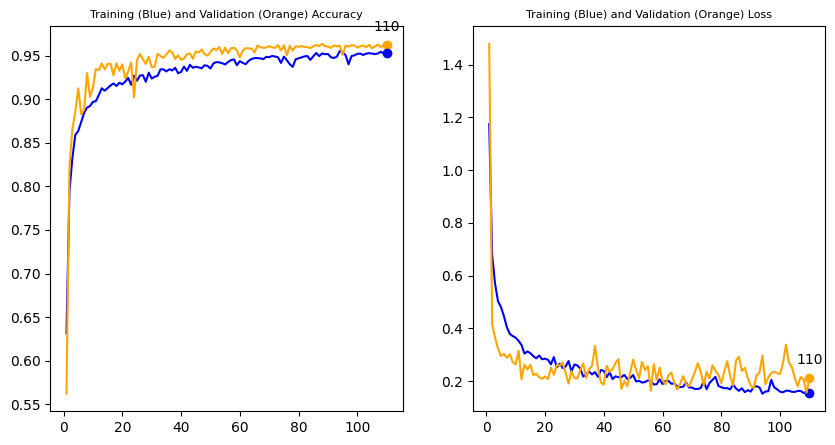

<Figure size 2000x1000 with 0 Axes>

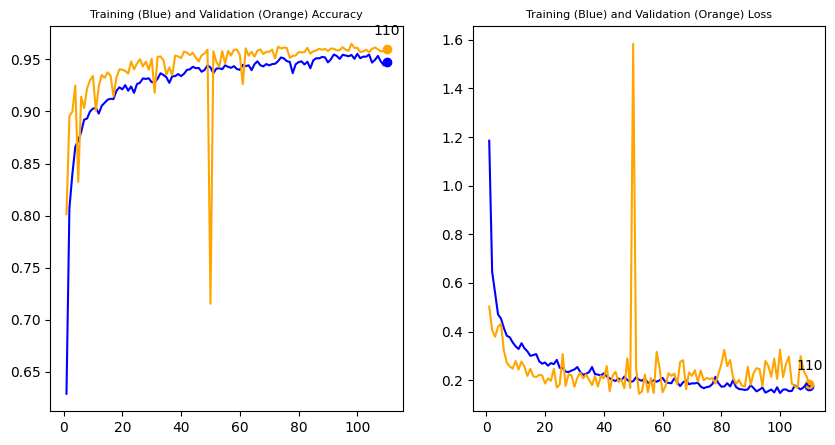

<Figure size 2000x1000 with 0 Axes>

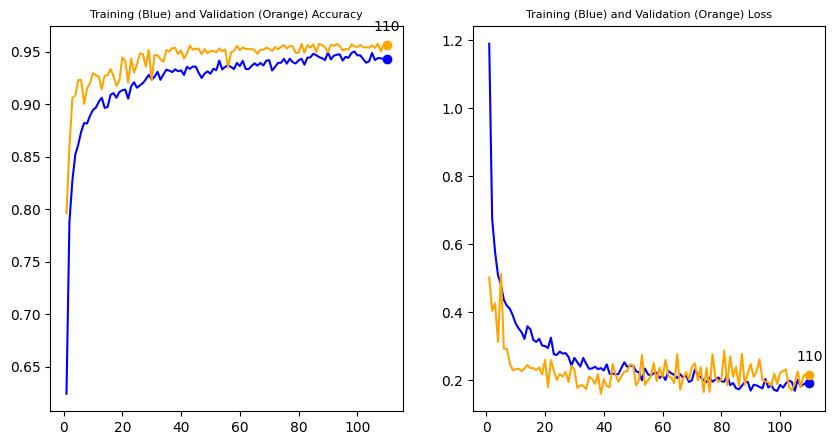

<Figure size 2000x1000 with 0 Axes>

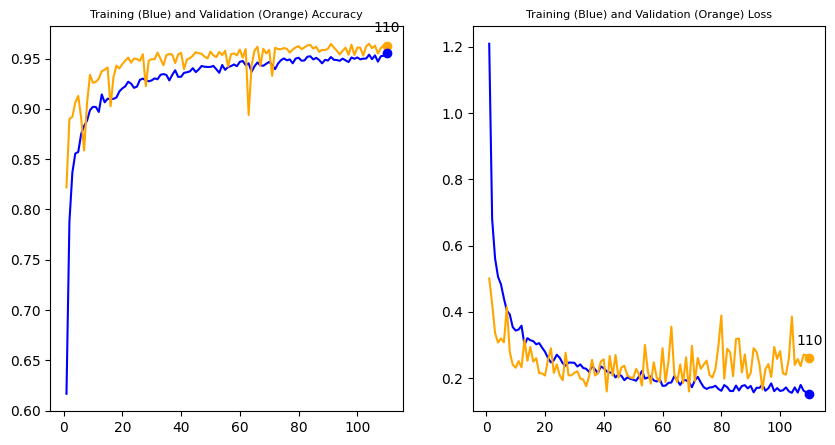

<Figure size 2000x1000 with 0 Axes>

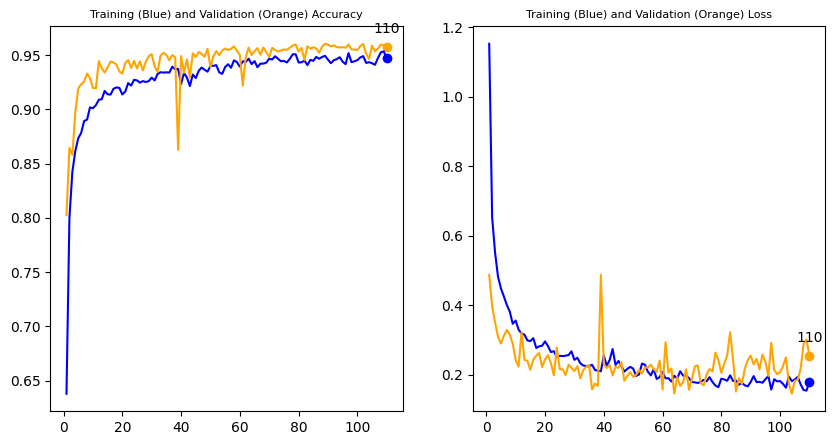

<Figure size 2000x1000 with 0 Axes>

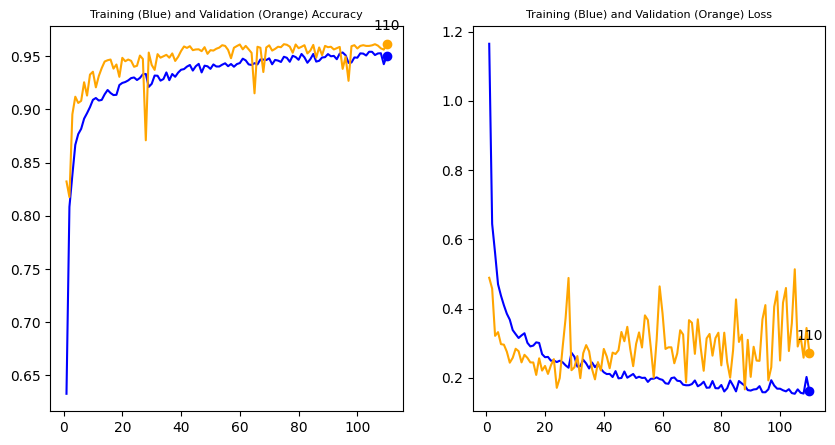

<Figure size 2000x1000 with 0 Axes>

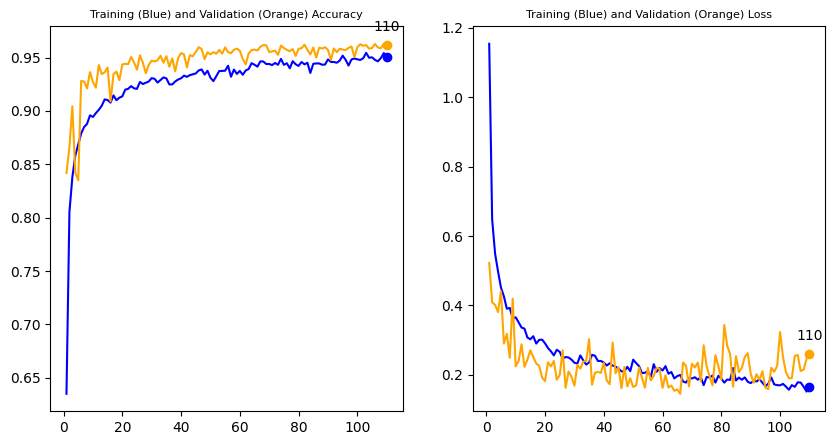

<Figure size 2000x1000 with 0 Axes>

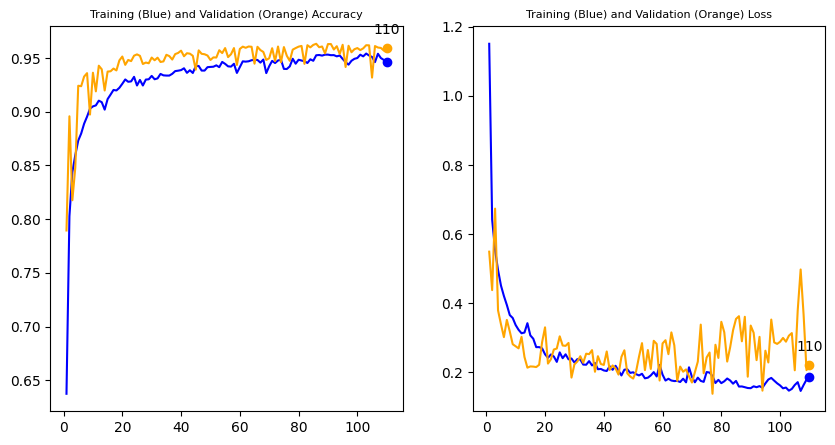

<Figure size 2000x1000 with 0 Axes>

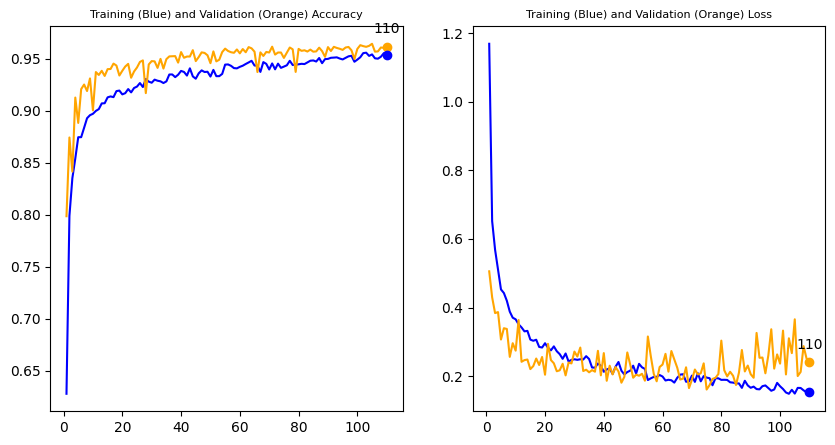

<Figure size 2000x1000 with 0 Axes>

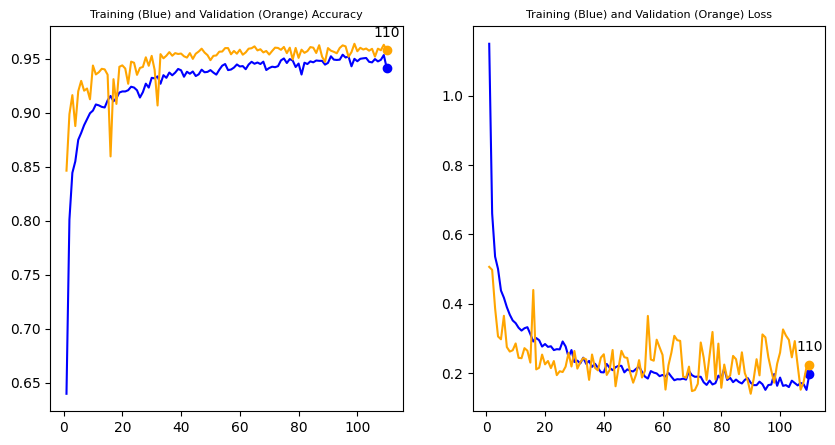

<Figure size 2000x1000 with 0 Axes>

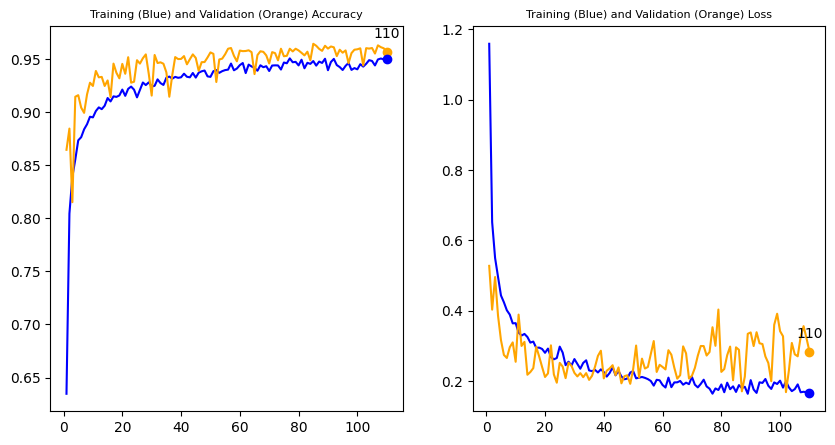

<Figure size 2000x1000 with 0 Axes>

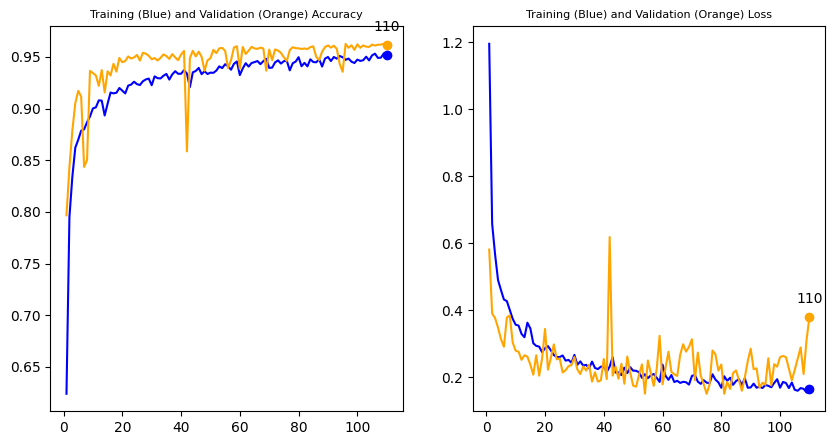

<Figure size 2000x1000 with 0 Axes>

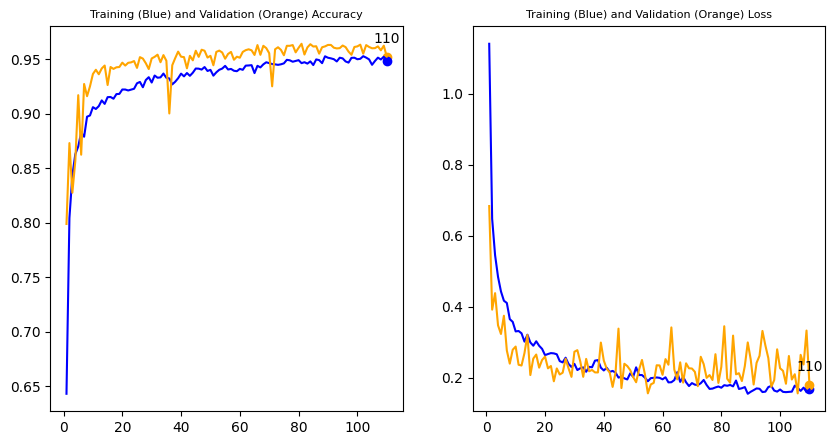

<Figure size 2000x1000 with 0 Axes>

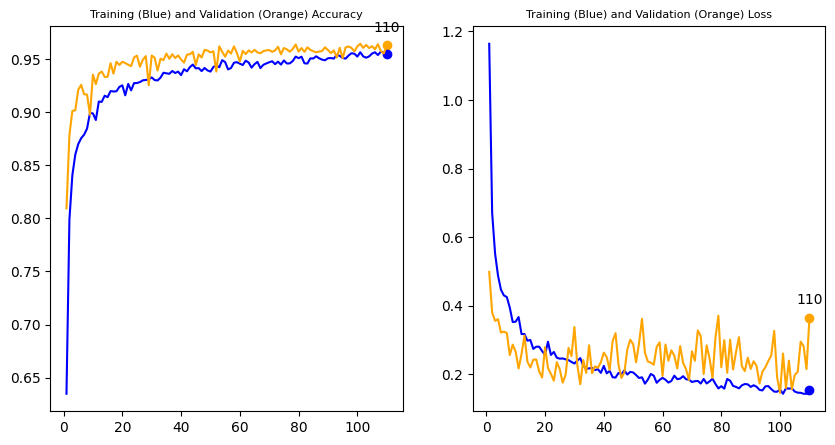

<Figure size 2000x1000 with 0 Axes>

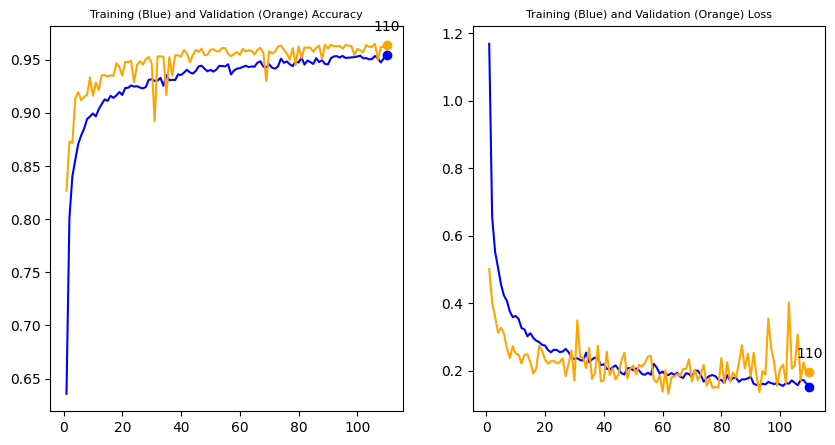

<Figure size 2000x1000 with 0 Axes>

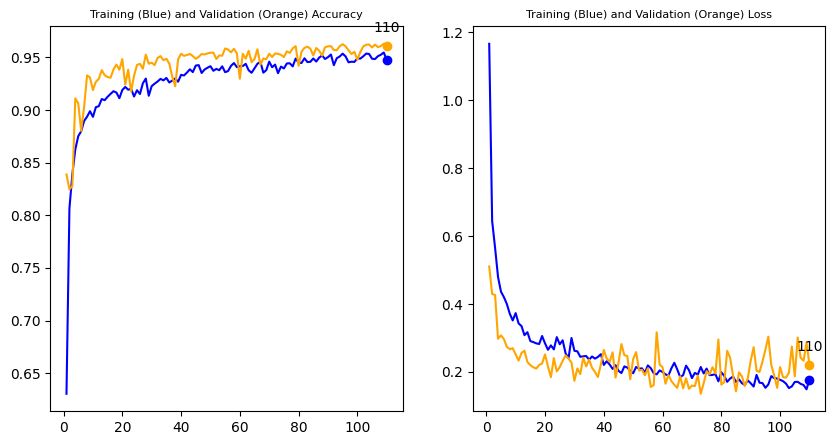

<Figure size 2000x1000 with 0 Axes>

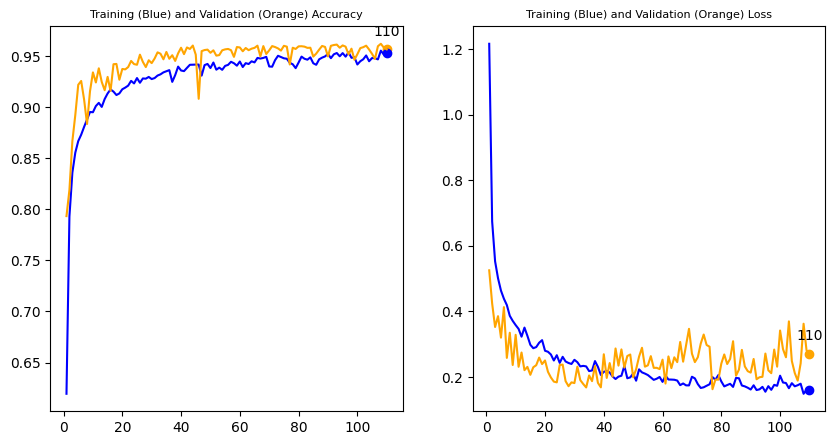

<Figure size 2000x1000 with 0 Axes>

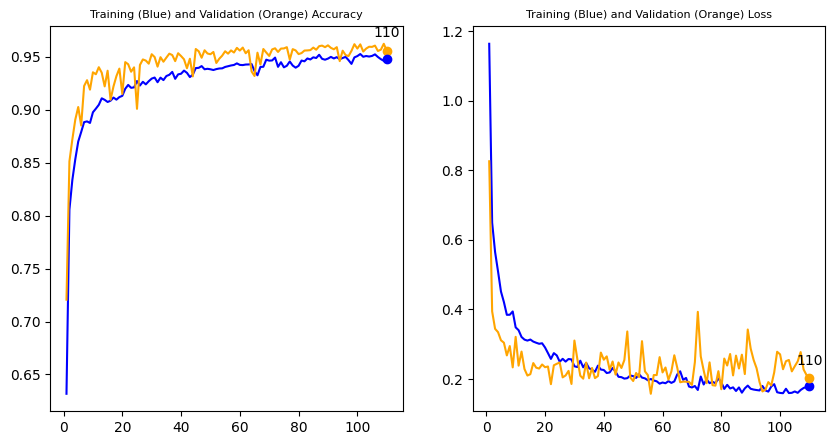

Group of Lambda-Value: 1000


<Figure size 2000x1000 with 0 Axes>

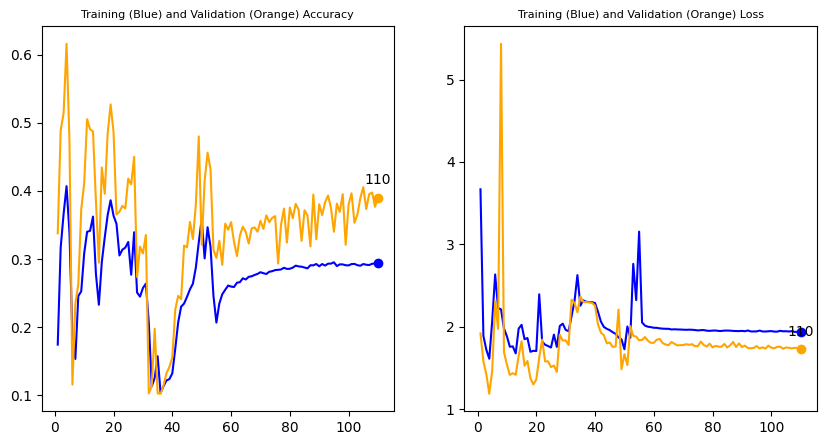

<Figure size 2000x1000 with 0 Axes>

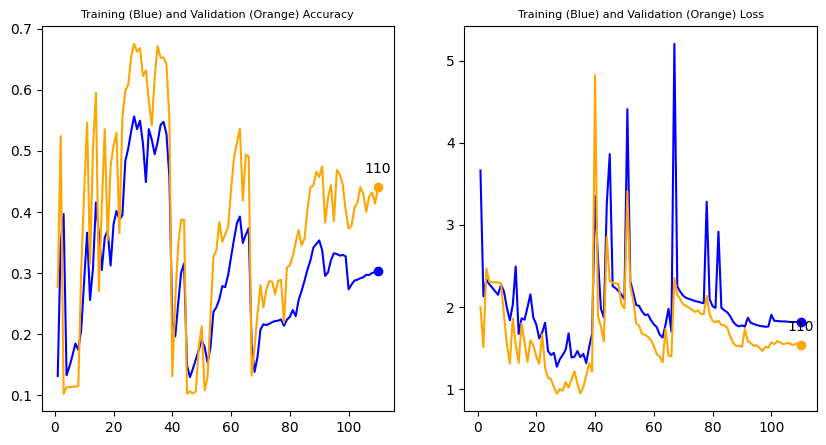

<Figure size 2000x1000 with 0 Axes>

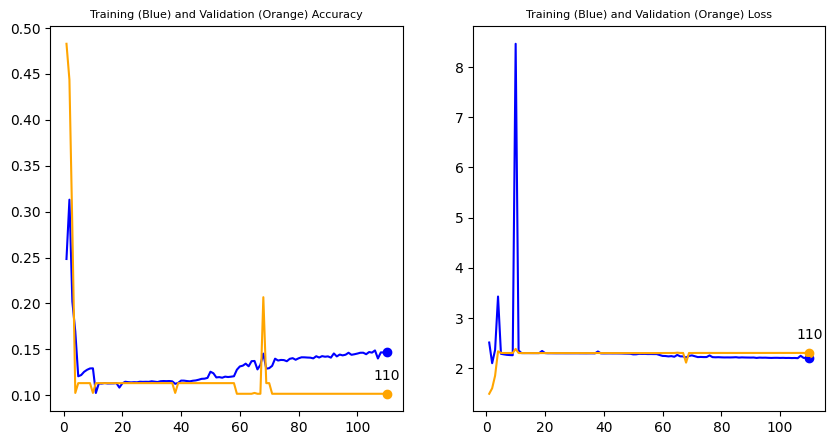

<Figure size 2000x1000 with 0 Axes>

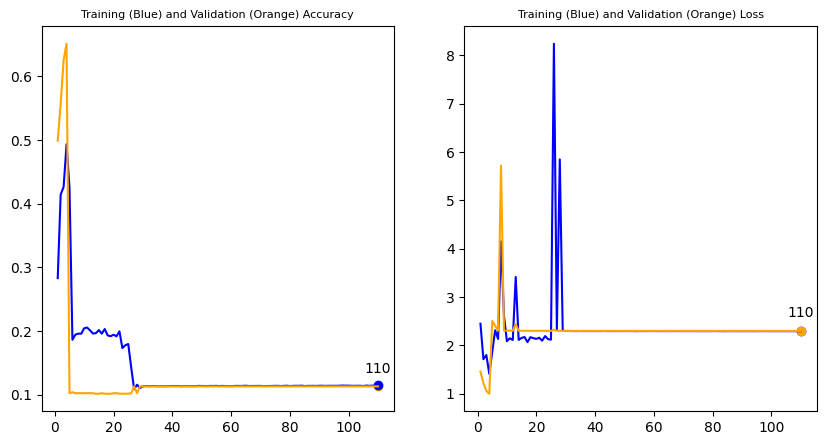

<Figure size 2000x1000 with 0 Axes>

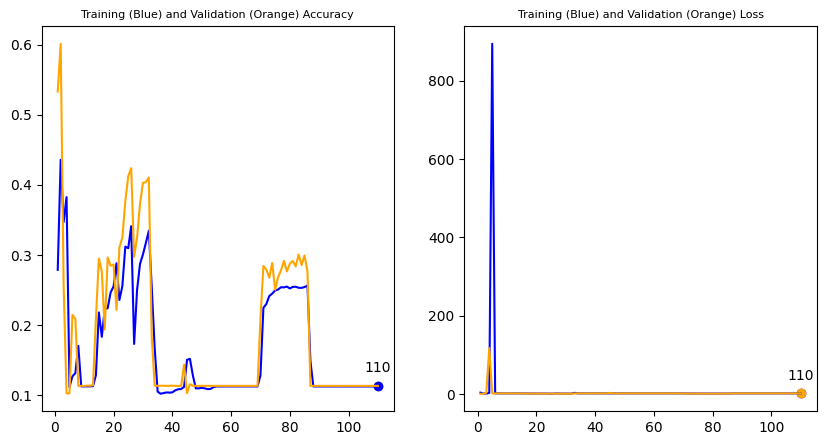

<Figure size 2000x1000 with 0 Axes>

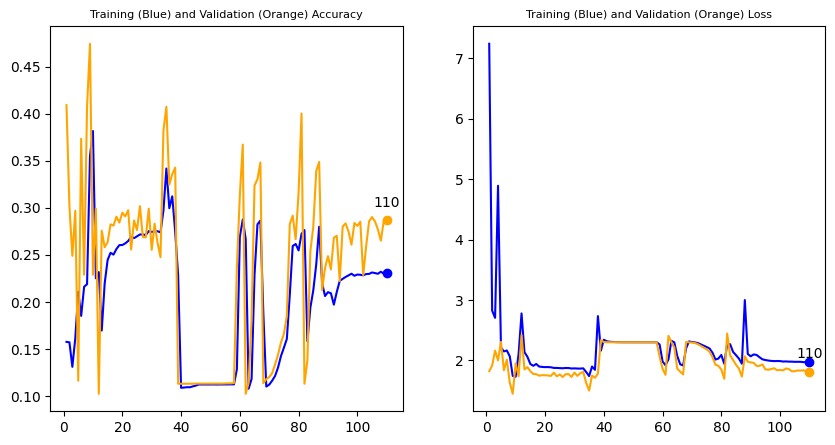

<Figure size 2000x1000 with 0 Axes>

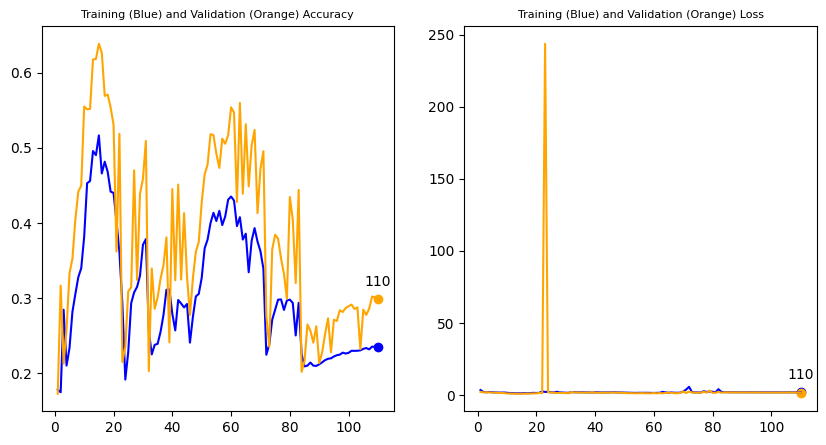

<Figure size 2000x1000 with 0 Axes>

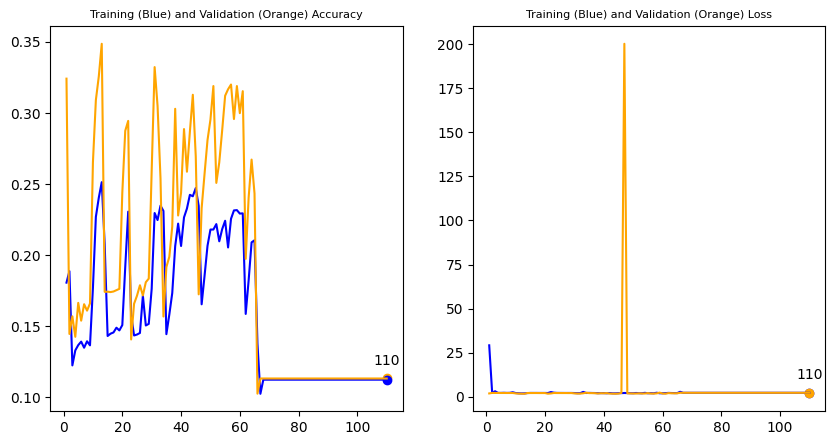

<Figure size 2000x1000 with 0 Axes>

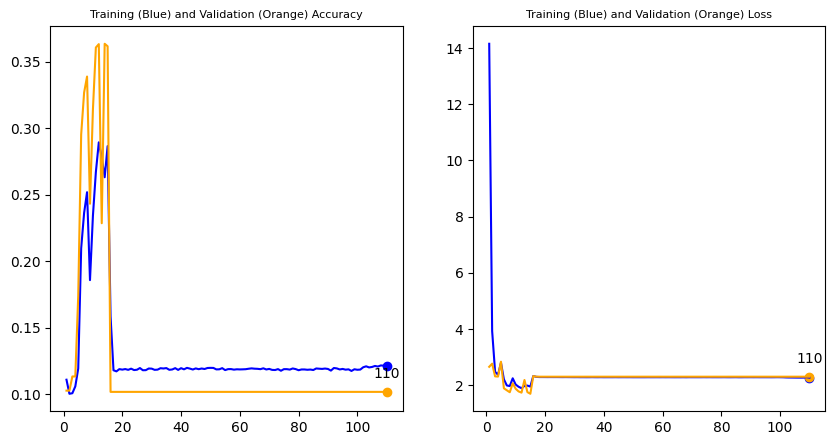

<Figure size 2000x1000 with 0 Axes>

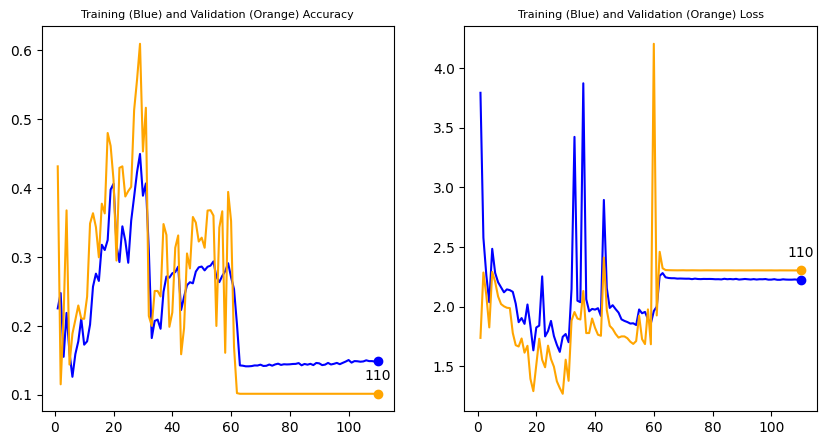

<Figure size 2000x1000 with 0 Axes>

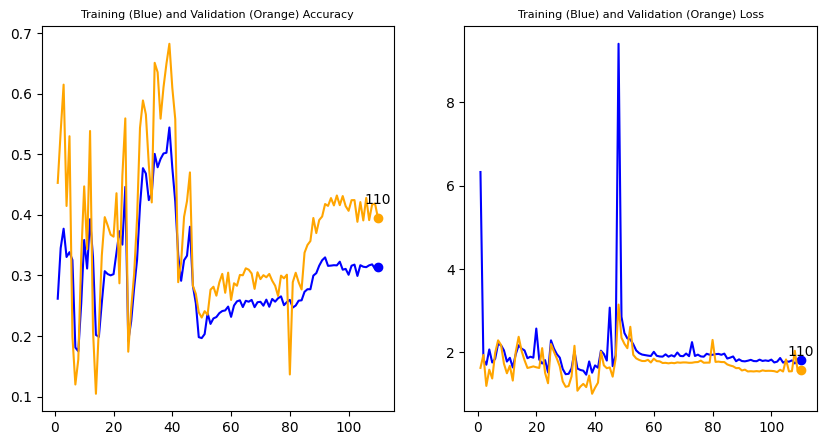

<Figure size 2000x1000 with 0 Axes>

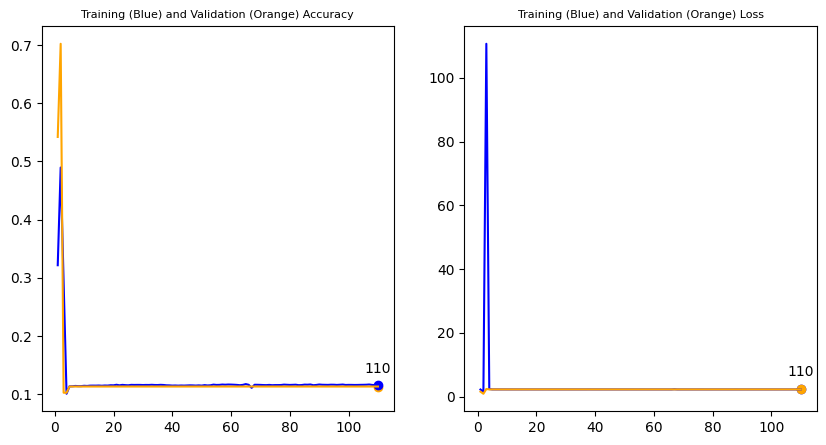

<Figure size 2000x1000 with 0 Axes>

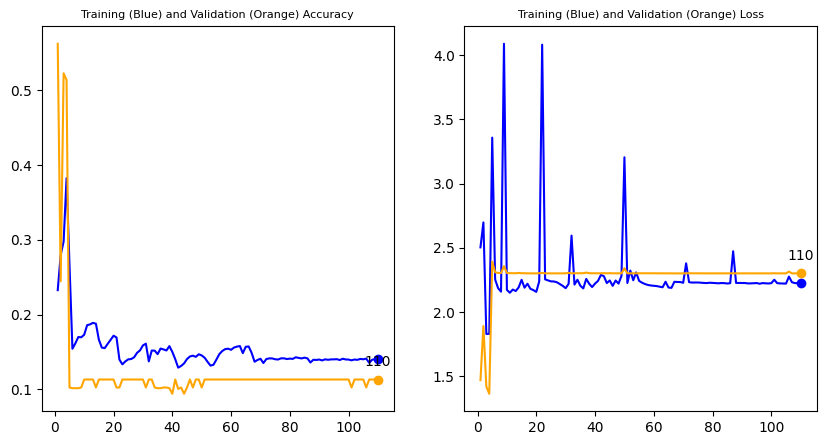

<Figure size 2000x1000 with 0 Axes>

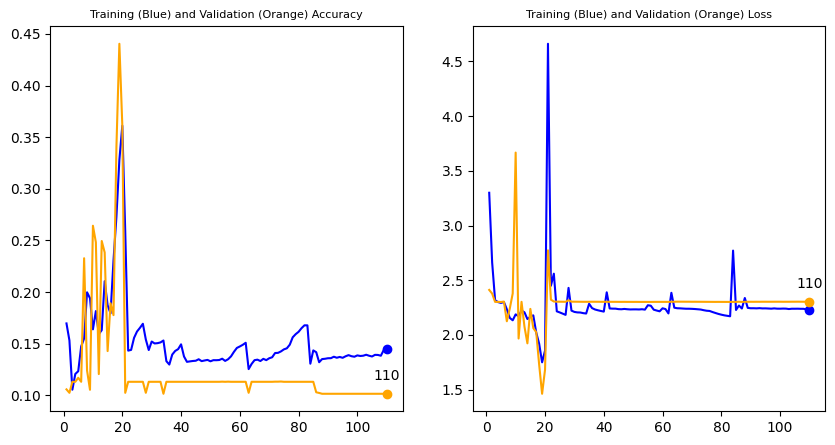

<Figure size 2000x1000 with 0 Axes>

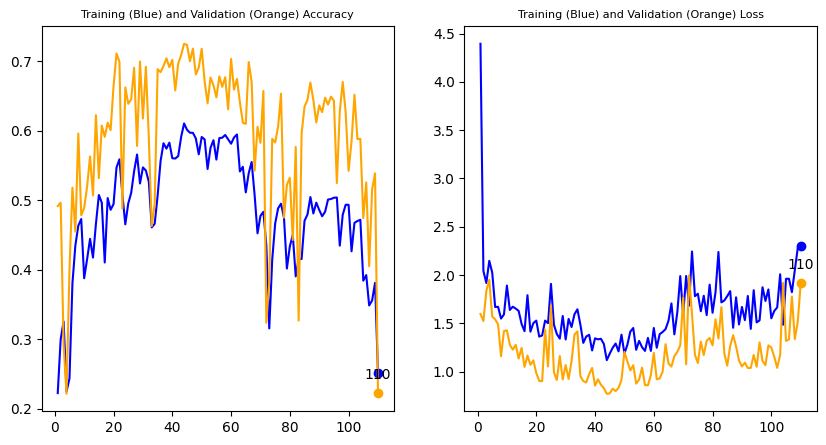

<Figure size 2000x1000 with 0 Axes>

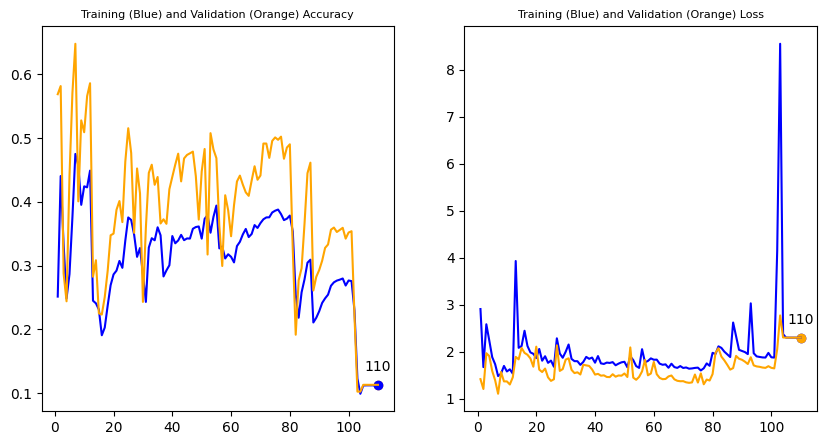

<Figure size 2000x1000 with 0 Axes>

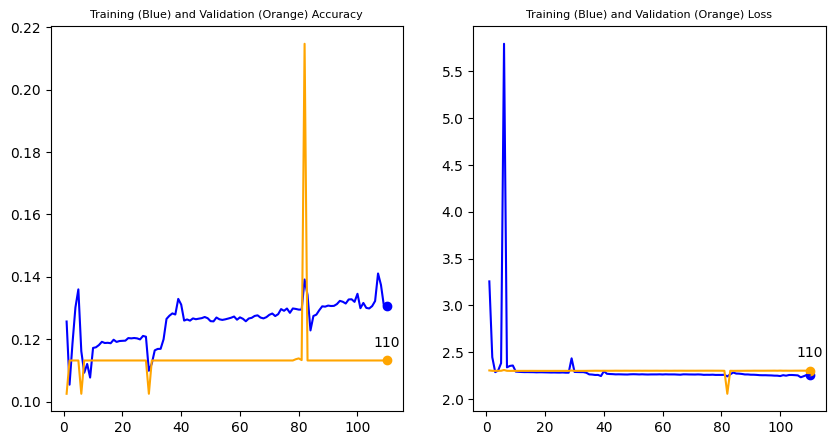

<Figure size 2000x1000 with 0 Axes>

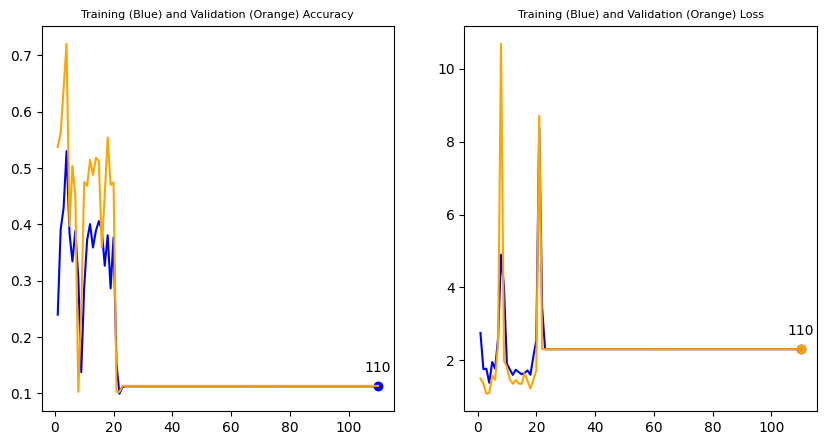

<Figure size 2000x1000 with 0 Axes>

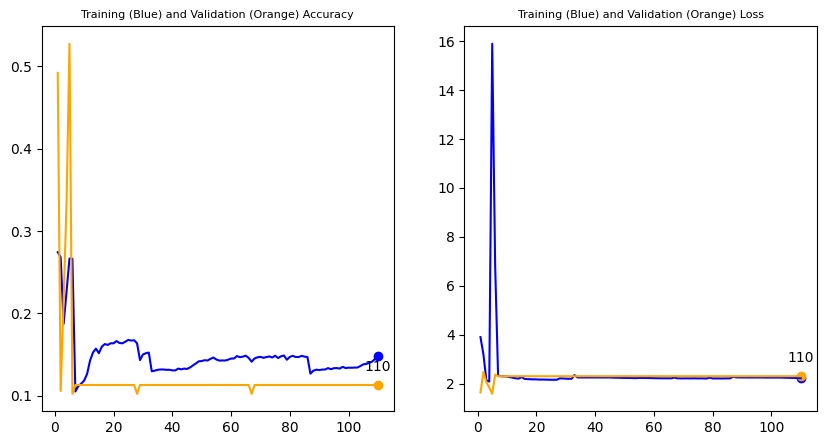

<Figure size 2000x1000 with 0 Axes>

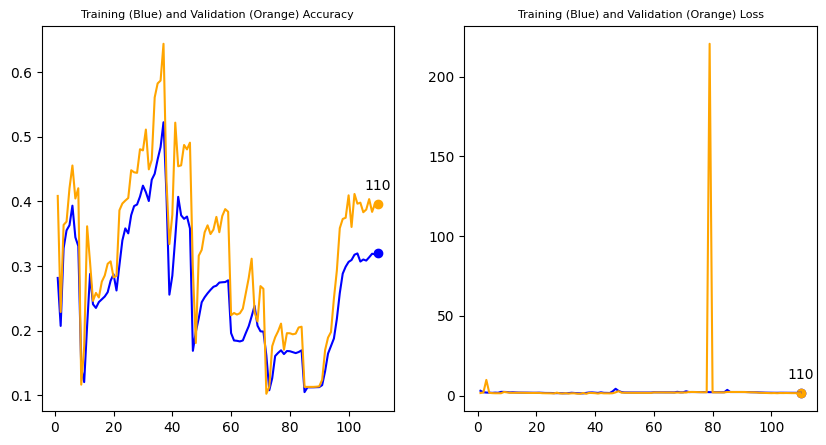

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import time
nb_epoch = 110
patience = 0
df.groupby("cost")

for x, group in df.groupby("cost"):
  # fig = plt.figure(figsize=(20, 10)) 
  # fig, ax = plt.subplots(1,2)
  print("Group of Lambda-Value:",   x)

  # group
  for item in group.model_history:
    plot_model_history_all(item)    
  plt.show()
  

In [ ]:
df["model_history"][0].history.keys()


dict_keys(['loss', 'categorical_accuracy', 'val_loss', 'val_categorical_accuracy', '9T_4P', '4T_9P', '0T_Acc', '1T_Acc', '2T_Acc', '3T_Acc', '4T_Acc', '5T_Acc', '6T_Acc', '7T_Acc', '8T_Acc', '9T_Acc', 'cm_per_epoch', 'f1_micro', 'f1_macro', 'f1_weighted', 'f1_notweighted'])

The plots  look very similar.  The loss values, even with shuffling, are nearly identical at least within 0.01 for the first three epochs of runs 1 and 2 (haven't checked all, but the plot makes it look like the runs are nearly identical)

In [ ]:
df["model_history"][2].history["val_loss"][0] - df["model_history"][1].history["val_loss"][0]
df["model_history"][2].history["val_loss"][1] - df["model_history"][1].history["val_loss"][1]
df["model_history"][2].history["val_loss"][2] - df["model_history"][1].history["val_loss"][2]

-0.01114240288734436

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


What is the highest misclassification?



0


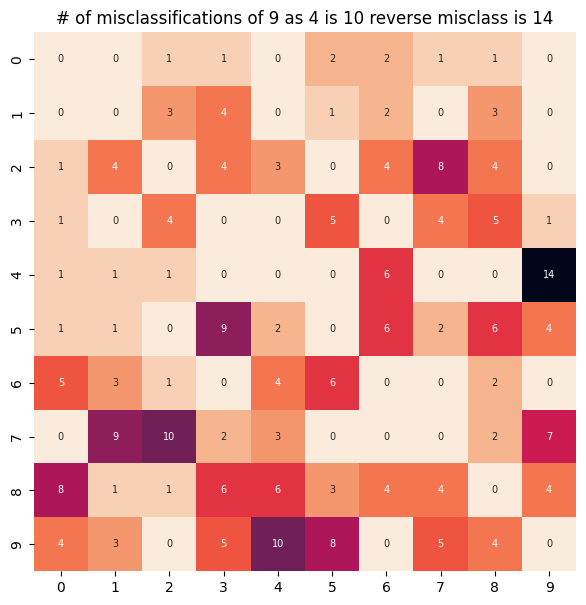

1


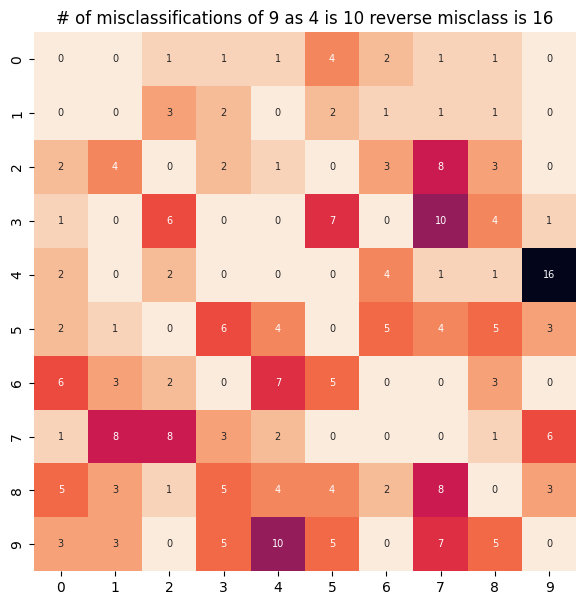

2


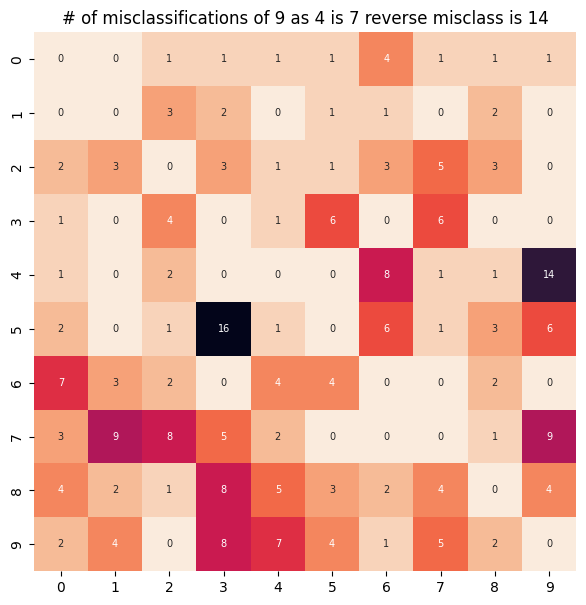

3


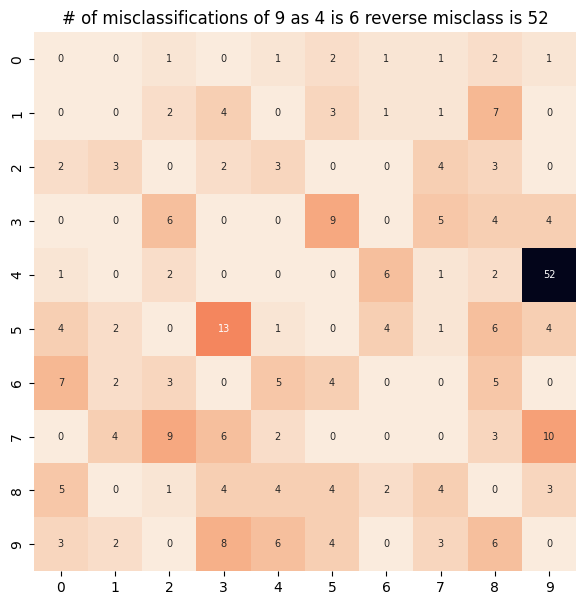

4


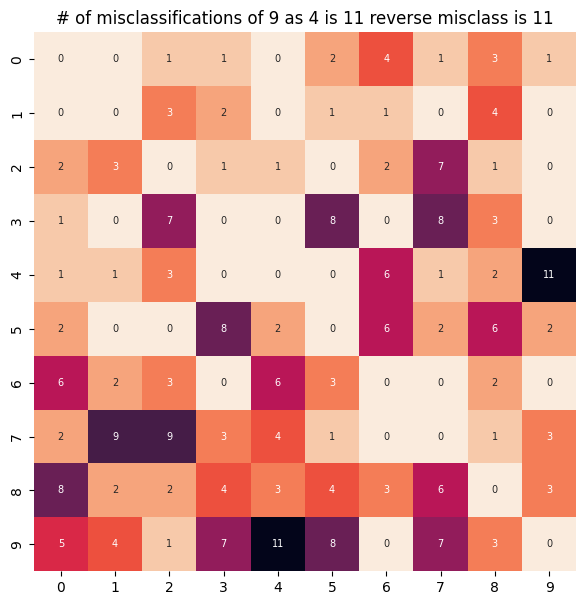

5


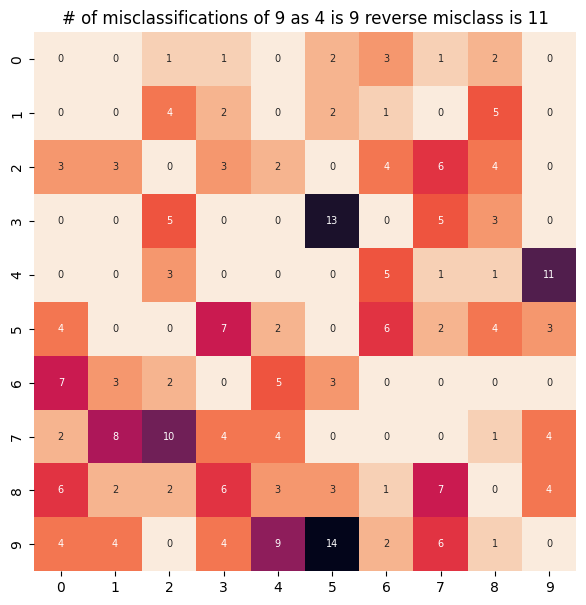

6


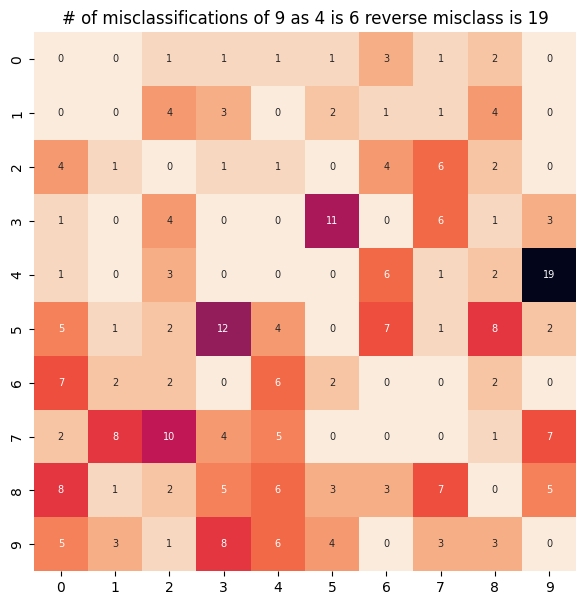

7


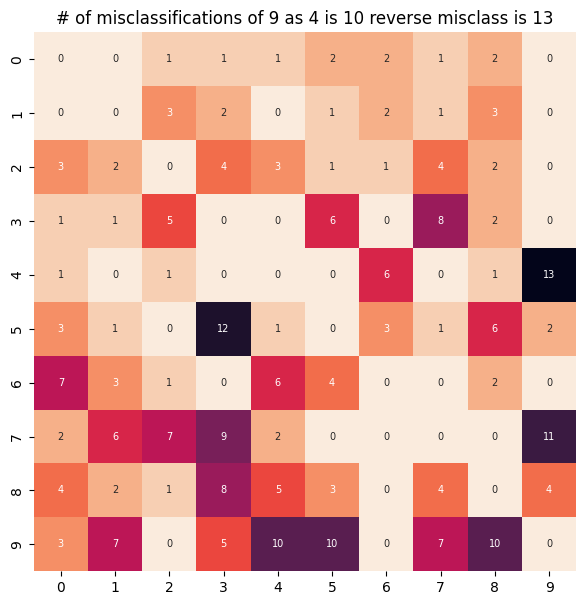

8


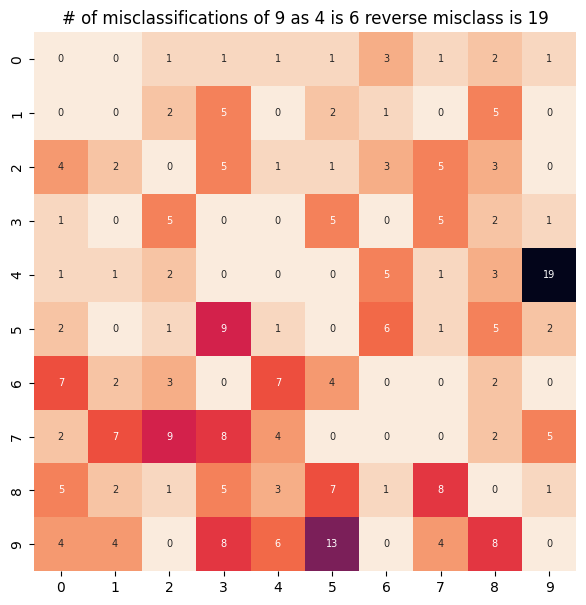

9


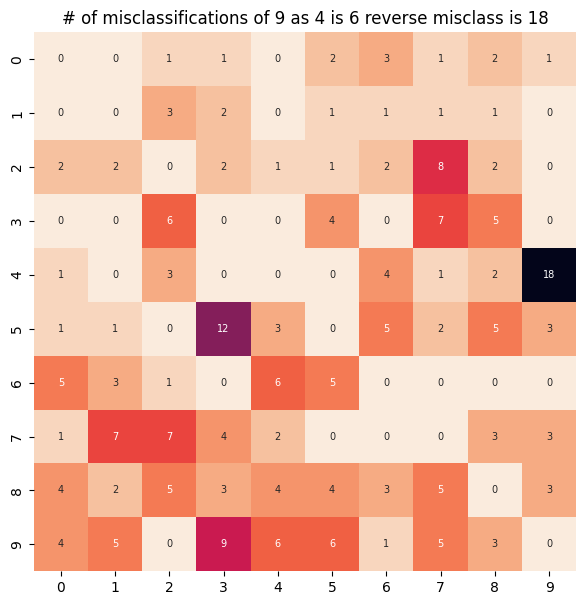

10


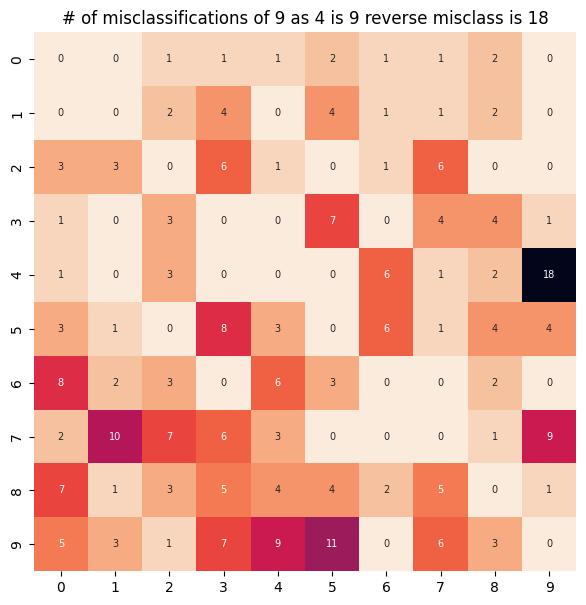

11


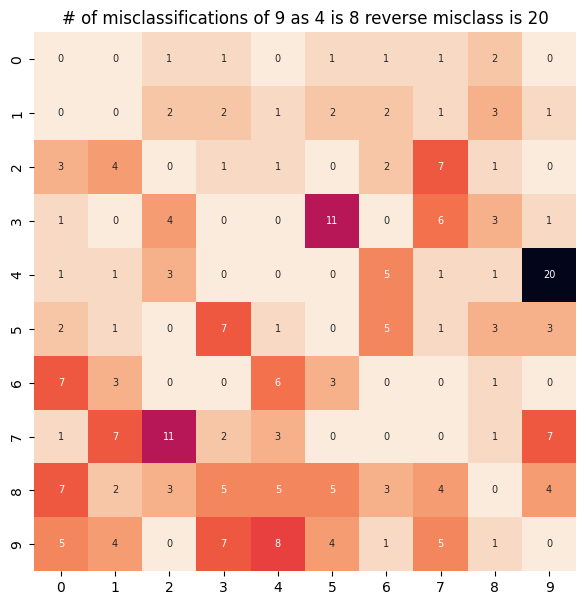

12


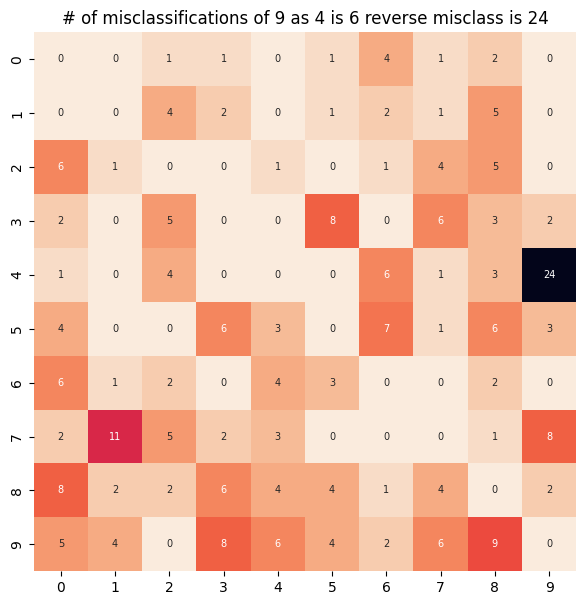

13


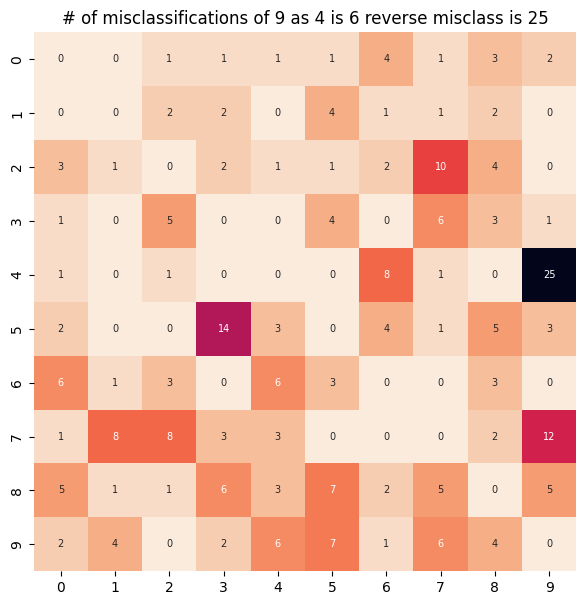

14


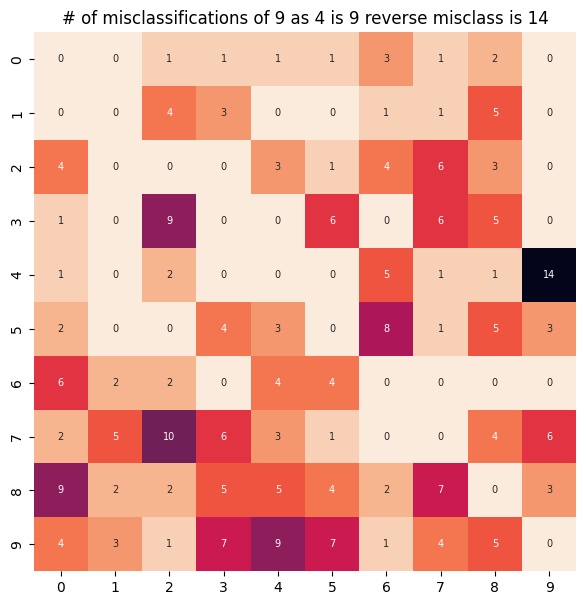

15


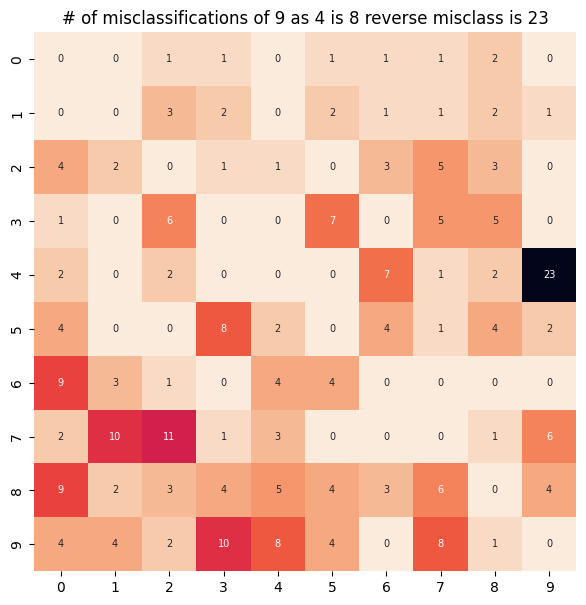

16


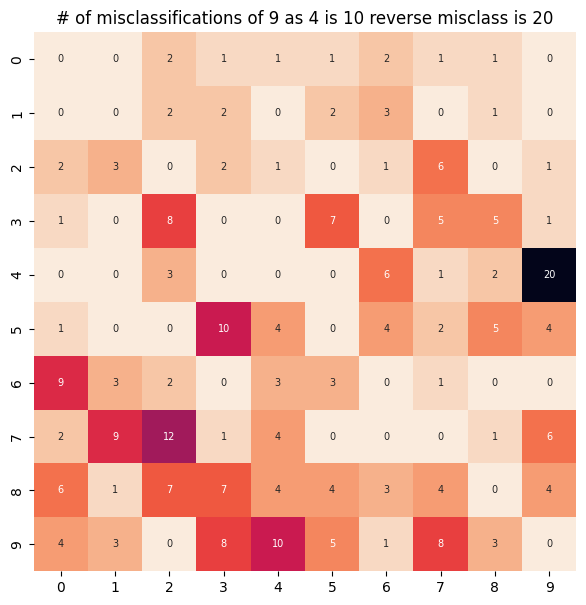

17


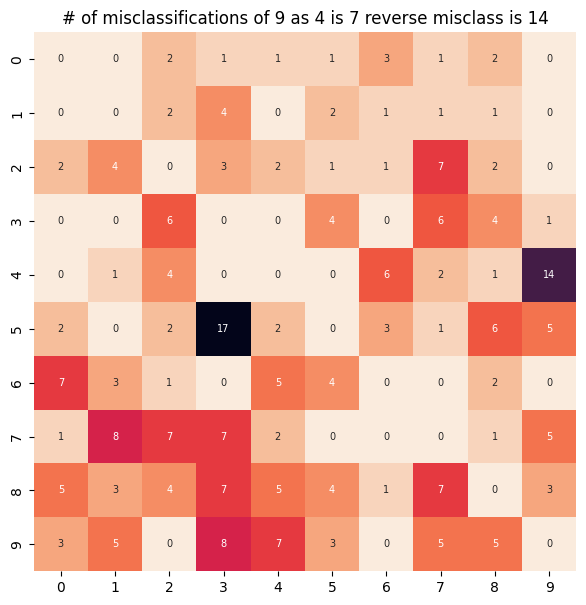

18


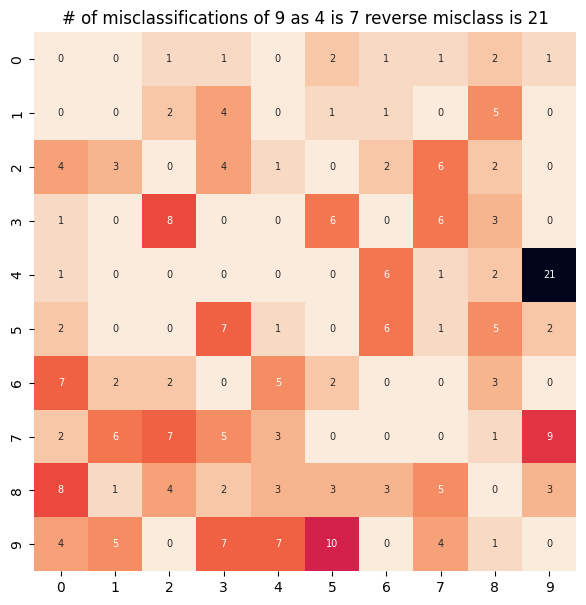

19


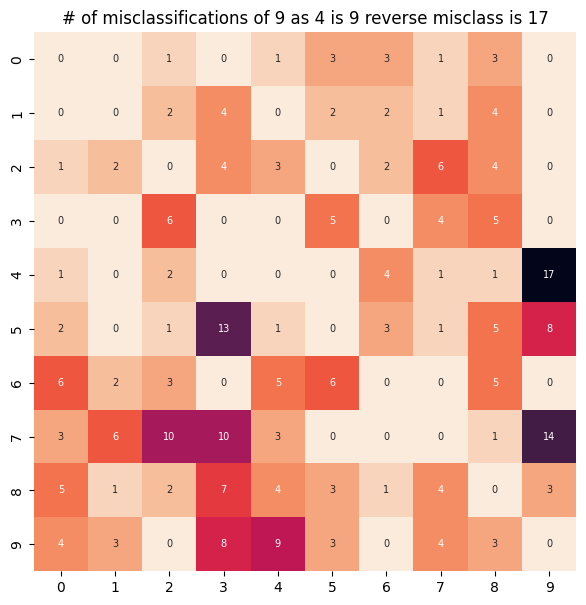

20


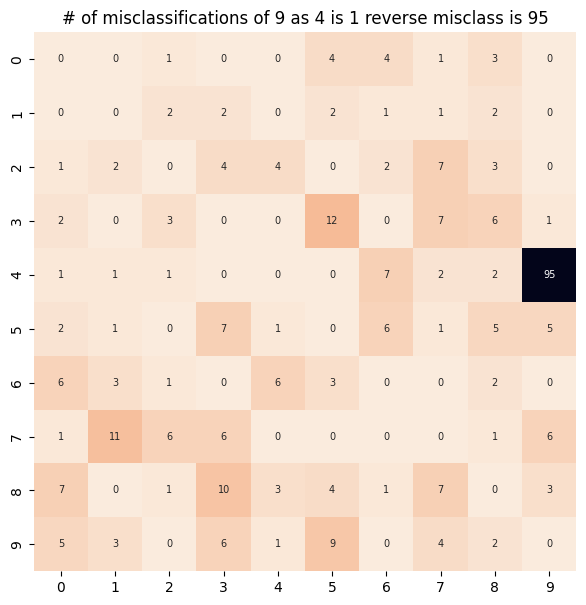

21


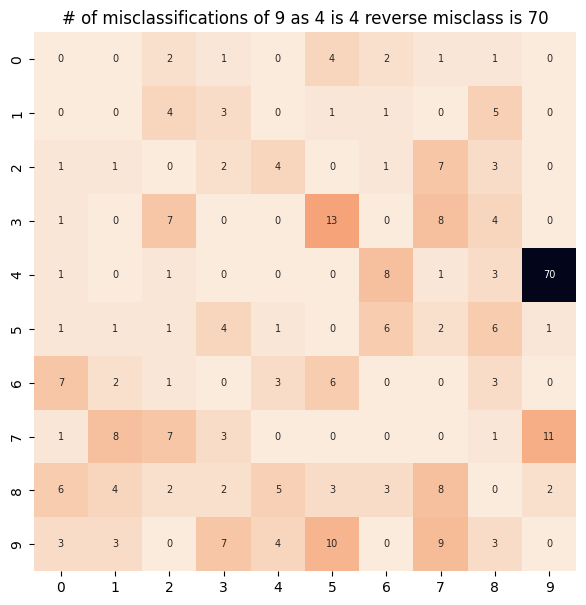

22


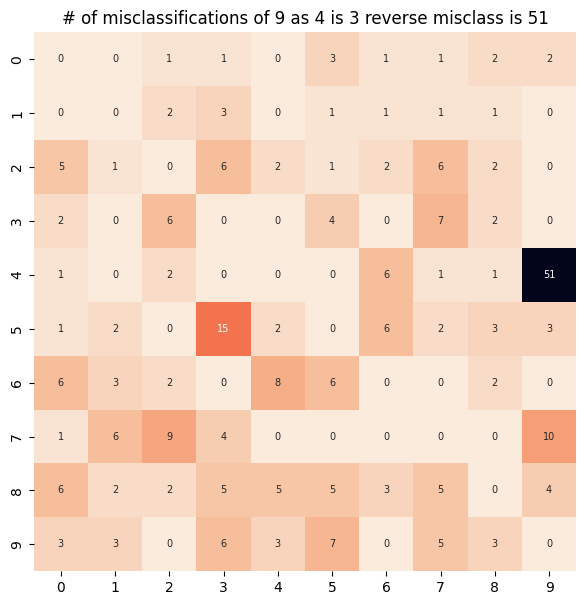

23


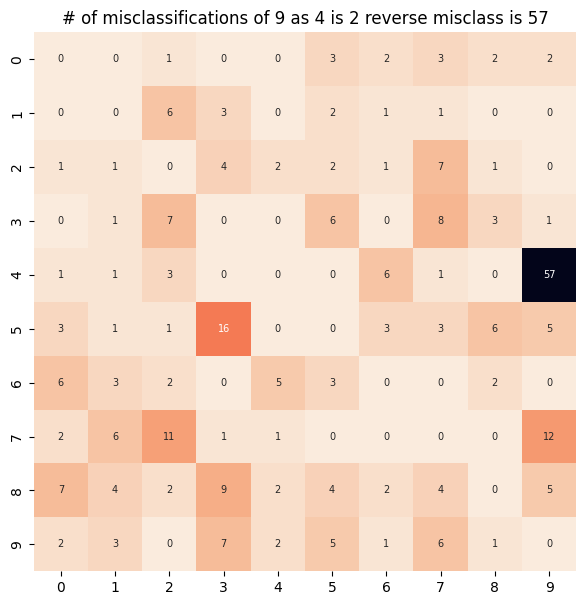

24


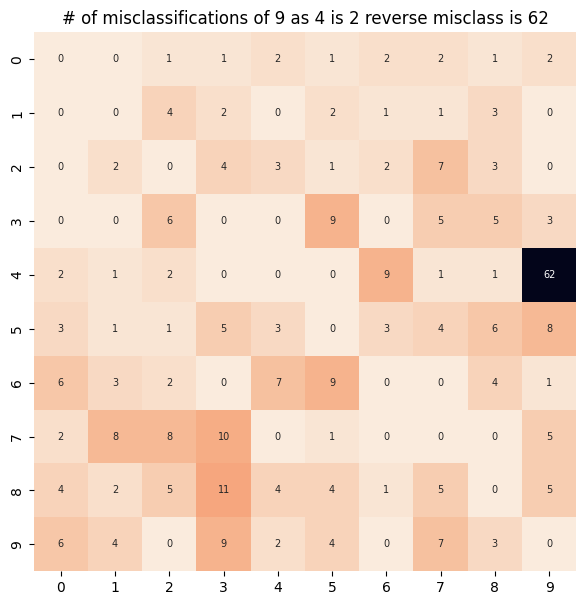

25


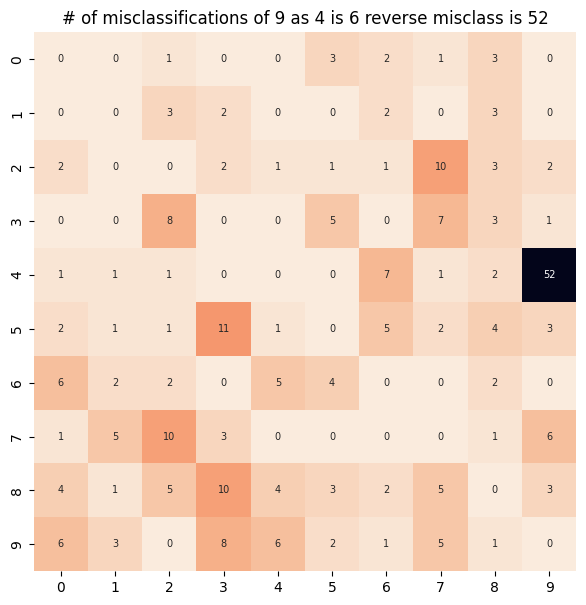

26


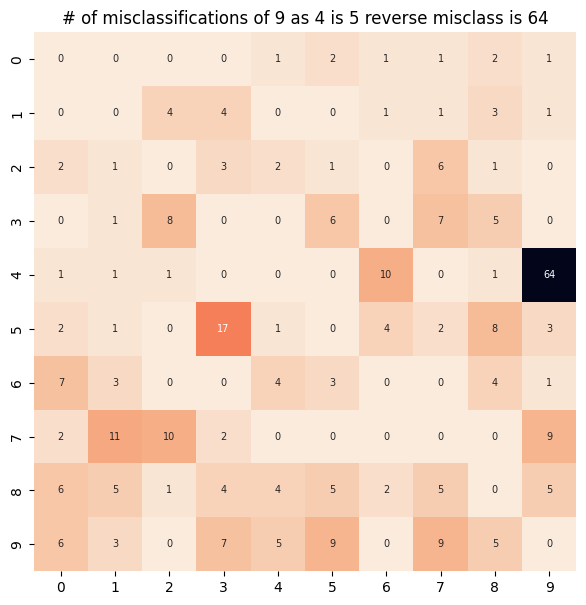

27


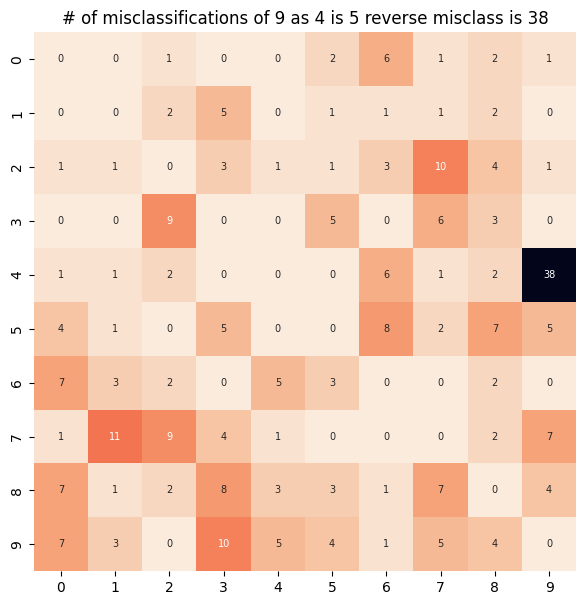

28


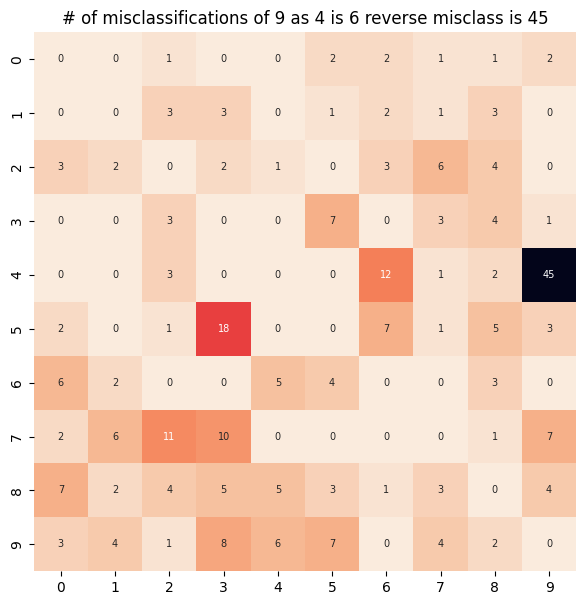

29


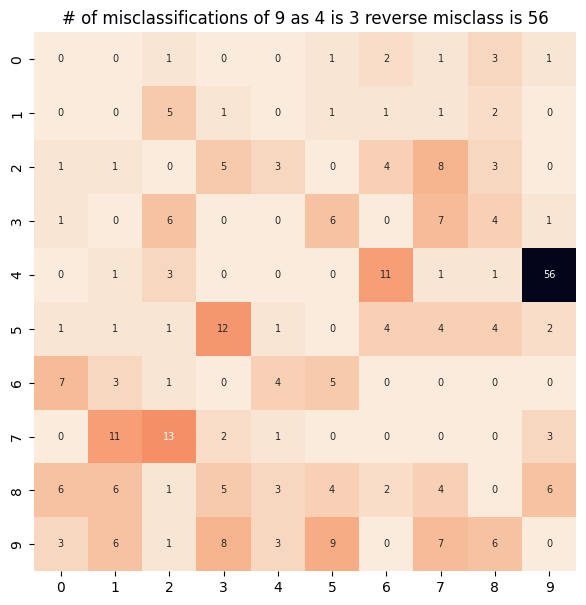

30


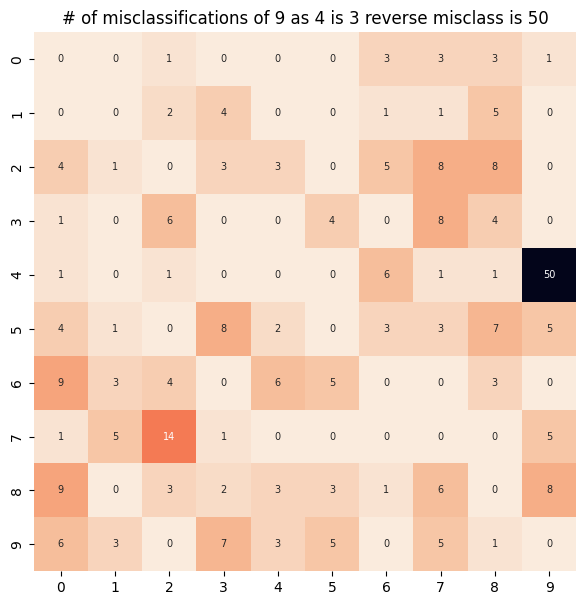

31


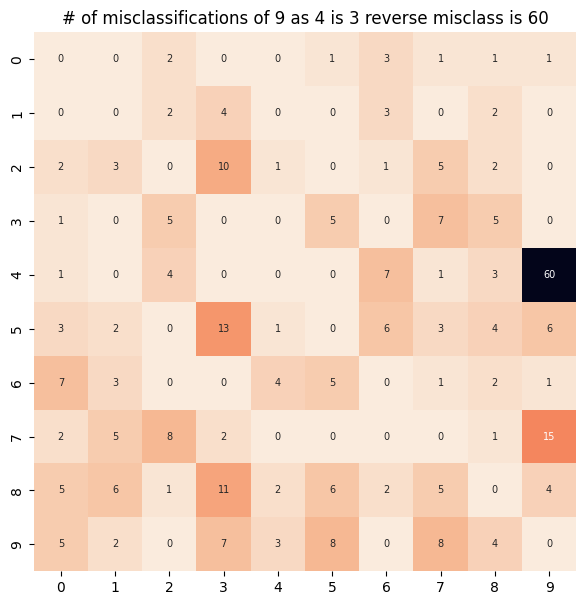

32


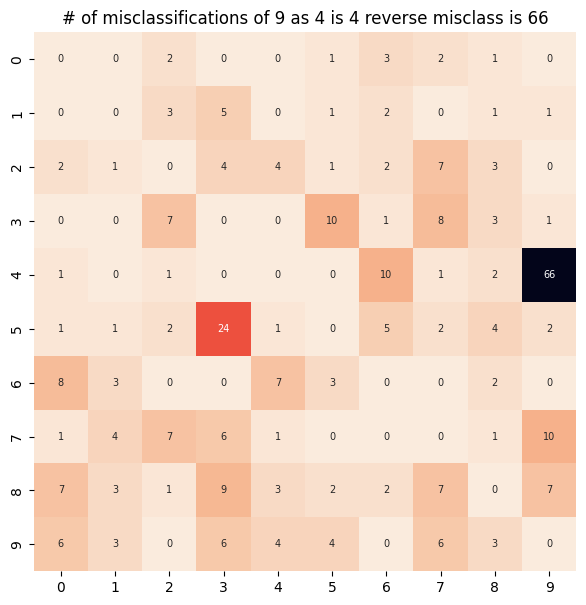

33


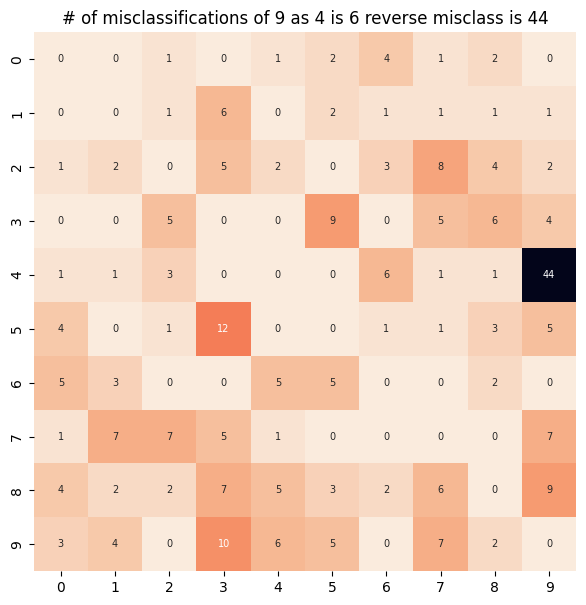

34


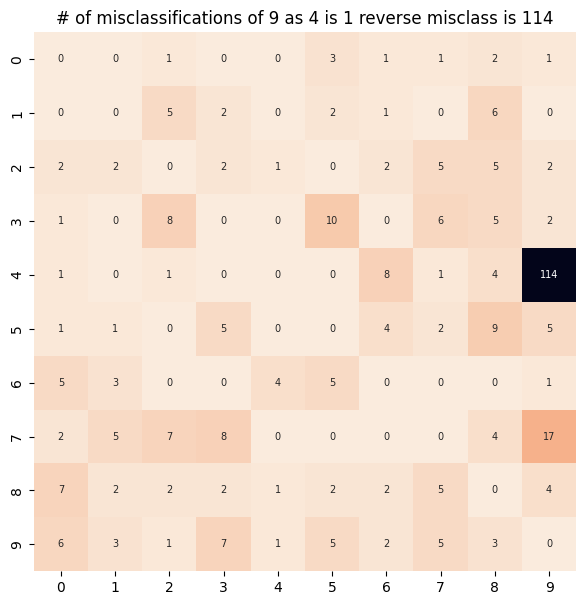

35


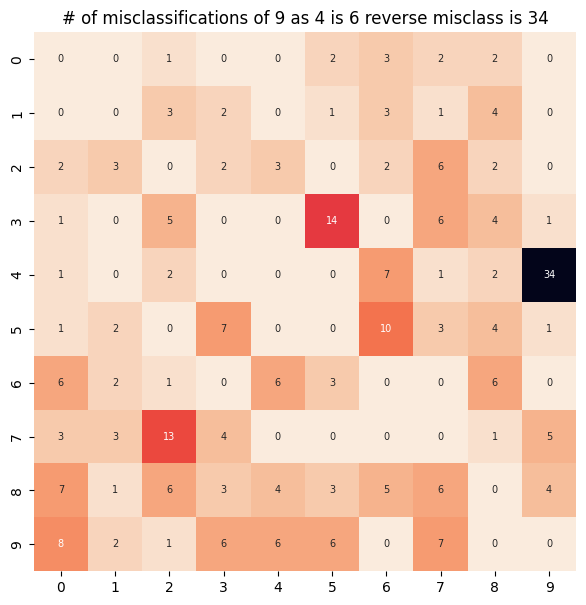

36


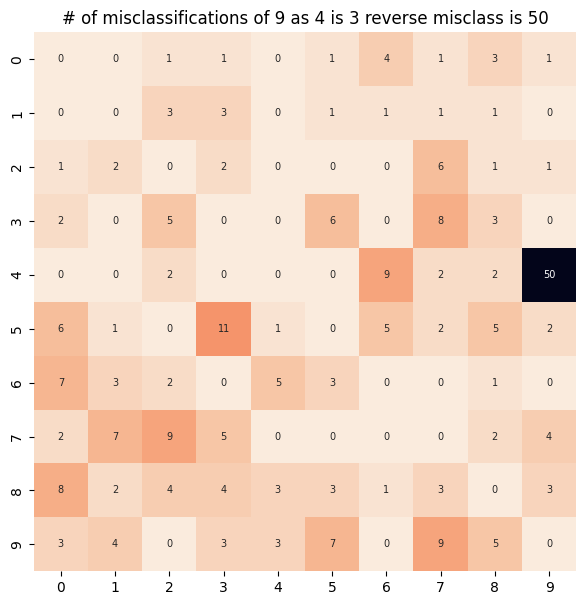

37


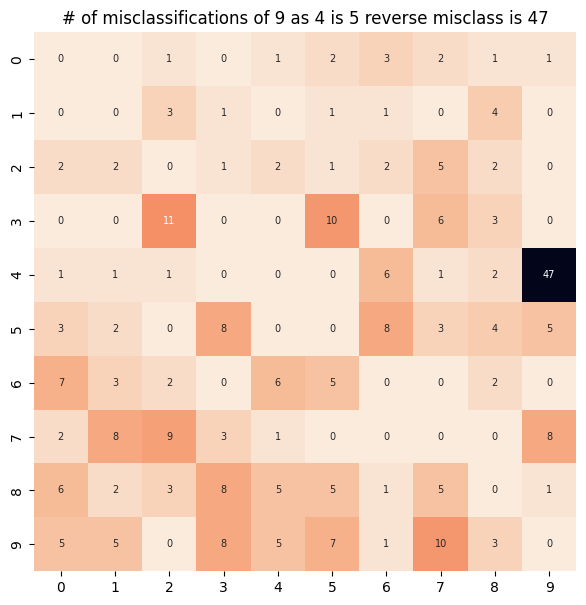

38


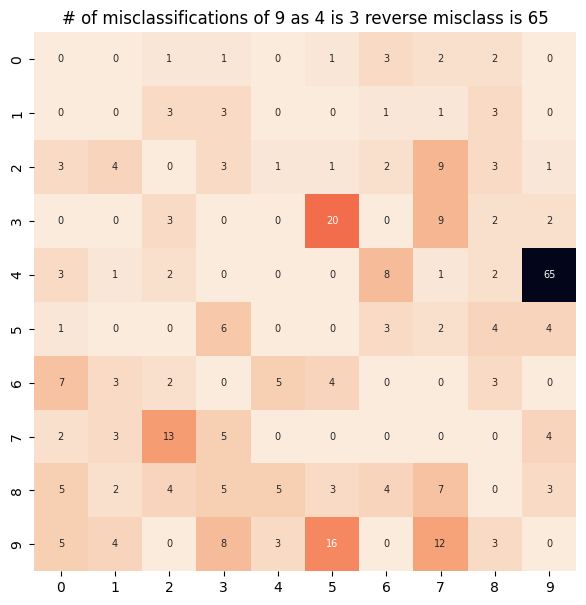

39


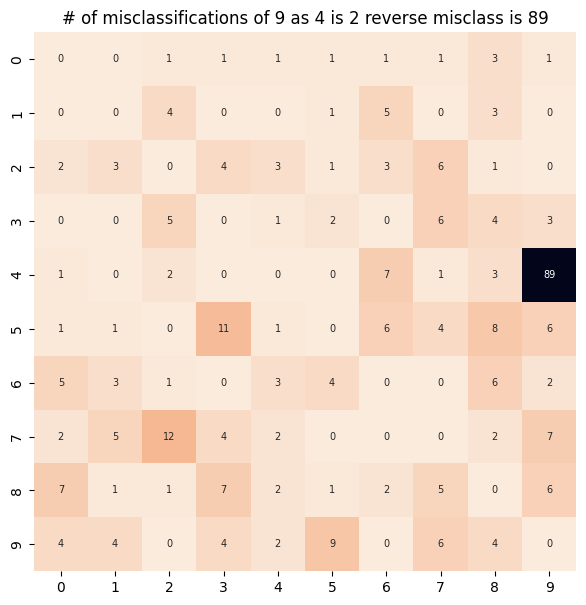

40


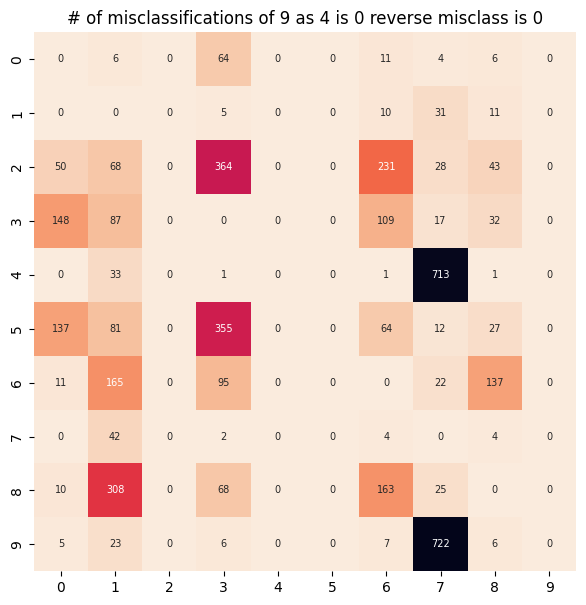

41


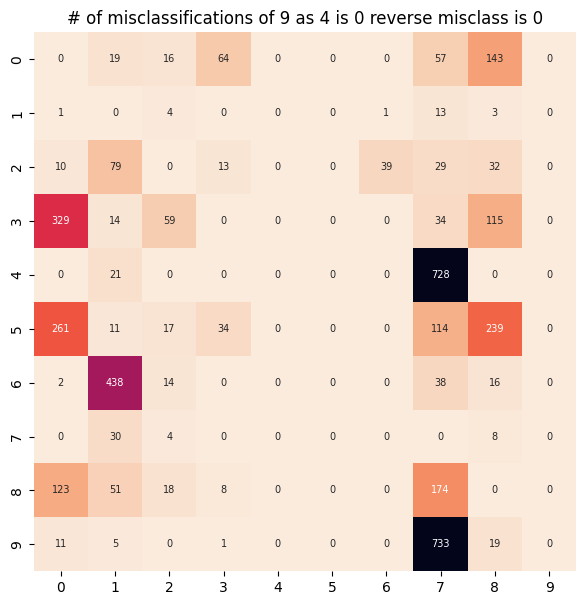

42


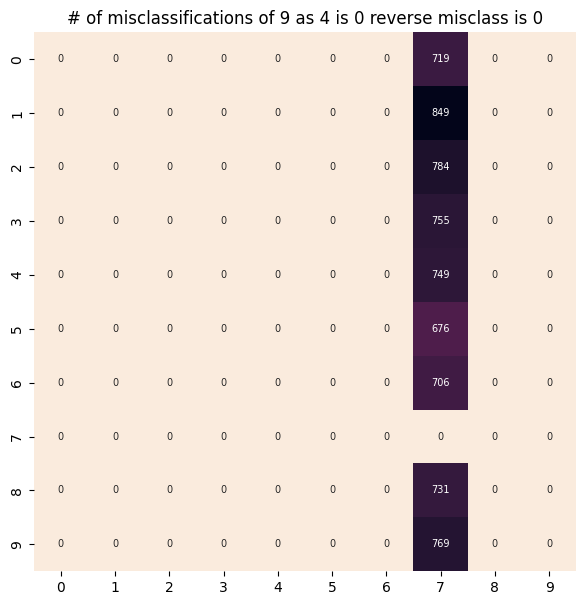

43


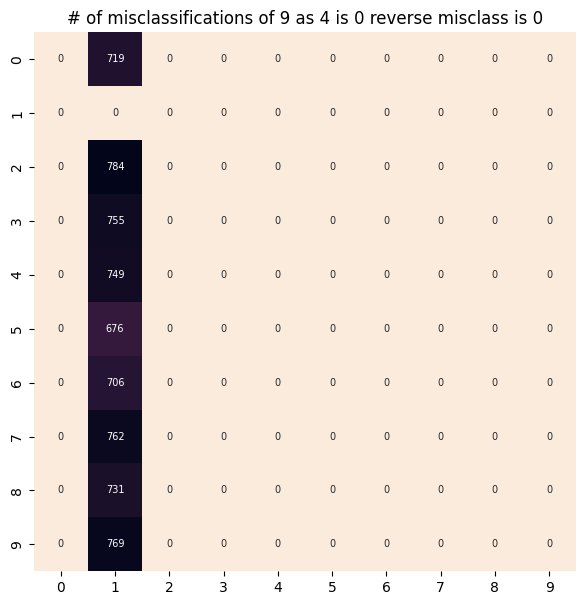

44


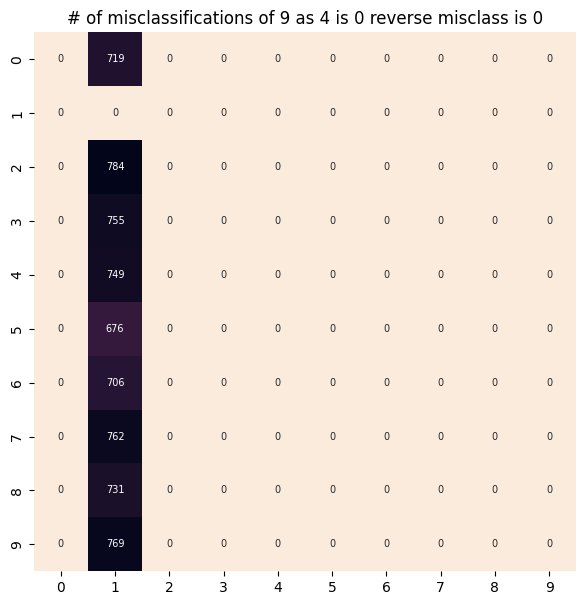

45


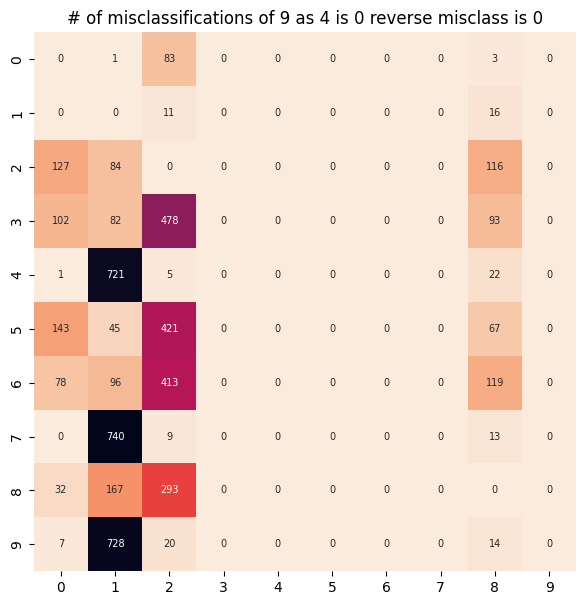

46


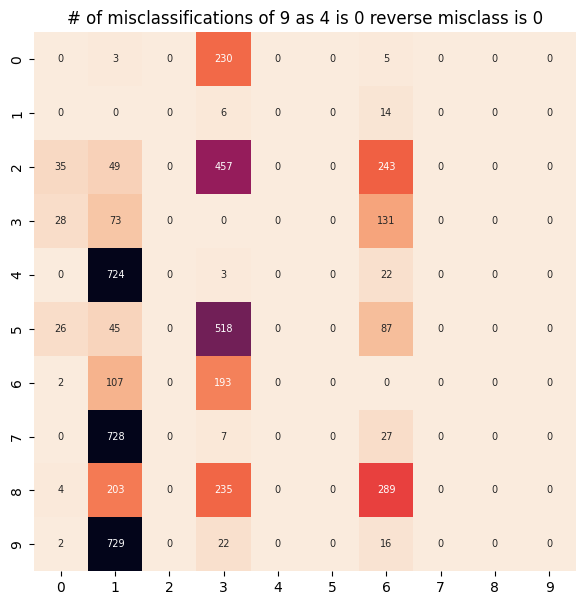

47


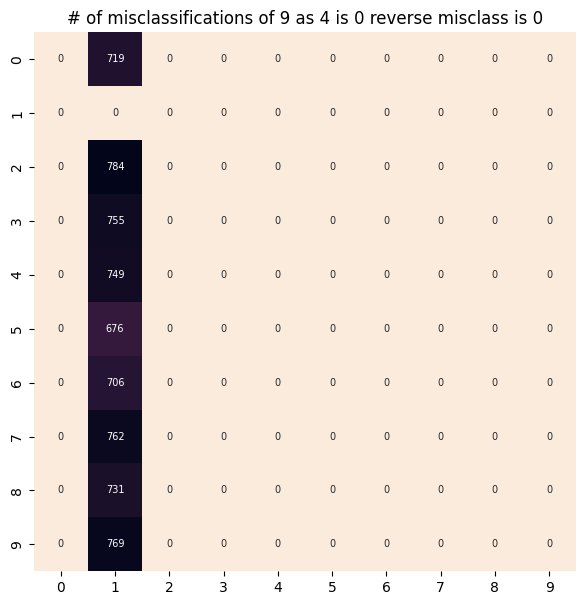

48


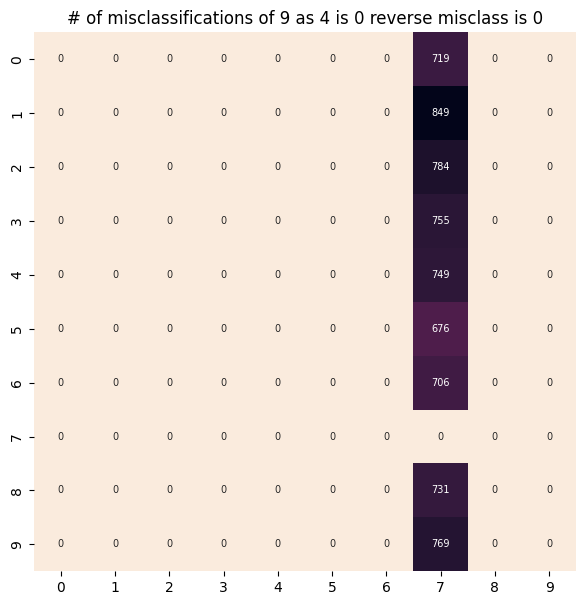

49


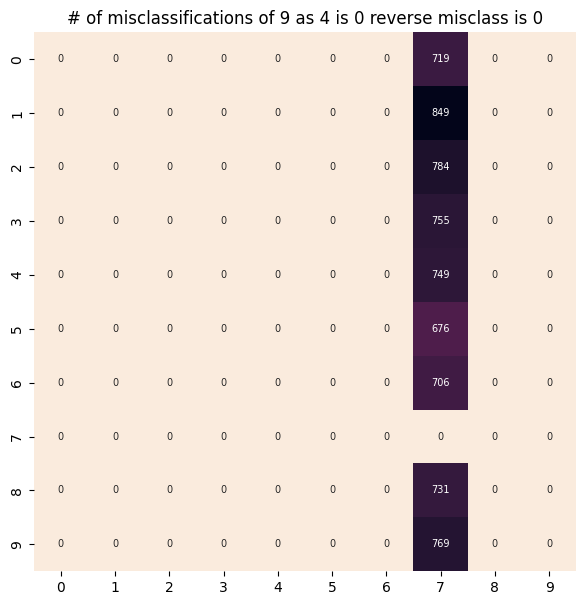

50


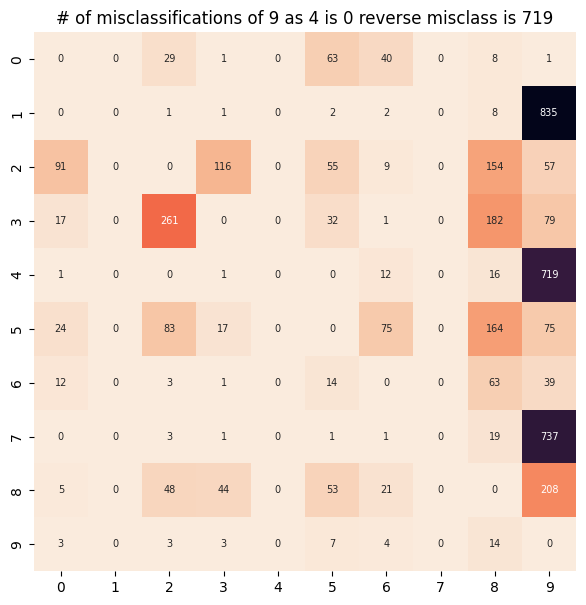

51


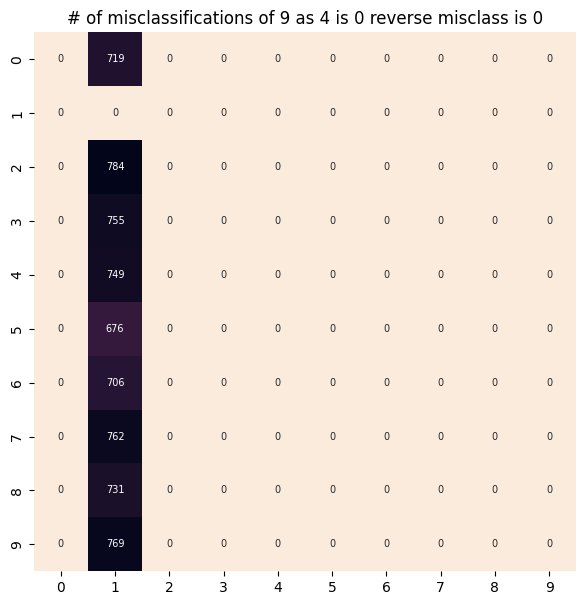

52


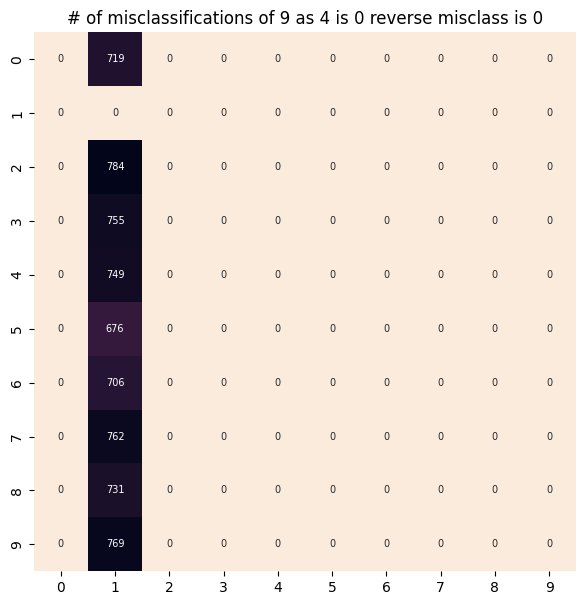

53


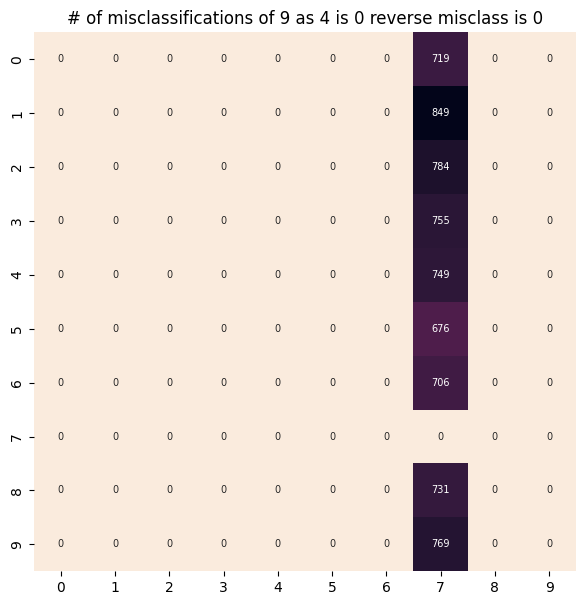

54


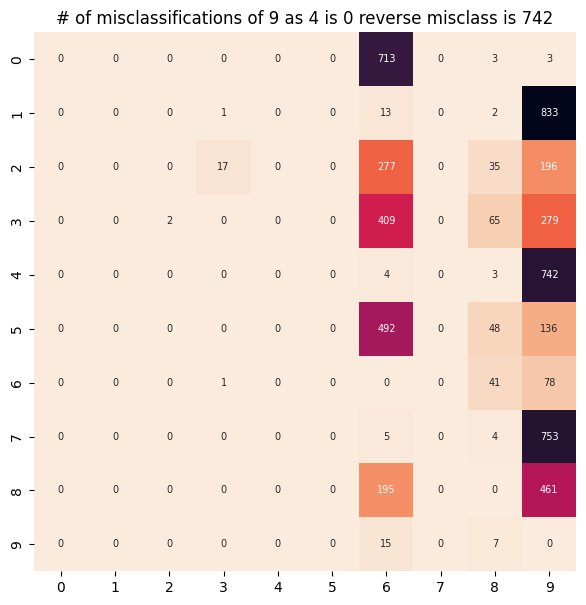

55


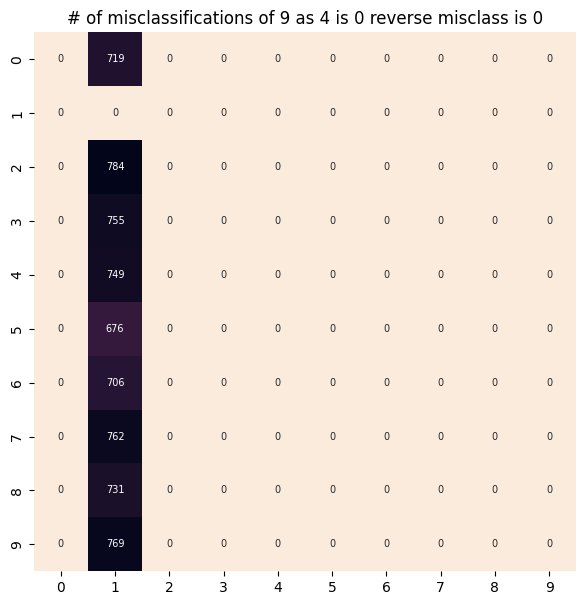

56


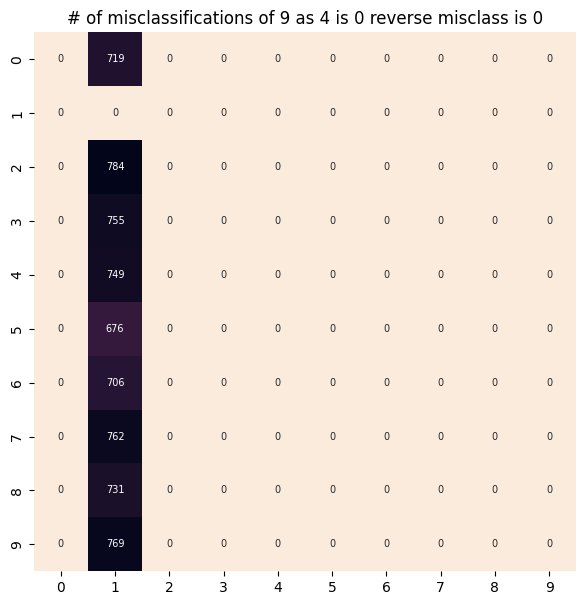

57


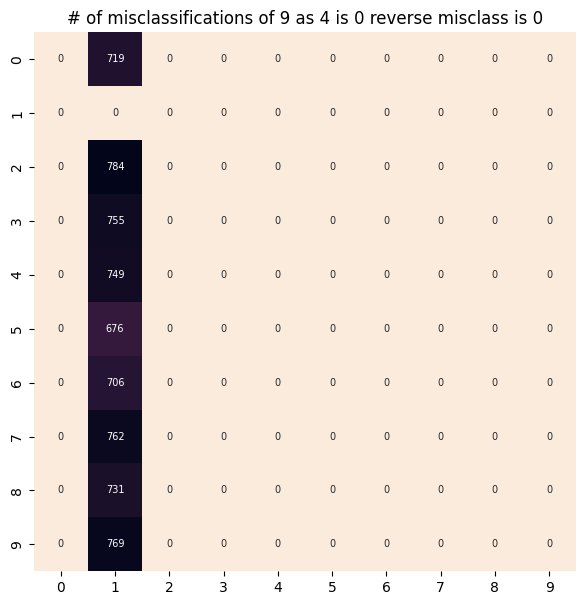

58


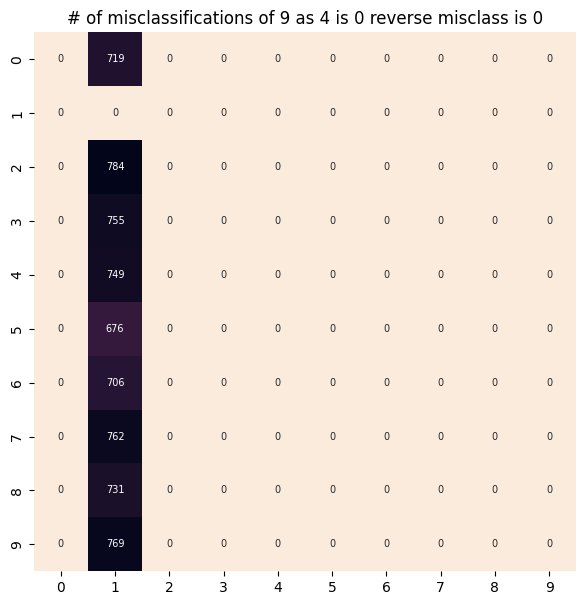

59


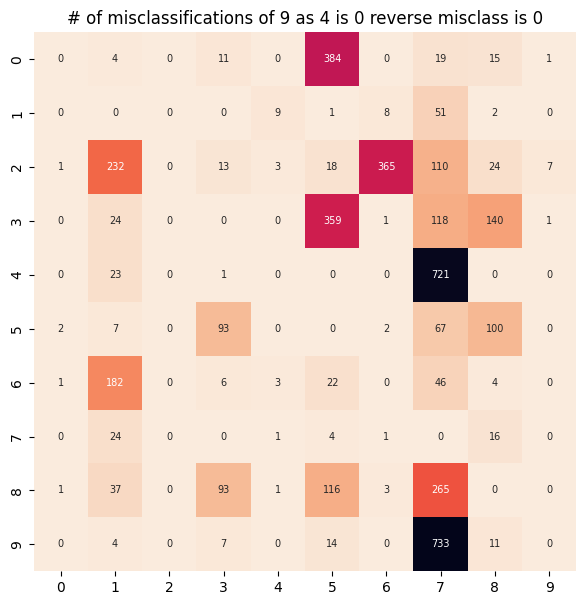

In [ ]:
for i in range(len(df["model_history"])):
  print(i)
  cm = df["model_history"][i].history["cm_per_epoch"][-1].reshape((10,10))
  # cm = cm.reshape((10,10))
  

  # Create figure and axes
  fig, ax = plt.subplots(figsize=(7, 7))


  cm3_wodiag = pd.DataFrame(cm*(np.ones((10,10)) - np.eye(10)))
  plt.xlabel('Predicted Class')
  plt.ylabel('True Class')
  plt.title('# of misclassifications of 9 as 4 is '+str(cm[9][4]) + ' reverse misclass is ' + str(cm[4][9])  ) 
  sns.heatmap(cm3_wodiag, annot=True, annot_kws={"size": 7},  fmt='g', cmap=sns.cm.rocket_r, cbar=False) # font size
  plt.show()




  
  

Average Misclassification Confusion Plot

In [ ]:
# cm_sum = 0

# for i in range(len(df["model_history"])):
#   # print(i)
#   cm_sum += df["model_history"][i].history["cm_per_epoch"][-1].reshape((10,10))
#   # print(cm_sum)

# cm_average = cm_sum/(len(df["model_history"]))
# # print(cm_average)

# # Create figure and axes
# fig, ax = plt.subplots(figsize=(7, 7))


# cm3_wodiag = pd.DataFrame(cm_average*(np.ones((10,10)) - np.eye(10)))
# plt.xlabel('Predicted Class')
# plt.ylabel('True Class')
# plt.title('# of Average misclassifications of 9 as 4 is '+str(cm3_wodiag[4][9]) + ' reverse misclass is ' + str(cm3_wodiag[9][4])  ) 
# sns.heatmap(cm3_wodiag, annot=True, annot_kws={"size": 7},  fmt='.1f', cmap=sns.cm.rocket_r, cbar=False) # font size
# plt.show()


# plt.xlabel('Predicted Class')
# plt.ylabel('True Class')
# plt.title('# of Average misclassifications of 9 as 4 is '+str(cm_average[9][4]) + ' reverse misclass is ' + str(cm_average[4][9]) ) 
# sns.heatmap(cm_average, annot=True, annot_kws={"size": 7},  fmt='.1f', cmap=sns.cm.rocket_r, cbar=False) # font size
# plt.show()


# #The notation for digging into a dataframe versus a numpy array is reversed / its horribly confusing/ but it is  listed above correctly




ImportLibraries_DefineFunctions.py:187: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(20, 10))


<Figure size 2000x1000 with 0 Axes>

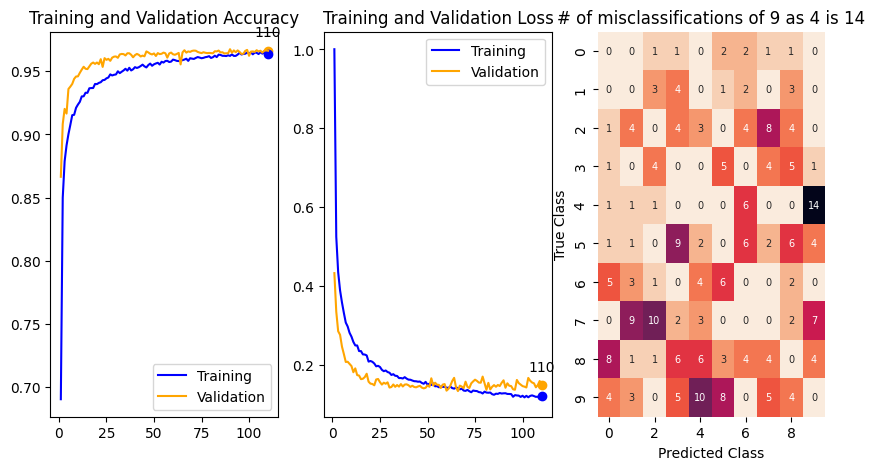

<Figure size 2000x1000 with 0 Axes>

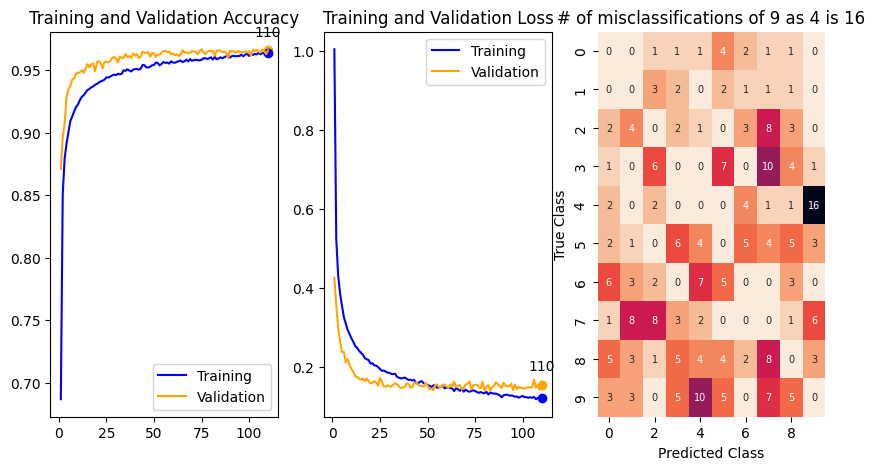

<Figure size 2000x1000 with 0 Axes>

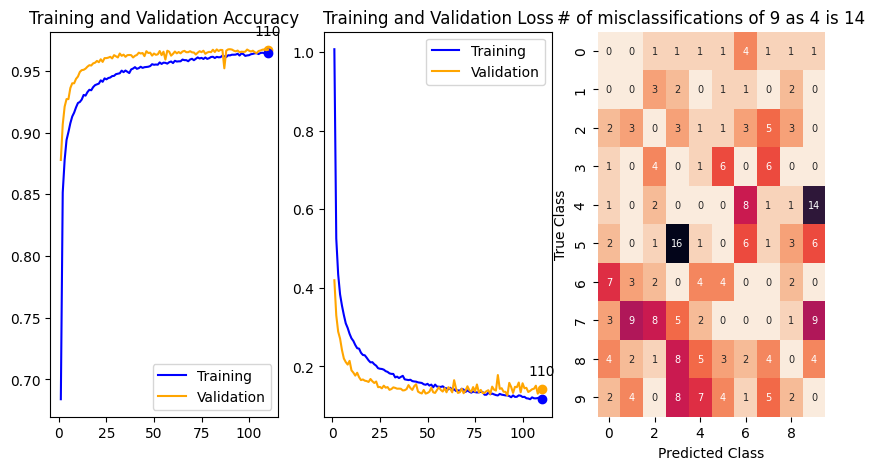

<Figure size 2000x1000 with 0 Axes>

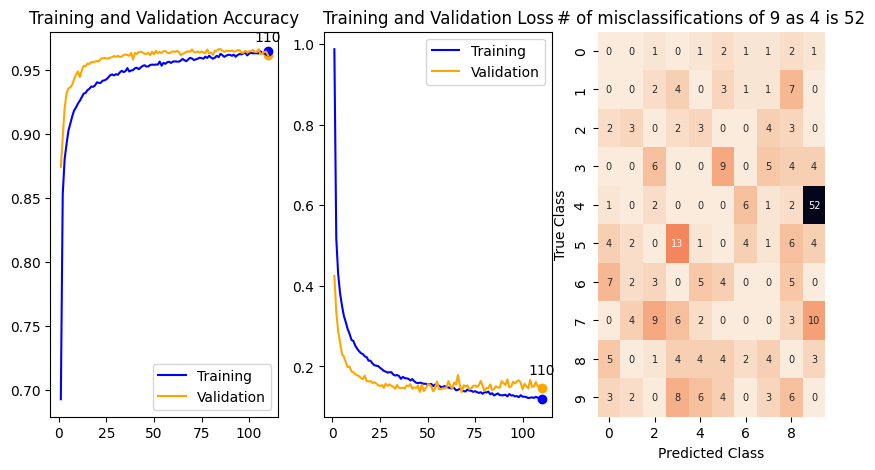

<Figure size 2000x1000 with 0 Axes>

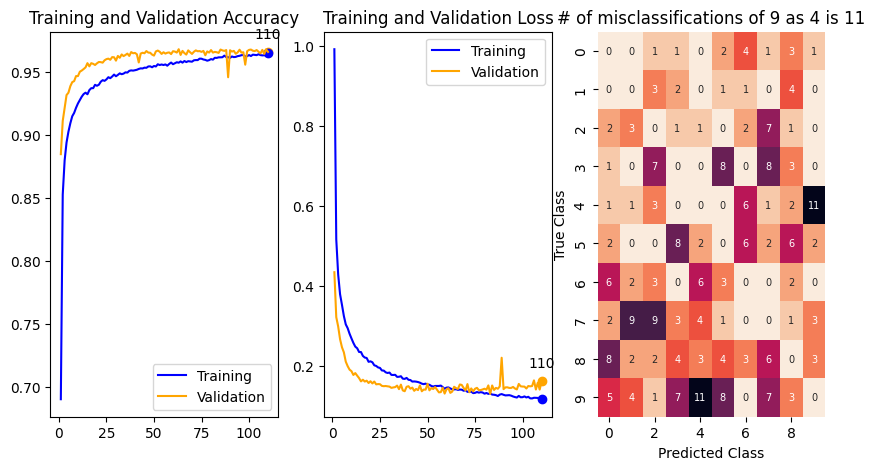

<Figure size 2000x1000 with 0 Axes>

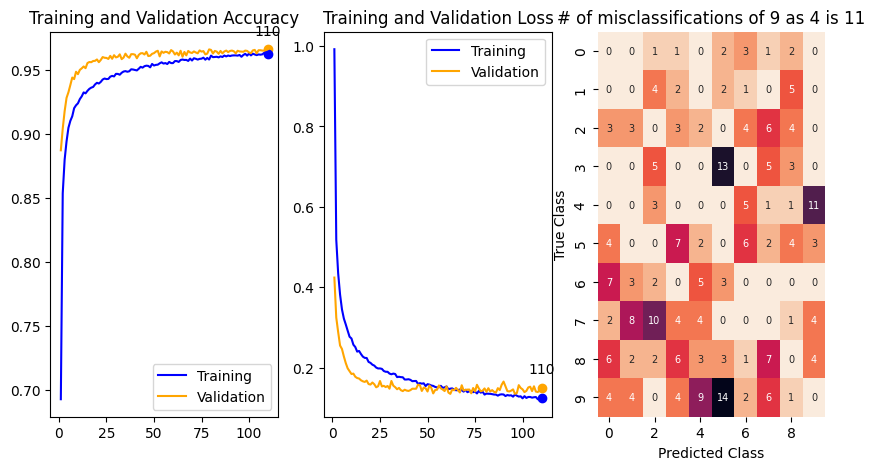

<Figure size 2000x1000 with 0 Axes>

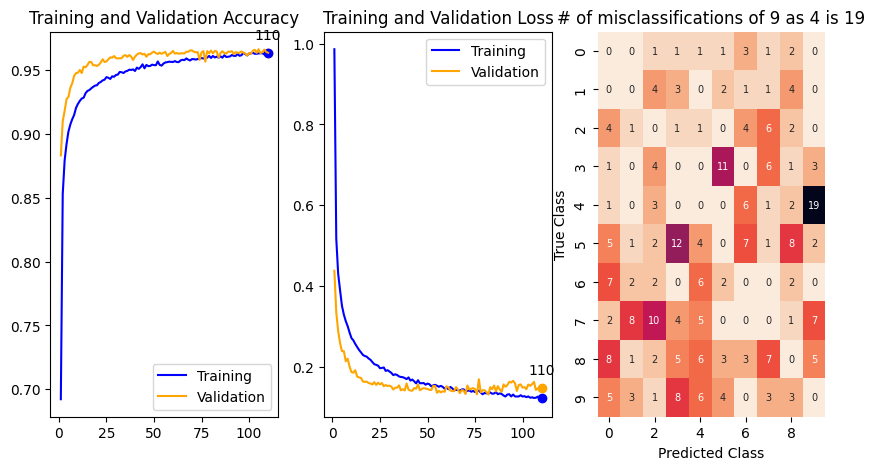

<Figure size 2000x1000 with 0 Axes>

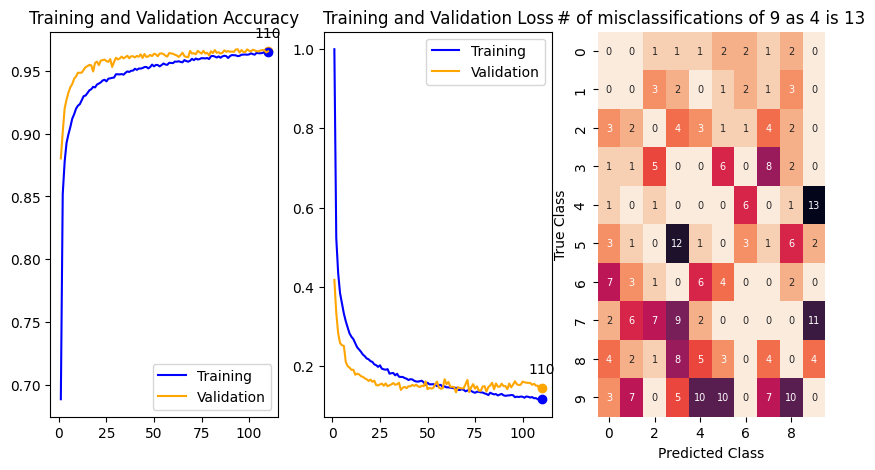

<Figure size 2000x1000 with 0 Axes>

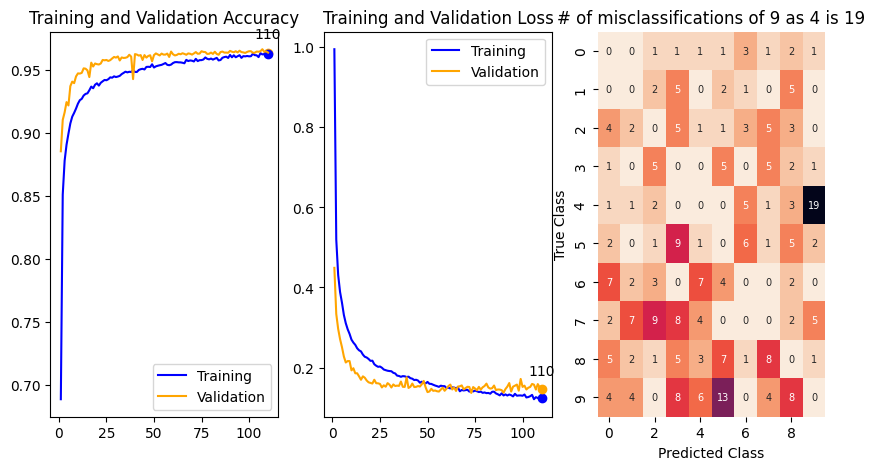

<Figure size 2000x1000 with 0 Axes>

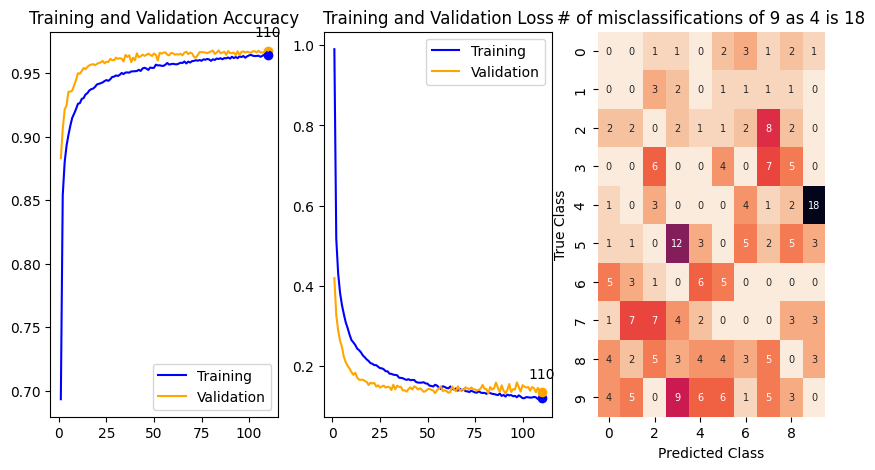

<Figure size 2000x1000 with 0 Axes>

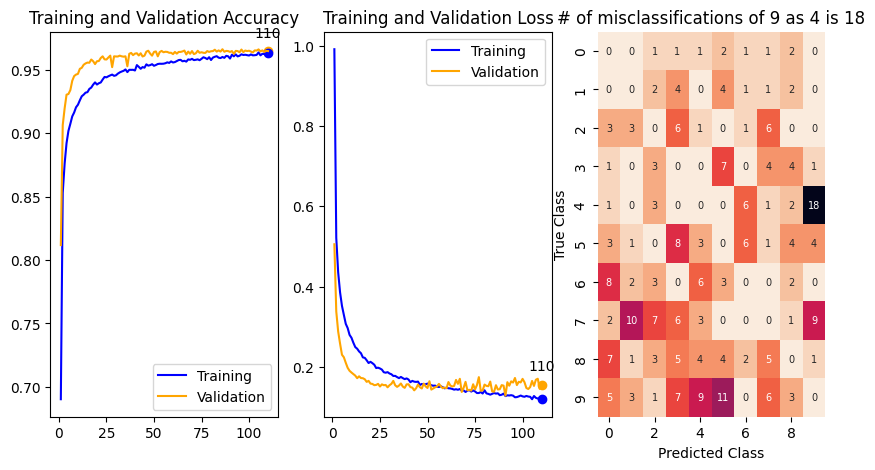

<Figure size 2000x1000 with 0 Axes>

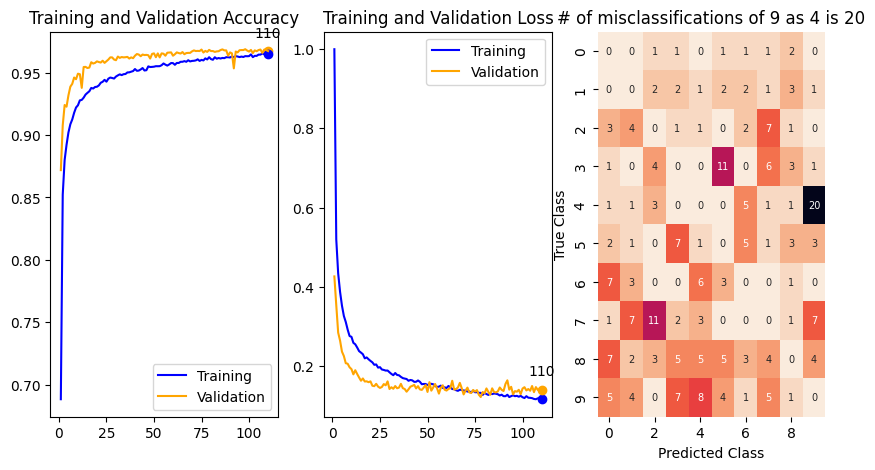

<Figure size 2000x1000 with 0 Axes>

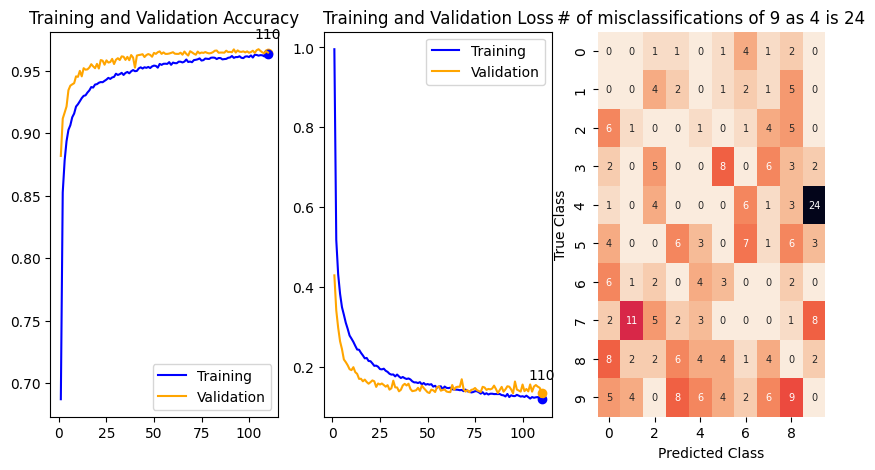

<Figure size 2000x1000 with 0 Axes>

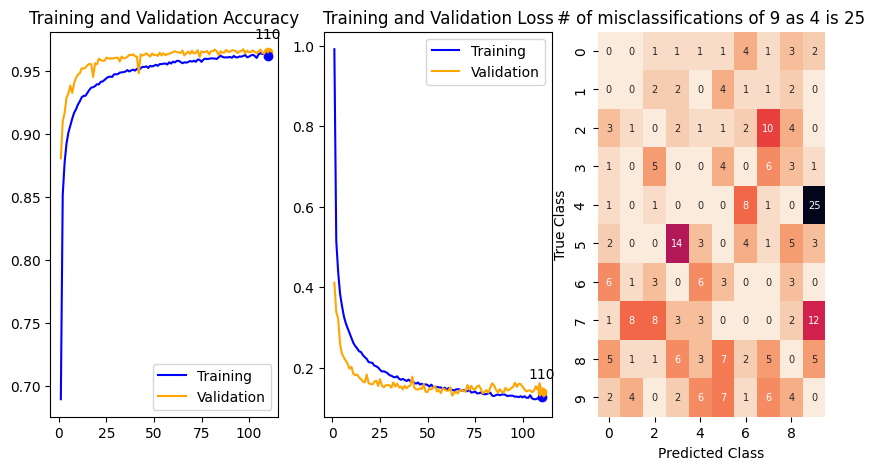

<Figure size 2000x1000 with 0 Axes>

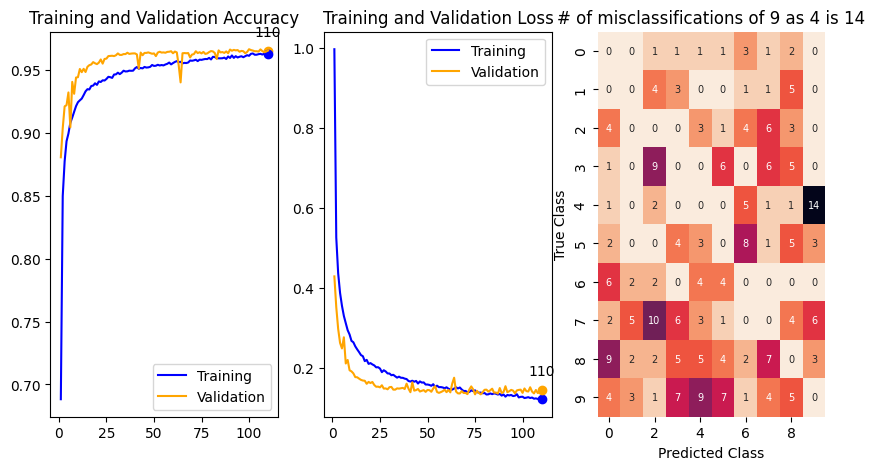

<Figure size 2000x1000 with 0 Axes>

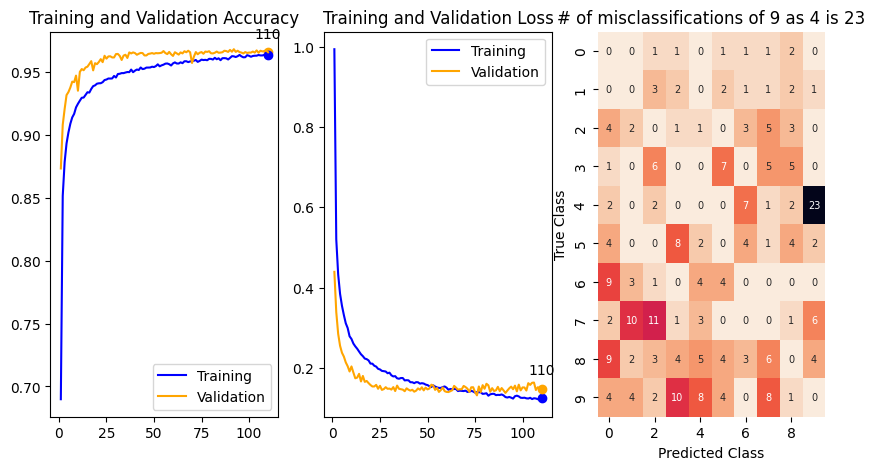

<Figure size 2000x1000 with 0 Axes>

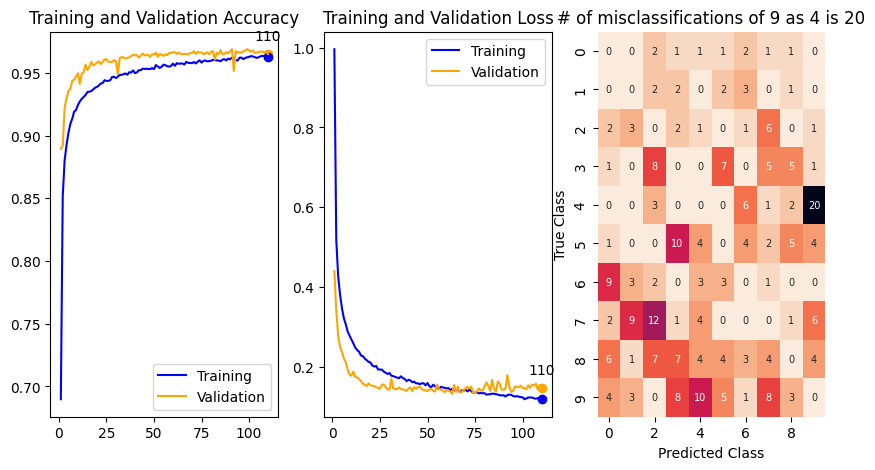

<Figure size 2000x1000 with 0 Axes>

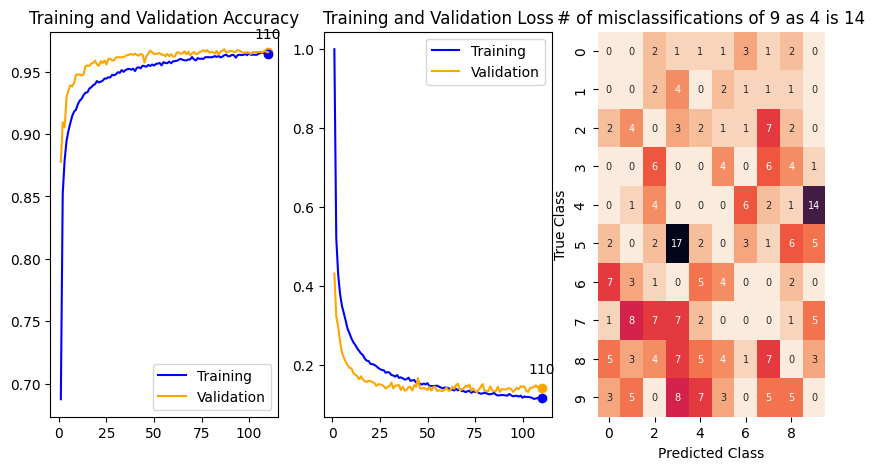

<Figure size 2000x1000 with 0 Axes>

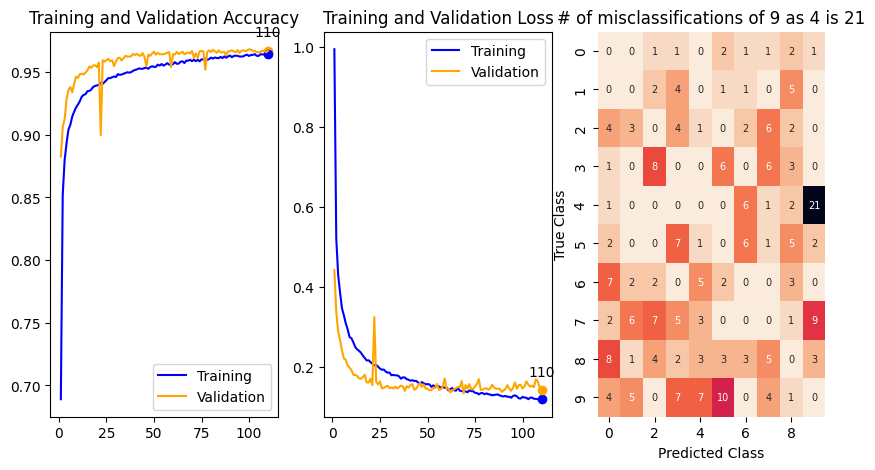

<Figure size 2000x1000 with 0 Axes>

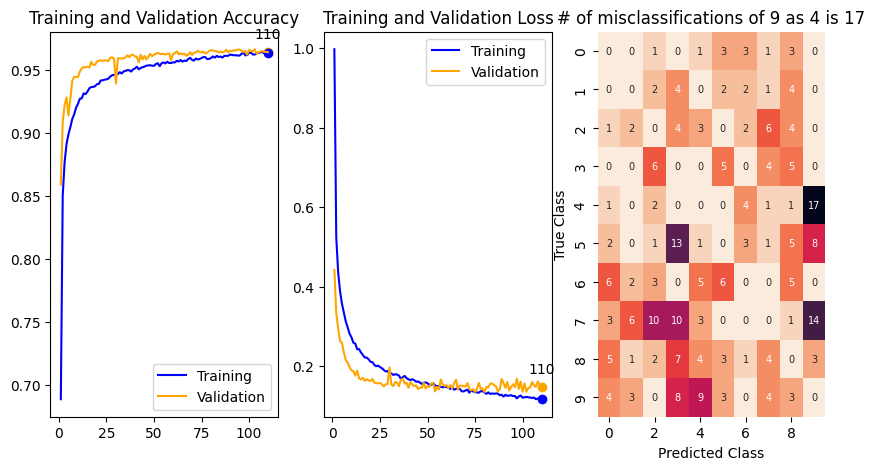

<Figure size 2000x1000 with 0 Axes>

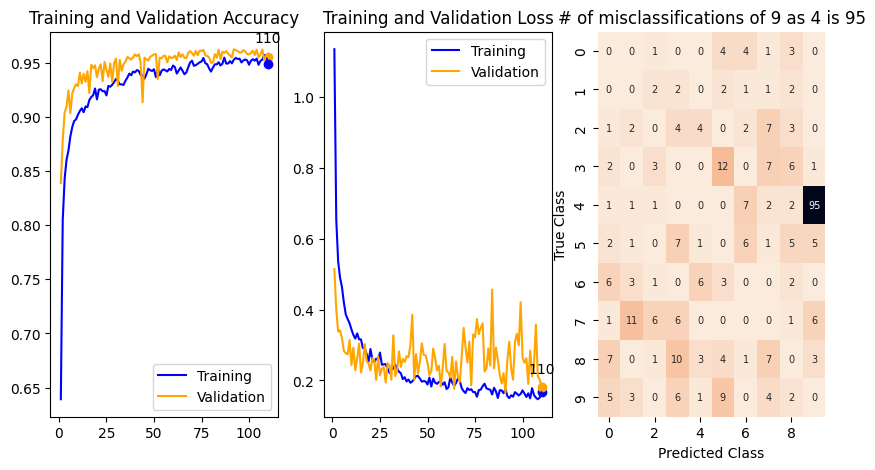

<Figure size 2000x1000 with 0 Axes>

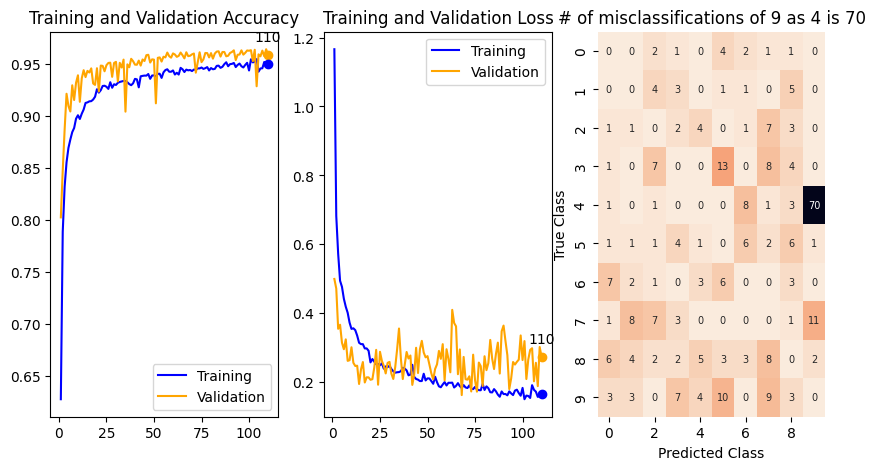

<Figure size 2000x1000 with 0 Axes>

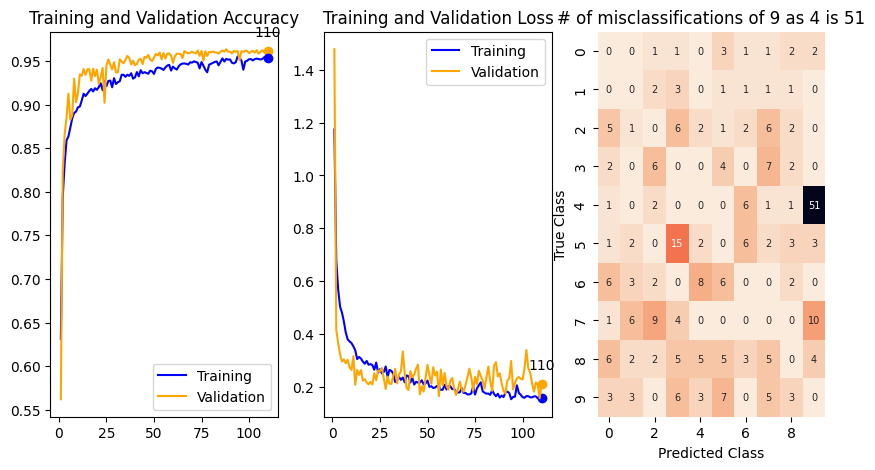

<Figure size 2000x1000 with 0 Axes>

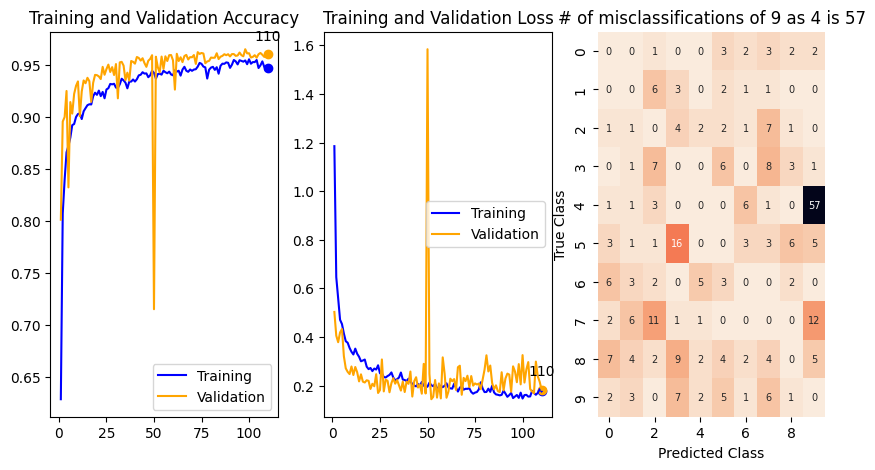

<Figure size 2000x1000 with 0 Axes>

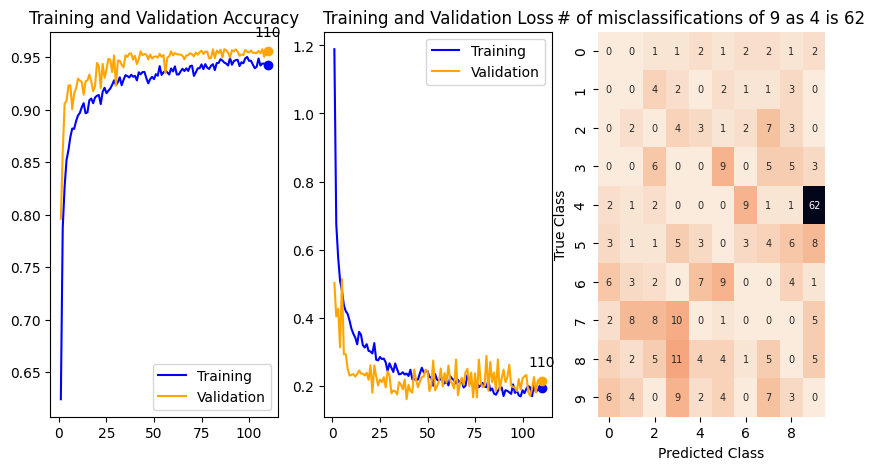

<Figure size 2000x1000 with 0 Axes>

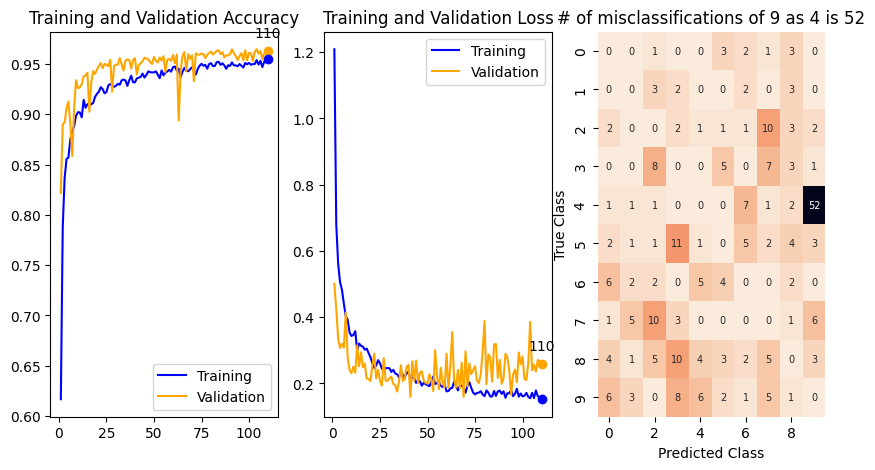

<Figure size 2000x1000 with 0 Axes>

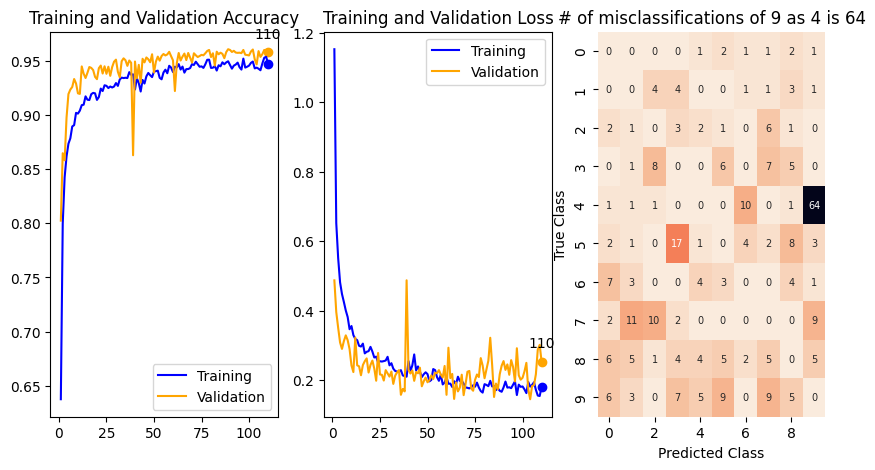

<Figure size 2000x1000 with 0 Axes>

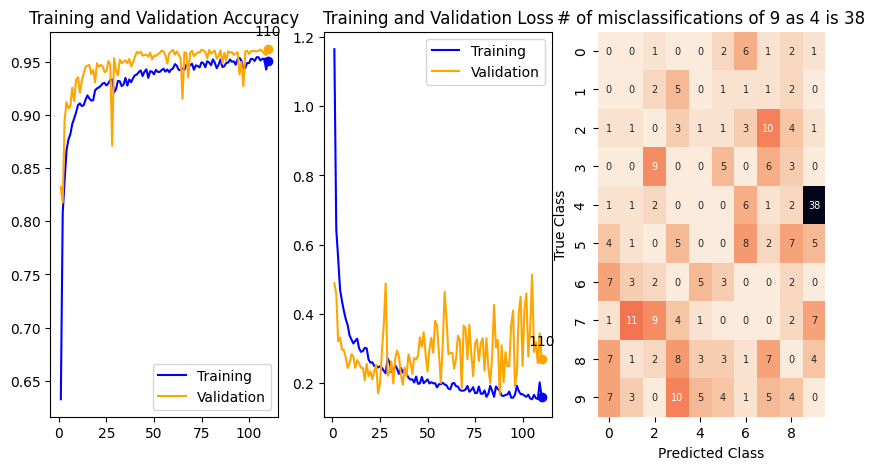

<Figure size 2000x1000 with 0 Axes>

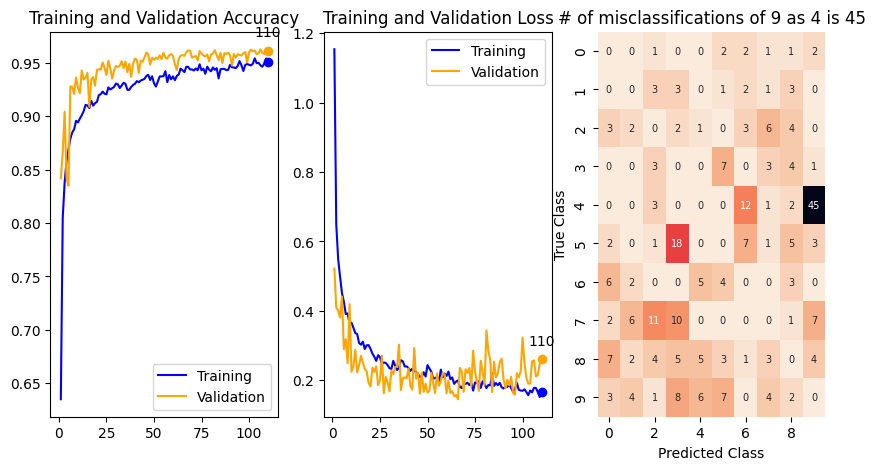

<Figure size 2000x1000 with 0 Axes>

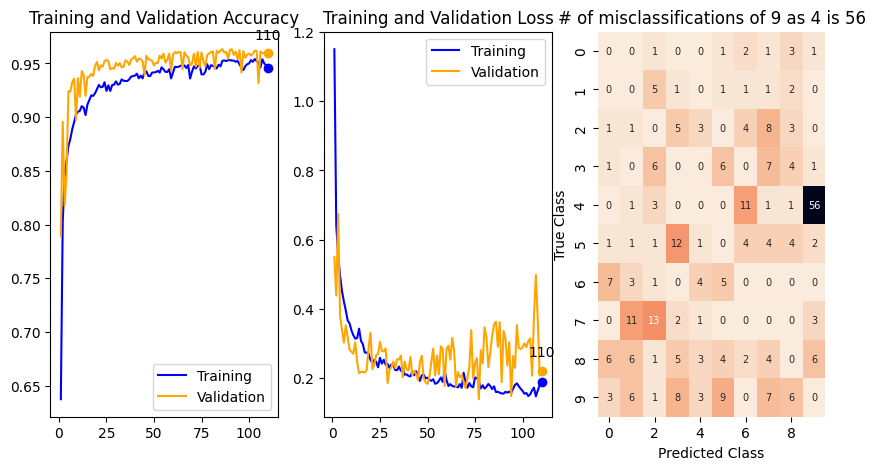

<Figure size 2000x1000 with 0 Axes>

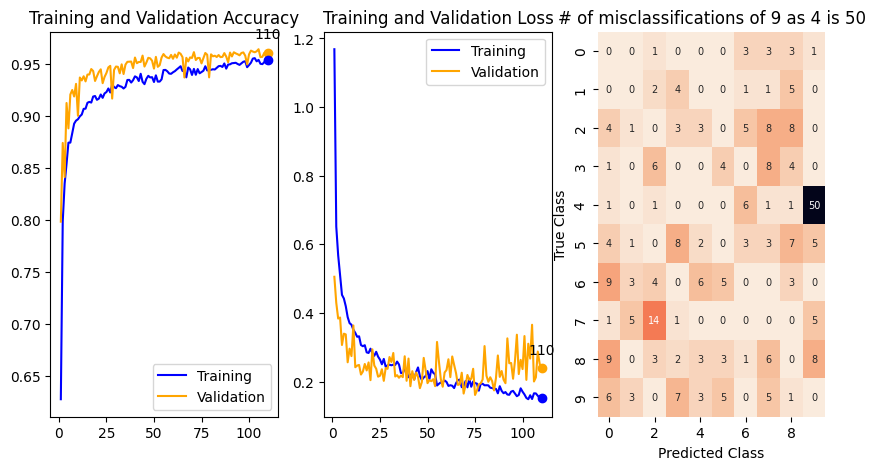

<Figure size 2000x1000 with 0 Axes>

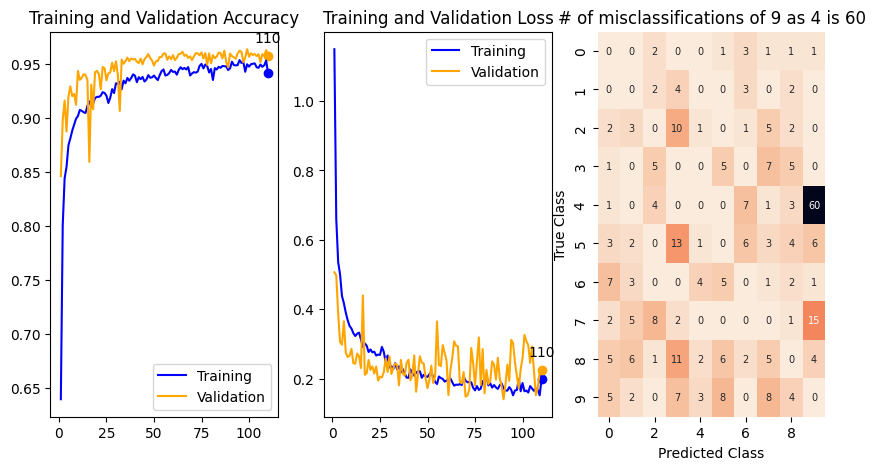

<Figure size 2000x1000 with 0 Axes>

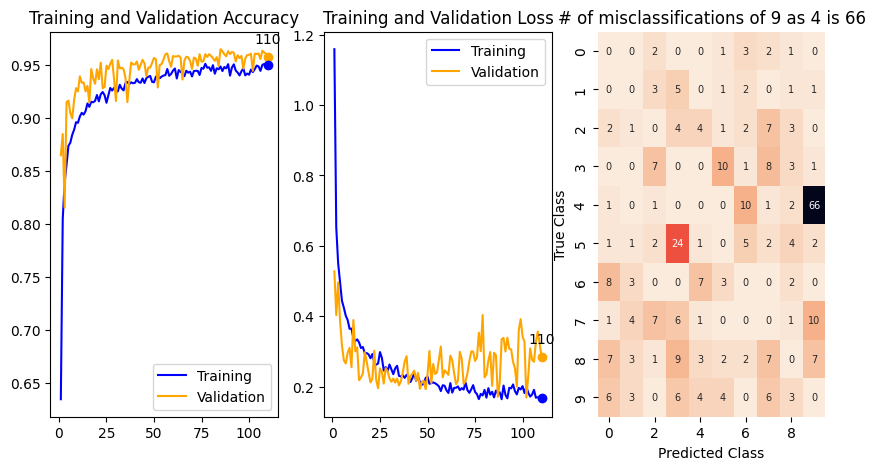

<Figure size 2000x1000 with 0 Axes>

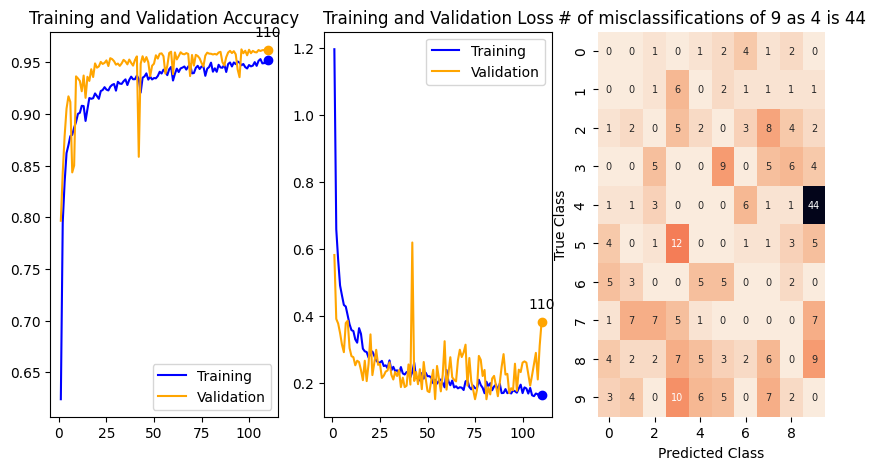

<Figure size 2000x1000 with 0 Axes>

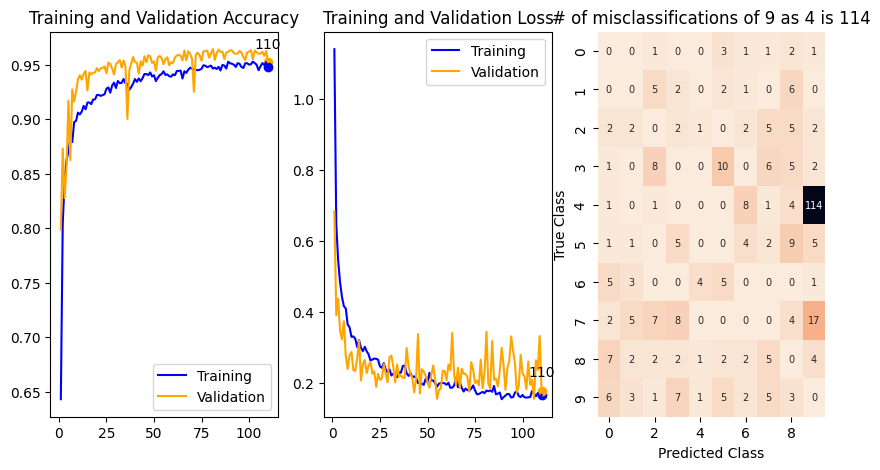

<Figure size 2000x1000 with 0 Axes>

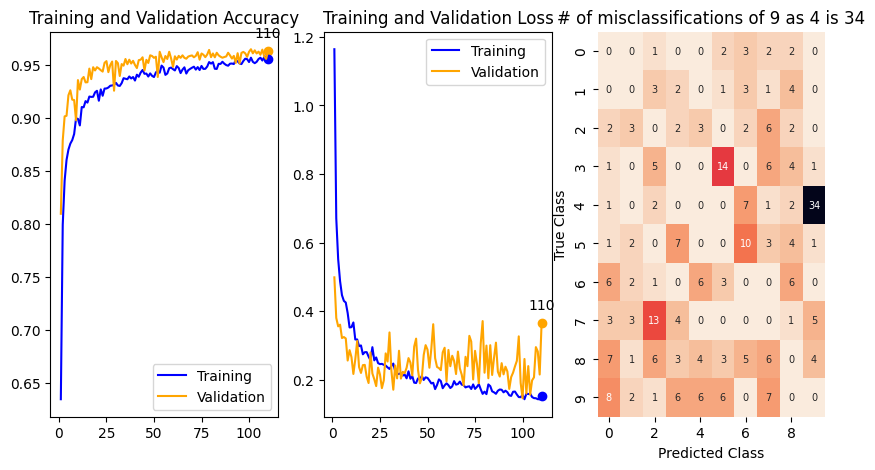

<Figure size 2000x1000 with 0 Axes>

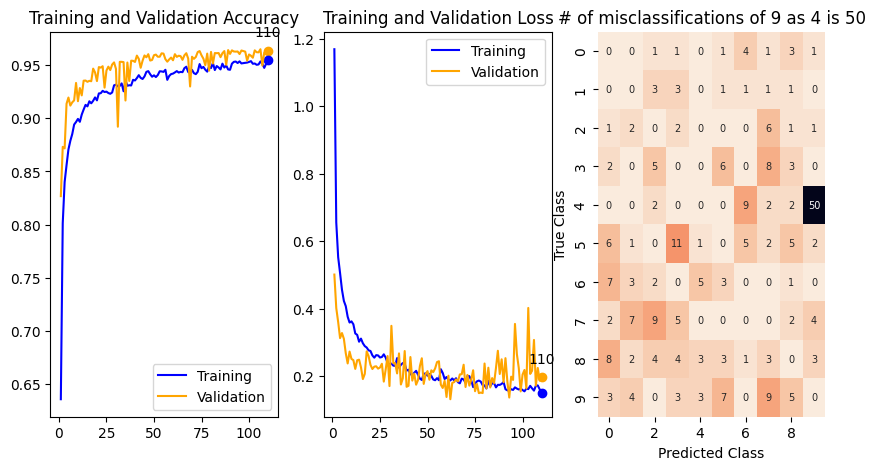

<Figure size 2000x1000 with 0 Axes>

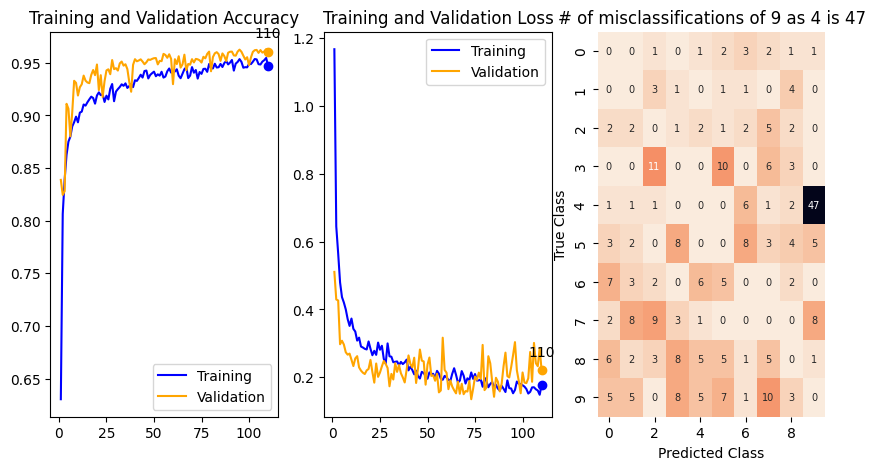

<Figure size 2000x1000 with 0 Axes>

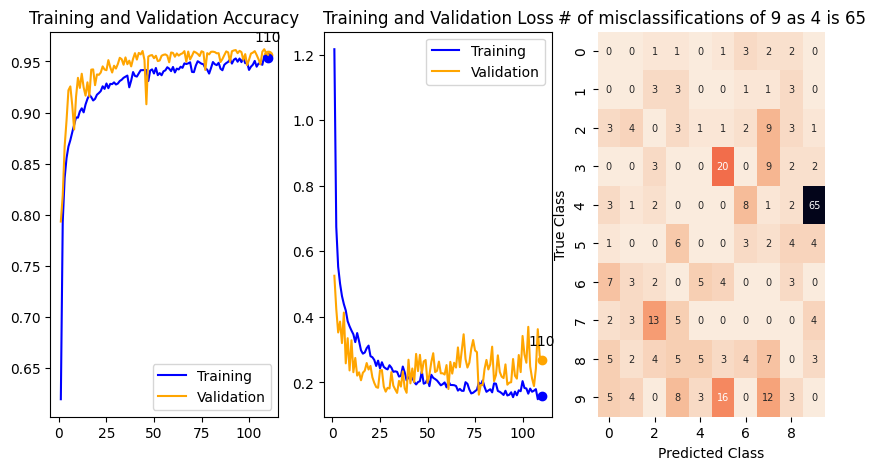

<Figure size 2000x1000 with 0 Axes>

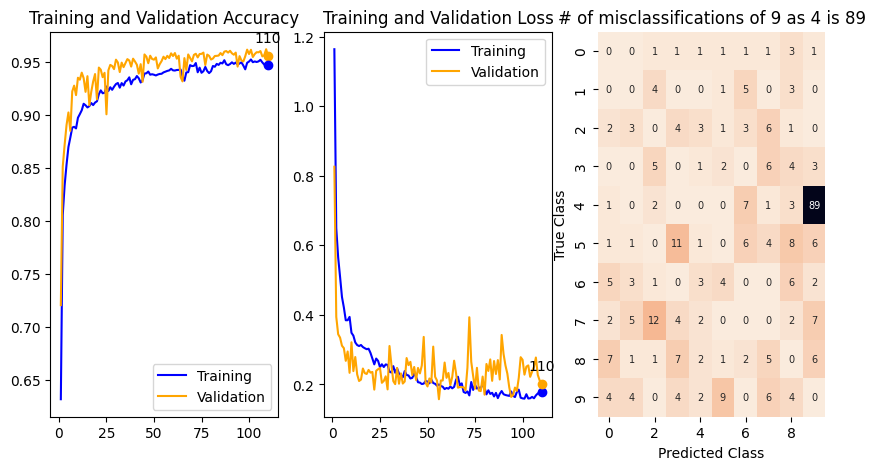

<Figure size 2000x1000 with 0 Axes>

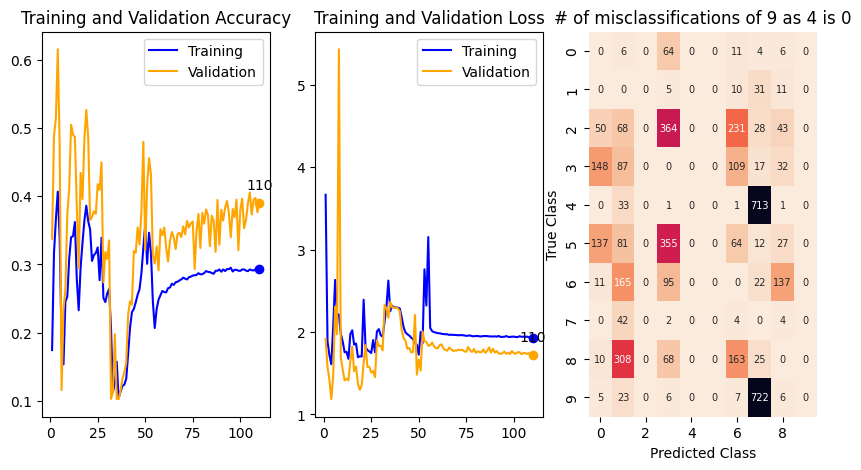

<Figure size 2000x1000 with 0 Axes>

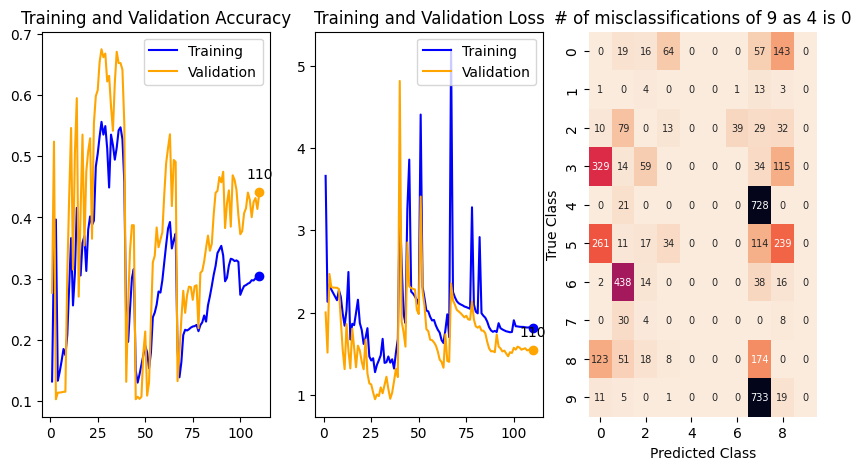

<Figure size 2000x1000 with 0 Axes>

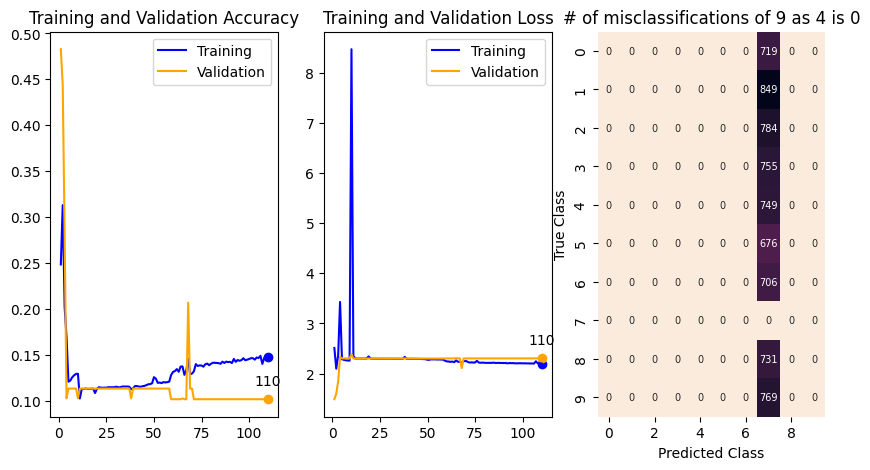

<Figure size 2000x1000 with 0 Axes>

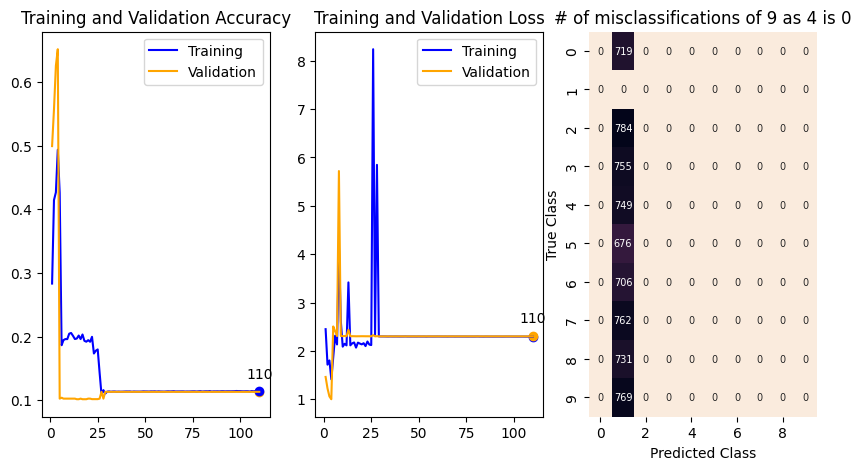

<Figure size 2000x1000 with 0 Axes>

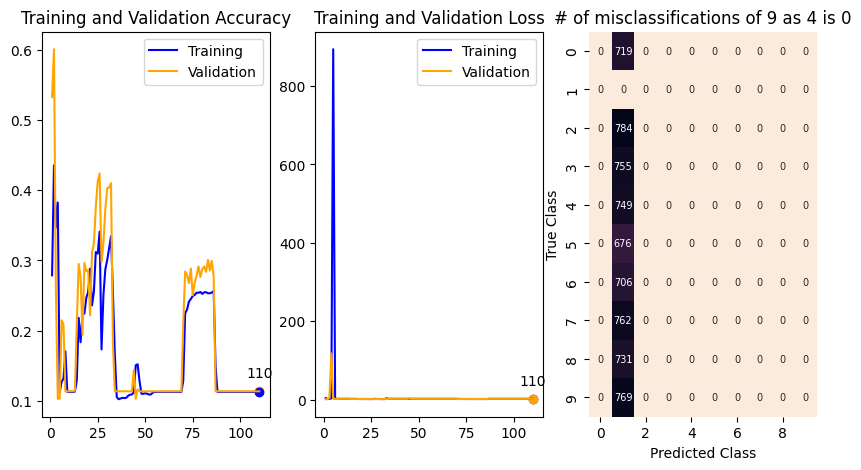

<Figure size 2000x1000 with 0 Axes>

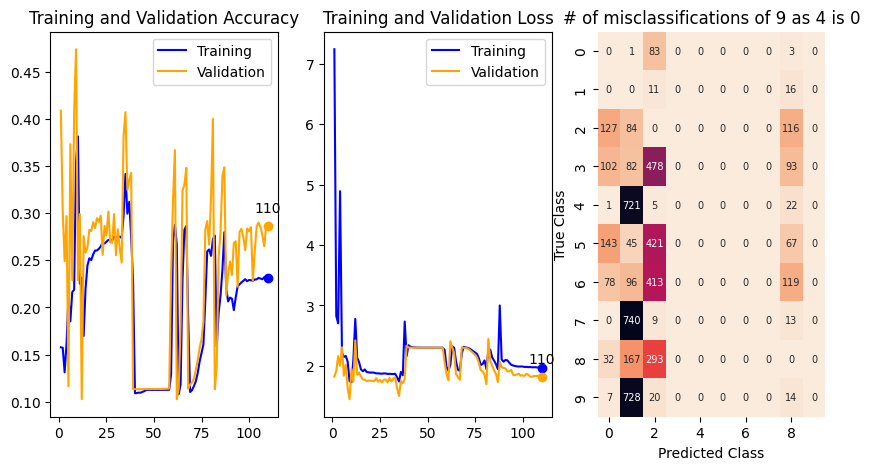

<Figure size 2000x1000 with 0 Axes>

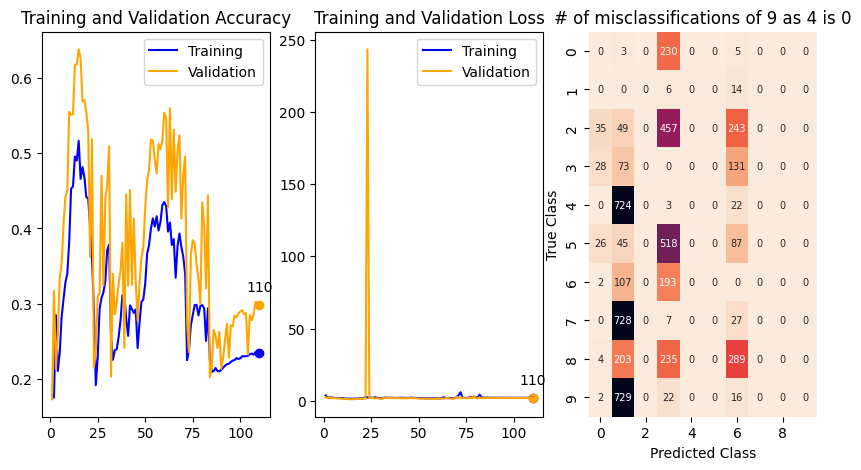

<Figure size 2000x1000 with 0 Axes>

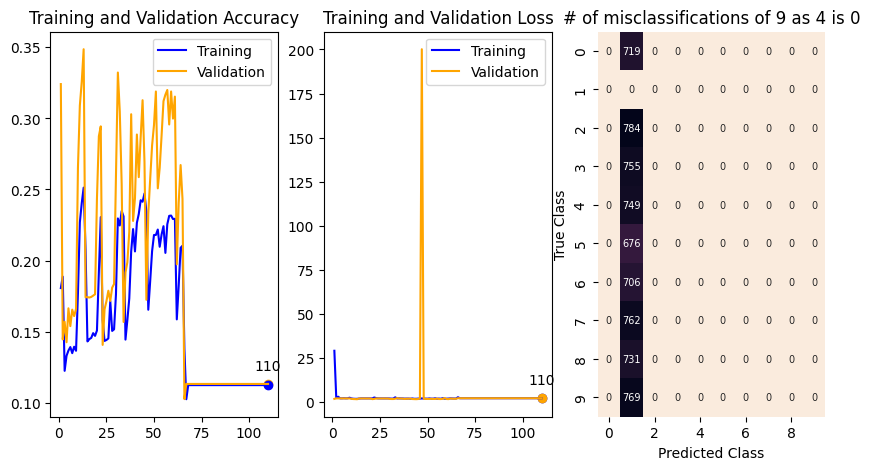

<Figure size 2000x1000 with 0 Axes>

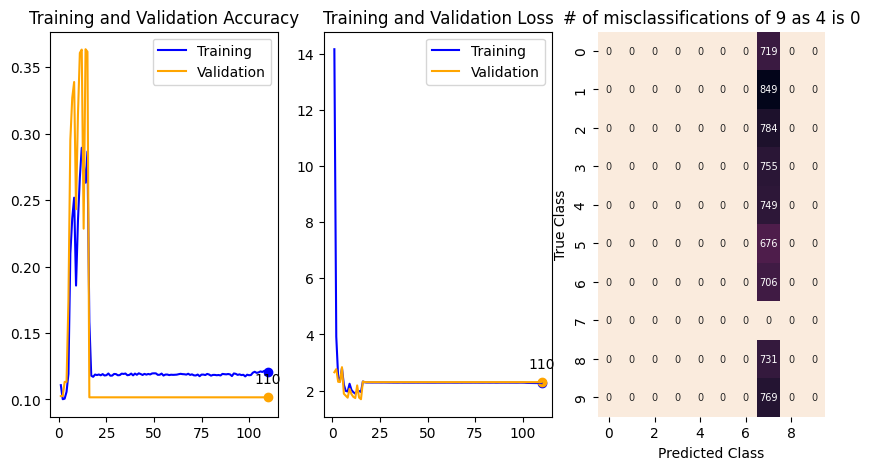

<Figure size 2000x1000 with 0 Axes>

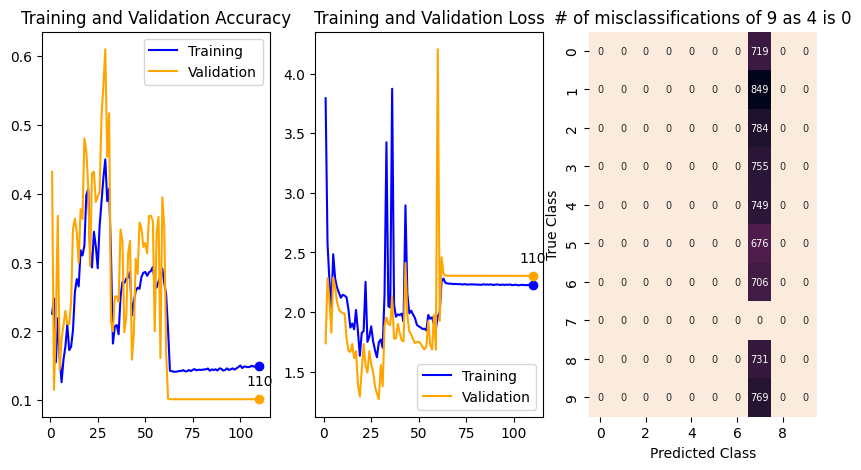

<Figure size 2000x1000 with 0 Axes>

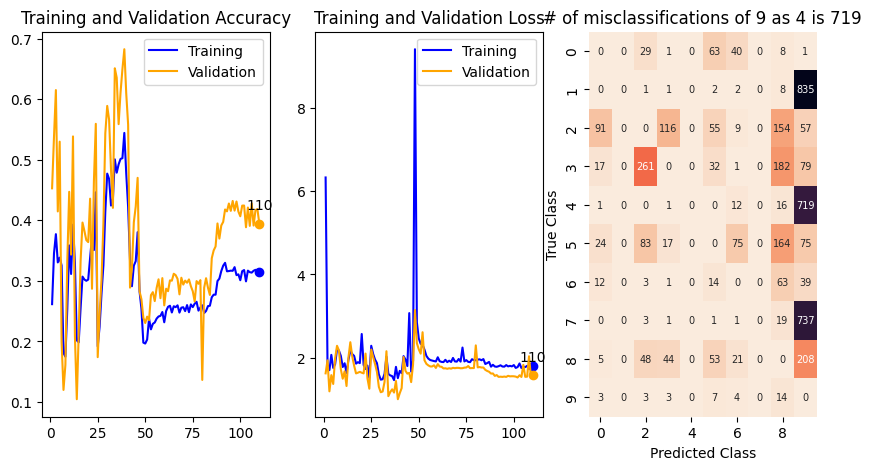

<Figure size 2000x1000 with 0 Axes>

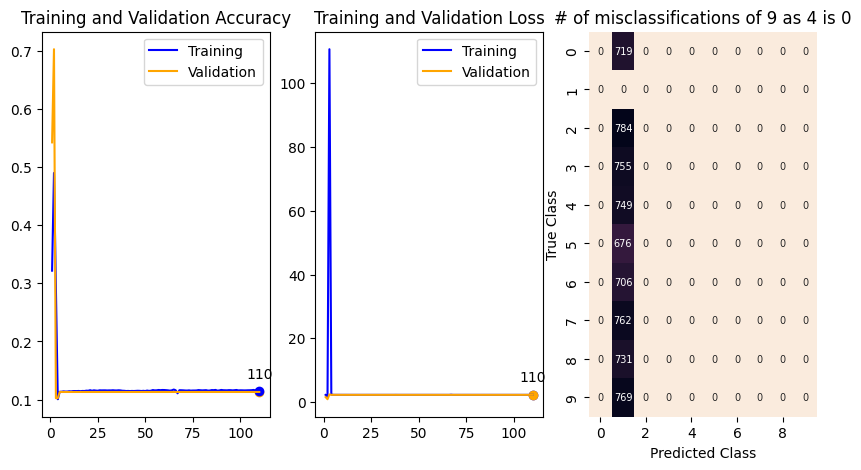

<Figure size 2000x1000 with 0 Axes>

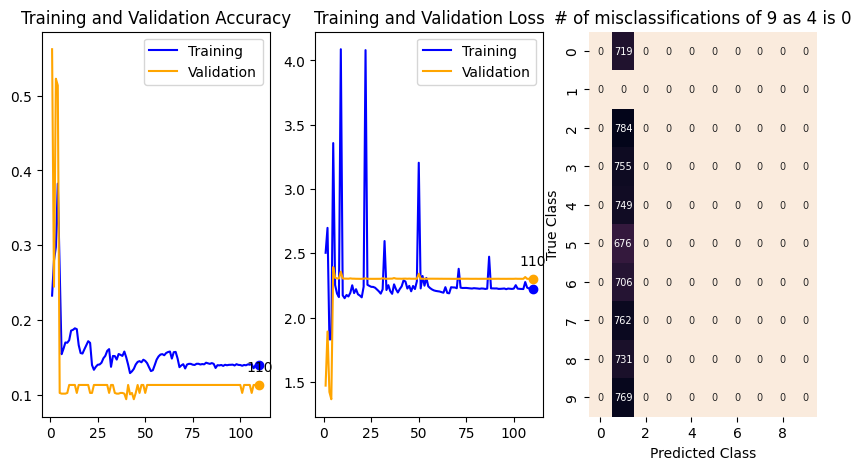

<Figure size 2000x1000 with 0 Axes>

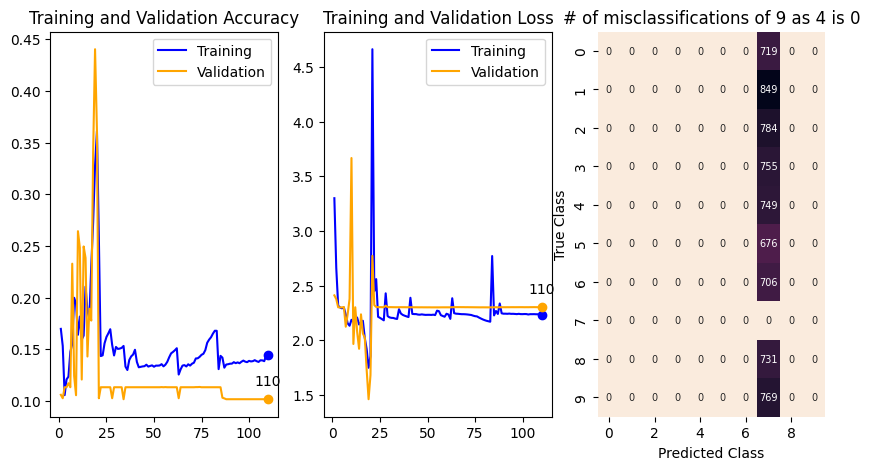

<Figure size 2000x1000 with 0 Axes>

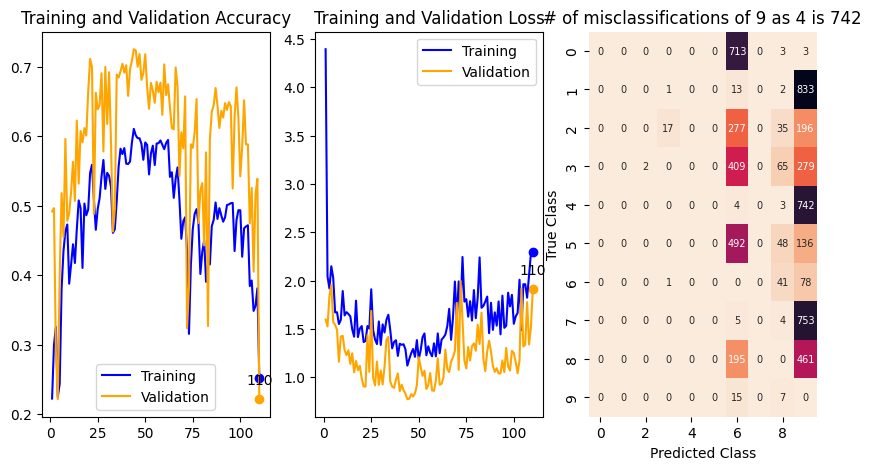

<Figure size 2000x1000 with 0 Axes>

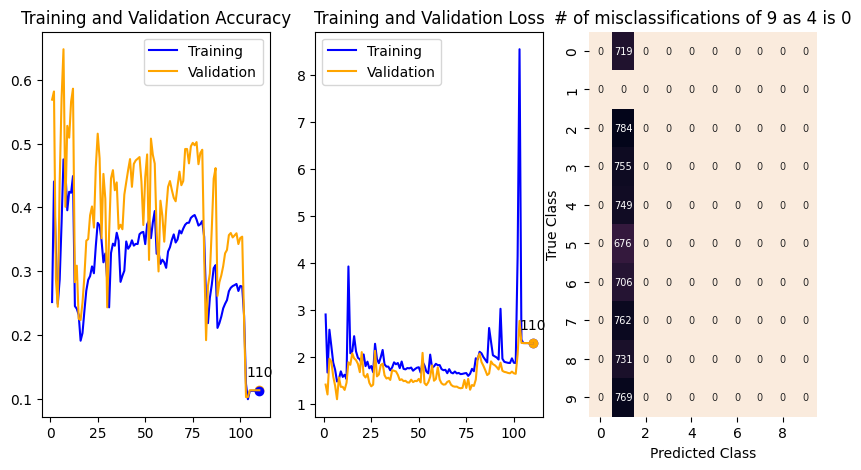

<Figure size 2000x1000 with 0 Axes>

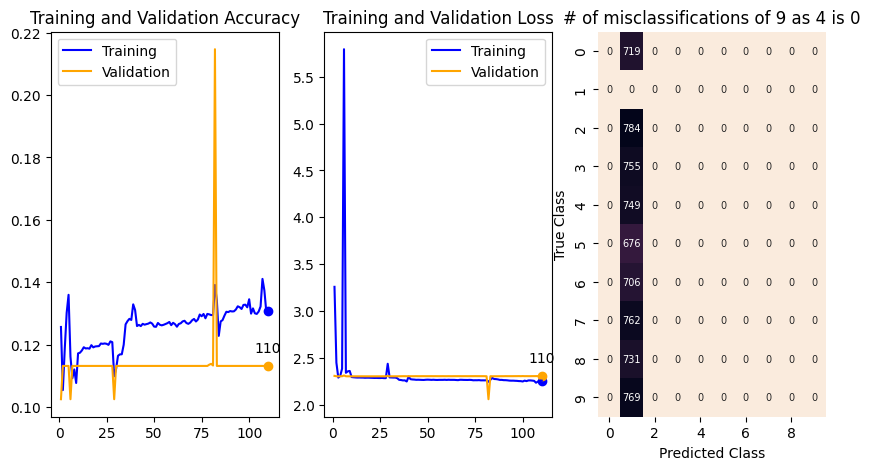

<Figure size 2000x1000 with 0 Axes>

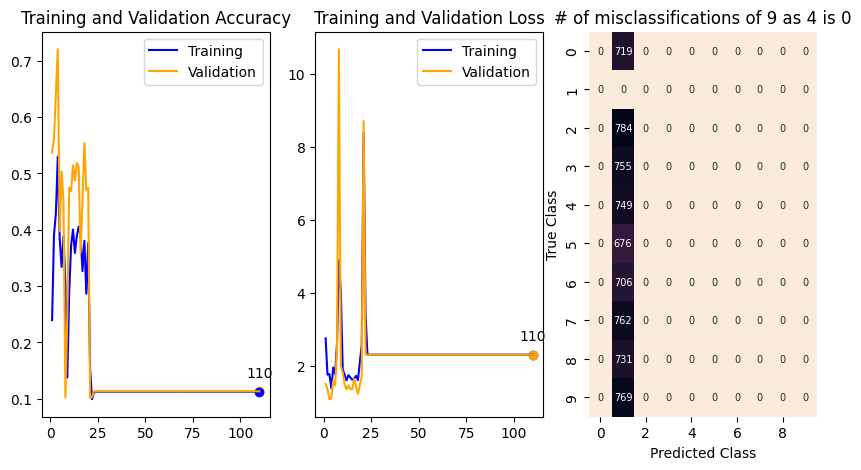

<Figure size 2000x1000 with 0 Axes>

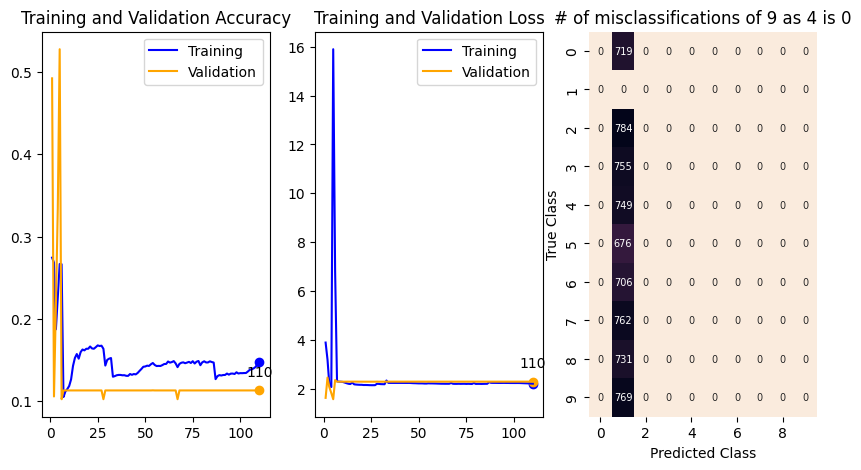

<Figure size 2000x1000 with 0 Axes>

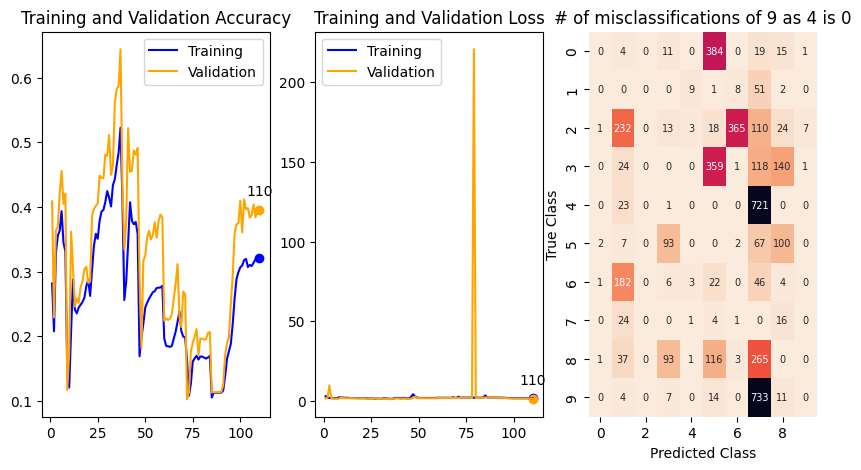

In [ ]:
for i in range(len(df["model_history"])):
  plot_model_history(df["model_history"][i], 110, df["model_history"][i].history["cm_per_epoch"][-1].reshape((10,10)))

  plt.gcf().set_size_inches(10, 5)  # this works 
  # plt.gcf().suptitle(f"Lambda Value {lambda_val} for {nb_epoch} Epochs and Patience {patience} " )

  





In [ ]:
df["model_history"][0].history["cm_per_epoch"][-1].reshape((10,10))

# 
#The 30th rep has 10 misclassified 9s as 4s 
# df["model_history"][29].history["cm_per_epoch"][-1].reshape((10,10))[9][4]


array([[711,   0,   1,   1,   0,   2,   2,   1,   1,   0],
       [  0, 836,   3,   4,   0,   1,   2,   0,   3,   0],
       [  1,   4, 756,   4,   3,   0,   4,   8,   4,   0],
       [  1,   0,   4, 735,   0,   5,   0,   4,   5,   1],
       [  1,   1,   1,   0, 726,   0,   6,   0,   0,  14],
       [  1,   1,   0,   9,   2, 645,   6,   2,   6,   4],
       [  5,   3,   1,   0,   4,   6, 685,   0,   2,   0],
       [  0,   9,  10,   2,   3,   0,   0, 729,   2,   7],
       [  8,   1,   1,   6,   6,   3,   4,   4, 694,   4],
       [  4,   3,   0,   5,  10,   8,   0,   5,   4, 730]])

Statistics

In [ ]:
# Needs to be re-done for multiple costs!

for x, group in df.groupby("cost"):
  
  print(" -------------- ")

  print("Group of Lambda-Value:",   x)

  print("The minimum Validation Loss occurred at the following epochs for the reps")


  for index in group.index:  
    print("index", index)
    sum_9T_4P = 0
    sum_4T_9P = 0
    for rep in range(1,len(group)+1):
      print(" -------------- ")

      # for epoch in range(len(group["model_history"][index].history["val_loss"])):
      #   print("Epoch:", epoch)
      # print("The minimum Validation Loss occurred at the following epochs for the reps")

      # for epoch_num in range(len(group["model_history"][index].history["val_loss"])):  #This tells you how many epochs there are
      print("Cost: ", k,  "Rep:", rep,  end="\t")
      print("Epoch: ", np.argmin(group["model_history"][index].history["val_loss"]), end="\t")
      print("CM_9T_4P at that epoch: ",  group["model_history"][index].history["cm_per_epoch"][np.argmin(group["model_history"][index].history["val_loss"])].reshape((10,10))[9][4]     , end="\t")
      print("CM_4T_9P at that epoch: ",  group["model_history"][index].history["cm_per_epoch"][np.argmin(group["model_history"][index].history["val_loss"])].reshape((10,10))[4][9]     )



      sum_9T_4P += group["model_history"][index].history["cm_per_epoch"][np.argmin(group["model_history"][index].history["val_loss"])].reshape((10,10))[9][4]  
      sum_4T_9P += group["model_history"][index].history["cm_per_epoch"][np.argmin(group["model_history"][index].history["val_loss"])].reshape((10,10))[4][9]  


    print("The average misclassifications of 9 as 4 if Early Stopping Took place: ", sum_9T_4P/len(group["model_history"]),   "\t ", ((sum_9T_4P/len(group["model_history"]))/np.sum(cm_all, axis=2)[0][9])*100 , "percent"   )
    print("The average reverse misclassifications of 4 as 9 if Early Stopping Took place: ", sum_4T_9P/len(group["model_history"]),   "\t ", ((sum_4T_9P/len(group["model_history"]))/np.sum(cm_all, axis=2)[0][4])*100 , "percent"   )


      # sum_94 = 0
      # sum_49 = 0

      # # for epoch_num in range(len(group["model_history"][rep].history["val_loss"])):  #This tells you how many epochs there are
      # #     # print(cm_all[j][9][4])
      # sum_49 += group["model_history"][epoch].history["cm_per_epoch"][-1].reshape((10,10))[4][9]
      # sum_94 += group["model_history"][rep].history["cm_per_epoch"][-1].reshape((10,10))[9][4]

      #     # print(sum_cm)

    print(" -------------- ")
      # print("The average misclassifications if taken out to the last training epoch: ", sum_94/len(cm_all), "\t ", (sum_94/np.sum(cm_all, axis=2)[0][9])*100 , "percent"   )
      # print("The average reverse misclassifications if taken out to the last training epoch: ", sum_49/len(cm_all), "\t ", (sum_49/len(cm_all)/np.sum(cm_all, axis=2)[0][4])*100 , "percent"   )

      # # Val # of 9s 769.0
      # #Get the original total number of 9s in the Val Set
      # np.sum(cm_all, axis=2)[0][9]

      # # Val # of 4s 749.0
      # np.sum(cm_all, axis=2)[0][4]


 -------------- 
Group of Lambda-Value: 10
The minimum Validation Loss occurred at the following epochs for the reps
index 0
 -------------- 
Cost:  1000 Rep: 1	Epoch:  65	CM_9T_4P at that epoch:  7	CM_4T_9P at that epoch:  22
 -------------- 
Cost:  1000 Rep: 2	Epoch:  65	CM_9T_4P at that epoch:  7	CM_4T_9P at that epoch:  22
 -------------- 
Cost:  1000 Rep: 3	Epoch:  65	CM_9T_4P at that epoch:  7	CM_4T_9P at that epoch:  22
 -------------- 
Cost:  1000 Rep: 4	Epoch:  65	CM_9T_4P at that epoch:  7	CM_4T_9P at that epoch:  22
 -------------- 
Cost:  1000 Rep: 5	Epoch:  65	CM_9T_4P at that epoch:  7	CM_4T_9P at that epoch:  22
 -------------- 
Cost:  1000 Rep: 6	Epoch:  65	CM_9T_4P at that epoch:  7	CM_4T_9P at that epoch:  22
 -------------- 
Cost:  1000 Rep: 7	Epoch:  65	CM_9T_4P at that epoch:  7	CM_4T_9P at that epoch:  22
 -------------- 
Cost:  1000 Rep: 8	Epoch:  65	CM_9T_4P at that epoch:  7	CM_4T_9P at that epoch:  22
 -------------- 
Cost:  1000 Rep: 9	Epoch:  65	CM_9T_4P at 

Taking the Average Confusion Matrix using the last confusion matrix per epoch, (per cost), divided by reps

In [ ]:
for k, group in df.groupby("cost"):  
  print(" -------------- ")
  print("Group of Lambda-Value:",   k)

  # print(group.index)
  # print(group) 
  
  total_cm_per_rep = np.zeros((10,10))
  for index in group.index:
    print("Index:",   index) 


    # for epoch in range(len(group["model_history"][index].history["val_loss"])):
    #   # print("index: ", index, "cost: ", k, "rep: ", rep)
    total_cm_per_rep += (group["model_history"][index].history["cm_per_epoch"][-1].reshape((10,10)))
    # print(total_cm_per_rep)
  print(pd.DataFrame(total_cm_per_rep/len(group.index)))

 -------------- 
Group of Lambda-Value: 10
Index: 0
Index: 1
Index: 2
Index: 3
Index: 4
Index: 5
Index: 6
Index: 7
Index: 8
Index: 9
Index: 10
Index: 11
Index: 12
Index: 13
Index: 14
Index: 15
Index: 16
Index: 17
Index: 18
Index: 19
        0       1       2       3       4       5       6       7       8  \
0  708.90    0.00    1.10    0.90    0.60    1.65    2.50    1.00    1.95   
1    0.00  836.20    2.75    2.85    0.05    1.80    1.35    0.65    3.25   
2    2.85    2.50  763.15    2.50    1.60    0.35    2.25    6.20    2.55   
3    0.80    0.05    5.60  731.35    0.05    6.95    0.00    5.90    3.45   
4    0.95    0.25    2.30    0.00  718.15    0.00    5.75    0.95    1.50   
5    2.50    0.45    0.35    9.90    2.20  645.50    5.20    1.40    5.10   
6    6.75    2.40    1.95    0.00    5.20    3.75  684.00    0.05    1.90   
7    1.65    7.75    8.75    4.55    3.00    0.10    0.00  727.40    1.45   
8    6.30    1.65    2.40    5.40    4.25    4.00    2.10    5.40  696.20 

In [ ]:

for k, group in df.groupby("cost"):
  
  print(" -------------- ")

  print("Group of Lambda-Value:",   k)

  # print(group.index)
  # print(group)
  for index in group.index:
    print(index)
    for rep in range(1,len(group)+1):
      print("Rep: ", rep)
       


      for epoch in range(len(group["model_history"][index].history["cm_per_epoch"])):
        # print("index: ", index, "cost: ", k, "rep: ", rep, "epochs: ", epoch) #"last cm:", group["model_history"][index].history["cm_per_epoch"][rep].reshape((10,10)))
        # print("epoch: ", epoch)




SyntaxError: ignored

Scratch

In [2]:
# list1 = [0,0,0,0,1]
list1 = [0,1,0,0,0]


count = 1
prev_lambda_value = list1[0]
print("Initialize model with lambda: ", prev_lambda_value)


for lambda_value in list1:

    print("Bin: ", count, " ", end="")

    if lambda_value != prev_lambda_value:
        print(f"lambda_value {lambda_value} is different than previous lambda_value {prev_lambda_value} so save current weights and then compile with weight {lambda_value}")

    else:
      print(f"lambda_value {lambda_value} is equal to previous lambda_value {prev_lambda_value} so continue training {lambda_value}")
      

    count+=1
    prev_lambda_value = lambda_value

Initialize model with lambda:  0
Bin:  1  Element 0 is equal to previous element 0 so continue training 0
Bin:  2  Element 1 is different than previous element 0 so save current weights and then compile with weight 1
Bin:  3  Element 0 is different than previous element 1 so save current weights and then compile with weight 0
Bin:  4  Element 0 is equal to previous element 0 so continue training 0
Bin:  5  Element 0 is equal to previous element 0 so continue training 0


If I want to continue training with the current cost_matrix this seems to work

```

model = create_model(0)
# save the model weights
model.save_weights('initial_0epochs.h5')
model.compile(loss=WeightedCategoricalCrossentropy(cost_matrix), optimizer=sgd,  metrics='categorical_accuracy',)

model_history = model.fit(X_train, Y_train,  batch_size=batch_size, epochs=2, verbose=2,
         validation_data=(X_val, Y_val), shuffle=True, use_multiprocessing=True, callbacks = [ cm_callback, f1_callback])

model.save_weights('initial_2epochs.h5')

 
#Continue Training with no change
model_history2 = model.fit(X_train, Y_train,  batch_size=batch_size, epochs=2, verbose=2,
         validation_data=(X_val, Y_val), shuffle=True, use_multiprocessing=True, callbacks = [ cm_callback, f1_callback])

model.save_weights('initial2_lambda_next2_lambda.h5')```



To switch the cost-matrix and then continue training thsi seems to work

```
model = create_model(0)
# save the model weights
model.save_weights('initial_0epochs.h5')
model.compile(loss=WeightedCategoricalCrossentropy(cost_matrix), optimizer=sgd,  metrics='categorical_accuracy',)

model_history = model.fit(X_train, Y_train,  batch_size=batch_size, epochs=2, verbose=2,
         validation_data=(X_val, Y_val), shuffle=True, use_multiprocessing=True, callbacks = [ cm_callback, f1_callback])

model.save_weights('initial_2epochs.h5')

model = create_model(0)
cost_matrix[Truth, Predicted] = 100
model.compile(loss=WeightedCategoricalCrossentropy(cost_matrix), optimizer=sgd,  metrics='categorical_accuracy',)
model.load_weights('initial_2epochs.h5')
 
#Continue Training with no change
model_history2 = model.fit(X_train, Y_train,  batch_size=batch_size, epochs=2, verbose=2,
         validation_data=(X_val, Y_val), shuffle=True, use_multiprocessing=True, callbacks = [ cm_callback, f1_callback])

model.save_weights('initial2_1_next2_100.h5')
```



Scratch work

In [133]:
def save_tf_model_weights(model, file_string):


    final_weights = file_string + ".h5"
    model.save_weights(final_weights)

    weights = model.get_weights()

    df = pd.DataFrame(weights)

    csv_file_name = file_string + ".csv"
    pkl_file_name = file_string + ".pkl"


    df.to_csv(csv_file_name, index=False)
    with open(pkl_file_name, 'wb') as f:
        pickle.dump(weights, f)
    print('Model weights saved to CSV and Pickle files.')


In [134]:
# SET THE IITIAL LAMBDA VALUE! 
cost_matrix = np.ones((10,10))
lambda_val = 1

Truth=9
Predicted=4
cost_matrix[Truth, Predicted] = lambda_val

In [157]:
#Import
import pandas as pd 
import pickle


#Define 11 Test Runs:
list1 = [0,0,0,0,1]
list2 = [0,1,0,0,0]

#List all 11 Test Runs in Array:
# list_of_test_runs = [list1, list2]
list_of_test_runs = [list2]


#Create dataframe to store all the information
data = {'rep': [], 'bins': [], 'lambdas': [], 'model_history': [], 'final_saved_weights': []}
scratch_df = pd.DataFrame(data)



#Start For-Loop by looking at the individual lists of lambda-values inside the test run lists:
for test_run in list_of_test_runs:

  print(f"Starting with test-run of Lambdas {test_run} :")

  
  model_history = {}
  # for rep in [0,1]:
  for rep in [0]:

    model_weights_string = "rep" + str(rep) + "_"
    print(" ------------------------------------- ")
    count = 1                #This is the BIN COUNT
    print(f"Rep {rep} :")

    
    prev_lambda_value = test_run[0]

    print("Initialize model with lambda: ", prev_lambda_value)
    print(f"     Call function INITIALIZE MODEL with parameters REP {rep} and test_run[0] LambdaValue {test_run[0]}  ")

    #"Initialize Model Function" for variable MODEL
    model = create_model(i=rep)

    
    #Compile the initial model with the first-lambda-value of the current-test-run
    cost_matrix[Truth, Predicted] = prev_lambda_value
    model.compile(loss=WeightedCategoricalCrossentropy(cost_matrix), optimizer=sgd,  metrics='categorical_accuracy',)

    #I dont call "training" yet, I've compiled with the initial weight, and then I allow my for-loop to start/continue the training everytime the lambdavalue is the same 


    #There are currently "5-lambda_values" in each of the test-run-arrays, which means there are 5-equally-sized-bins.  The lambda_value is the lambda-values
    for lambda_value in test_run:
  
        print("Bin: ", count, " ", end="")
        
        #If current lambda_value is different then the previous lambda value, save weights, re-compile with different lambda, and training for 110/5 epochs:
        #
        if lambda_value != prev_lambda_value:
            # print(f"lambda_value {lambda_value} is different than previous lambda_value {prev_lambda_value} so save current weights as model_weights: {model_weights_string} and then compile with weight {lambda_value}")
            print(f"   Call function CHANGE MODEL with parameters REP {rep} and NEXT LambdaValue in List {lambda_value} to train for epochs __{110/5}___ ")
            weights = model.get_weights()
            temp_var = model_weights_string + ".h5"
            model.save_weights(temp_var)

            #"Create new model" with same name MODEL
            model = create_model(i=rep)
            model.set_weights(weights)
            #Compile the "new" model with the next-lambda-value of the current-test-run
            cost_matrix[Truth, Predicted] = lambda_val
            model.compile(loss=WeightedCategoricalCrossentropy(cost_matrix), optimizer=sgd,  metrics='categorical_accuracy',)

            #Continue training for 110/5 epochs
            model_history2 = model.fit(X_train, Y_train,  batch_size=batch_size, epochs=1, verbose=2, validation_data=(X_val, Y_val), shuffle=True, use_multiprocessing=True, callbacks = [ cm_callback, f1_callback])
            print("Model History 2 Loss so far", model_history2.history['loss'],"\n\n")
          
            try:
              print("trying")
              model_history = {key: model_history[key] + model_history2.history[key] for key in model_history2.history.keys()}
            except KeyError:
              print("Key Error")  
              model_history = {key: model_history2.history[key] for key in model_history2.history.keys()}
            finally:
              print("Finaly")  

            print("Model History (New) Loss so far", model_history['loss'],"\n\n")


        #If current lambda_value is the same as previous lambda value, continue training for 110/5 epochs:
        #
        else:
          # print(f"lambda_value {lambda_value} is equal to previous lambda_value {prev_lambda_value} so continue training {lambda_value} for epochs __{110/5}")
          print(f"     Call function CONTINUE TRAIING ")
          model_history1 = model.fit(X_train, Y_train,  batch_size=batch_size, epochs=1, verbose=2, validation_data=(X_val, Y_val), shuffle=True, use_multiprocessing=True, callbacks = [ cm_callback, f1_callback])
          print("Model History 1 Loss so far", model_history1.history['loss'],"\n\n")

          try:
            print("Trying")
            model_history = {key: model_history[key] + model_history1.history[key] for key in model_history1.history.keys()}
          except KeyError:
            print("Key Error")
            model_history = {key: model_history1.history[key] for key in model_history1.history.keys()}
          finally:
            print("Finally")
            # model_history = {key: model_history1.history[key] for key in model_history1.history.keys()}


          # print( model_history.history[key] for key in model_history.history.keys())
          print("Model History (New) Loss so far", model_history['loss'],"\n\n")

        count+=1
        prev_lambda_value = lambda_value         
        model_weights_string = model_weights_string + str(lambda_value) + "_"

    
    print(f"Save final weights as {model_weights_string}")
    save_tf_model_weights(model, model_weights_string)


    # with open('tf_model_weights.pkl', 'wb') as f:
    # pickle.dump(weights, f)
    # get current date and time
    now = datetime.datetime.now()


    scratch_df = pd.concat([scratch_df, pd.DataFrame({'rep': rep, 'bins': 5, 'lambdas': [test_run], 'model_history': [model_history], 'final_saved_weights_string': model_weights_string ,  
      'loss': [model_history['loss']],
      'categorical_accuracy': [model_history['categorical_accuracy']],
      'val_loss': [model_history['val_loss']],
      'val_categorical_accuracy': [model_history['val_categorical_accuracy']],
      '9T_4P': [model_history['9T_4P']],
      '4T_9P': [model_history['4T_9P']],
      '0T_Acc': [model_history['0T_Acc']],
      '1T_Acc': [model_history['1T_Acc']],
      '2T_Acc': [model_history['2T_Acc']],
      '3T_Acc': [model_history['3T_Acc']],
      '4T_Acc': [model_history['4T_Acc']],
      '5T_Acc': [model_history['5T_Acc']],
      '6T_Acc': [model_history['6T_Acc']],
      '7T_Acc': [model_history['7T_Acc']],
      '8T_Acc': [model_history['8T_Acc']],
      '9T_Acc': [model_history['9T_Acc']],
      'cm_per_epoch': [model_history['cm_per_epoch']],
      'f1_micro': [model_history['f1_micro']],
      'f1_macro': [model_history['f1_macro']],
      'f1_weighted': [model_history['f1_weighted']],
      'f1_notweighted': [model_history['f1_notweighted']],
                   "datetime": now.strftime("%Y-%m-%d %H:%M:%S")
                                    })], ignore_index=True)

  print(" ------------------------------------- ")

  # print(scratch_df)

Starting with test-run of Lambdas [0, 1, 0, 0, 0] :
 ------------------------------------- 
Rep 0 :
Initialize model with lambda:  0
     Call function INITIALIZE MODEL with parameters REP 0 and test_run[0] LambdaValue 0  
Bin:  1       Call function CONTINUE TRAIING 
235/235 - 3s - loss: 0.9213 - categorical_accuracy: 0.6888 - val_loss: 0.3781 - val_categorical_accuracy: 0.8836 - 9T_4P: 95.0000 - 4T_9P: 22.0000 - 0T_Acc: 0.9624 - 1T_Acc: 0.9658 - 2T_Acc: 0.8559 - 3T_Acc: 0.8530 - 4T_Acc: 0.9346 - 5T_Acc: 0.8343 - 6T_Acc: 0.9249 - 7T_Acc: 0.8635 - 8T_Acc: 0.8605 - 9T_Acc: 0.7750 - cm_per_epoch: 75.0000 - f1_micro: 0.8836 - f1_macro: 0.8823 - f1_weighted: 0.8832 - f1_notweighted: 0.8823 - 3s/epoch - 13ms/step
Model History 1 Loss so far [0.9212526679039001] 


Trying
Key Error
Finally
Model History (New) Loss so far [0.9212526679039001] 


Bin:  2     Call function CHANGE MODEL with parameters REP 0 and NEXT LambdaValue in List 1 to train for epochs __22.0___ 
235/235 - 3s - loss: 0.488

/usr/local/lib/python3.10/dist-packages/pandas/core/internals/construction.py:568: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.array([convert(v) for v in values])


In [152]:
model_history['loss']

[0.9212526679039001]

In [147]:
for k in model_history.history.keys():
  print("'", end="")
  # print("model_history_", end="")
  print(k, end="")
  print("'", end="")
  print(": ", end="")
  print( "[model_history.history", end="")
  print("['", end="")
  # print("model_history_", end="")
  print(k, end="")
  print("']],", end="")
  print()

model_history['loss']

AttributeError: ignored